# <center>CSE 546: Reinforcement Learning</center>
## <center>Instructor: Prof. Alina Vereshchaka</center>
## <center>Anip Kumar Paul</center>
### <center>Assignment 1, Part 1 and Part 2</center>

In [1]:
! pip install gymnasium matplotlib numpy

In [2]:
!pip install imageio
!pip install tqdm

In [116]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 3.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.7 MB/s eta 0:00:00


In [3]:
# Libaries 
import gymnasium as gym
from gymnasium import spaces
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import os
import imageio
from tqdm import tqdm

In [4]:
# The size of the grid is 6x6
grid = np.zeros((6,6))
print(grid)

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]


# Environment Scenarios: Warehouse Robot

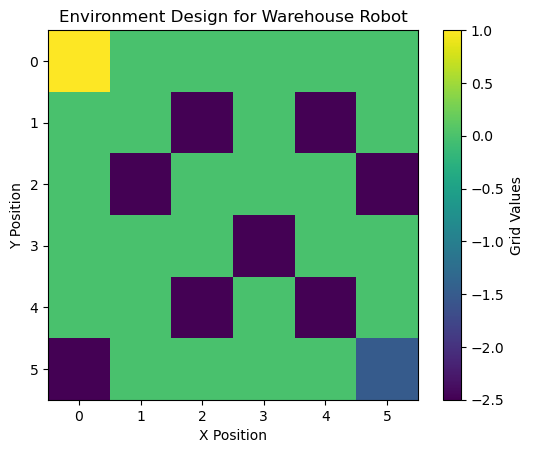

In [86]:
grid = np.zeros((6,6))
# Defining initial and goal for our agent
pos1 = [0, 0]  # This is my initial position
pos5 = [5, 5]  # This is my goal position
grid[tuple(pos1)] = 1.0
grid[tuple(pos5)] = -1.5

# Obstacle position in grid
obstacles = [(1, 4), (1, 2), (2, 1), (2, 5), (3, 3), (4, 2), (4, 4), (5, 0)]
for obstacle in obstacles:
    grid[obstacle] = -2.5

plt.imshow(grid)
plt.colorbar(label='Grid Values')
plt.title('Environment Design for Warehouse Robot')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.show()

In [89]:

class WarehouseEnv(gym.Env):
    metadata = { 'render.modes': [] }
    
    def __init__(self, env_type = 'Deterministic', use_q_learning = True):
        
        self.env_type = env_type
        self.grid_size = (6, 6)
        self.env_width = 6
        self.env_height = 6
        self.observation_space = spaces.Discrete(self.env_width * self.env_height)
        
        self.max_timesteps = 15
        self.timestep = 0
        self.agent_pos = np.asarray([0, 0])
        self.item_pos = np.asarray([2, 2])
        self.item_quantity = 1
        self.goal_pos = np.asarray([5, 5])
        self.has_item = False
        self.use_q_learning = use_q_learning
        
        self.state = np.zeros((6,6))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 0.5
        self.action_space = spaces.Discrete(6)
        self.obstacle = np.asarray([(1, 4), (1, 2), (2, 1), (2, 5), (3, 3), (4, 2), (4, 4), (5, 0)])
        
        
        

    # Reset environment for the iitial state
    def reset(self, **kwargs):

        self.state = np.zeros((6,6))
        self.agent_pos = np.asarray([0, 0])
        self.item_pos = np.asarray([2, 2])
        self.goal_pos = np.asarray([5, 5])
        self.has_item = False
        self.obstacle = np.asarray([(1, 4), (1, 2), (2, 1), (2, 5), (3, 3), (4, 2), (4, 4), (5, 0)])
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 0.5
        observation = self.state.flatten()

        info = {}

        return observation, info
    
    
    def step(self, action):
        reward = -1  # Default penalty for taking a step to encourage efficiency
        terminated = False
        truncated = False
        
        if (self.env_type == 'Stochastic'):
            action_prob = np.random.random() 
            if action in [0, 1, 2, 3]:
                if action_prob <= 0.9:  #  I consider the 90% chance to take the chosen action
                    chosen_action = action
                else:
                # consider the 10% chance to choose a random action
                    possible_actions = [0, 1, 2, 3]  # This is my all possible actions
                    possible_actions.remove(action)  
                    chosen_action = np.random.choice(possible_actions)
            else:
            # Deterministic behavior
                chosen_action = action
        else:
        # Deterministic environment
            chosen_action = action
        
        if chosen_action == 0: #down
            self.agent_pos[0] += 1
        if chosen_action == 1: #up
            self.agent_pos[0] -= 1
        if chosen_action == 2: #right
            self.agent_pos[1] += 1
        if chosen_action == 3: #left
            self.agent_pos[1] -= 1
        if chosen_action == 4:
            if np.array_equal(self.agent_pos, self.item_pos):
                self.has_item = True
                reward = 10  # I have added extra reward for successfully picking up the item
            else:
                reward = -1  # I have assigned Minor penalty for invalid pick-up attempt

        if chosen_action == 5:
            if np.array_equal(self.agent_pos, self.goal_pos) and self.has_item:
                reward = 20  # For drop off the item Successfully
                terminated = True  # Episode will end after successful delivery
            else:
                reward = -1  # I add minor penalty for invalid drop-off attempt
        
        self.agent_pos = np.clip(self.agent_pos, 0, self.grid_size[0] - 1)
        
        if tuple(self.agent_pos) in self.obstacle:
            reward = -20  # Penalize for hitting an obstacle
    
        else:
            self.state = np.zeros(self.grid_size)
            self.state[tuple(self.agent_pos)] = 1  
            self.state[tuple(self.goal_pos)] = 0.5  
            if self.has_item:
                self.state[tuple(self.item_pos)] = 0  # When item picked up, the location will be cleared
            else:
                self.state[tuple(self.item_pos)] = 0.8
                
        observation = self.state.flatten()
        self.timestep += 1
        terminated = np.array_equal(self.agent_pos, self.goal_pos) and self.has_item
        truncated = not np.all((np.asarray(self.agent_pos) >= 0) & (np.asarray(self.agent_pos) < self.grid_size[0]))
        info = {}
        return observation, reward, terminated, truncated, info



    def render(self, mode='human', plot=True):

        fig, ax = plt.subplots(figsize=(5, 5))
        ax.set_xlim(-0.5, 5.5)
        ax.set_ylim(0, 6)
        plt.xticks([0, 1, 2, 3, 4, 5])
        plt.yticks([0, 1, 2, 3, 4, 5])
        ax.set_ylim(self.grid_size[0] - 0.5, -0.5)
        ax.add_patch(plt.Rectangle((self.agent_pos[1] - 0.5, self.agent_pos[0] - 0.5), 1, 1, color='yellow'))
        ax.add_patch(plt.Rectangle((self.goal_pos[1] - 0.5, self.goal_pos[0] - 0.5), 1, 1, color='green'))

        for obstacle in self.obstacle:
            ax.add_patch(plt.Rectangle((obstacle[1] - 0.5, obstacle[0] - 0.5), 1, 1, color='blue'))
            
        if not self.has_item and self.item_pos is not None:
            ax.add_patch(plt.Rectangle((self.item_pos[1] - 0.5, self.item_pos[0] - 0.5), 1, 1, color='red'))

        if plot:
            plt.title('Environment for the Warehouse Robot')
            plt.show()
        else:
            fig.canvas.draw()
            img = np.array(fig.canvas.renderer.buffer_rgba())[:, :, :3]
            plt.close(fig)
            return img

# Warehouse Environment

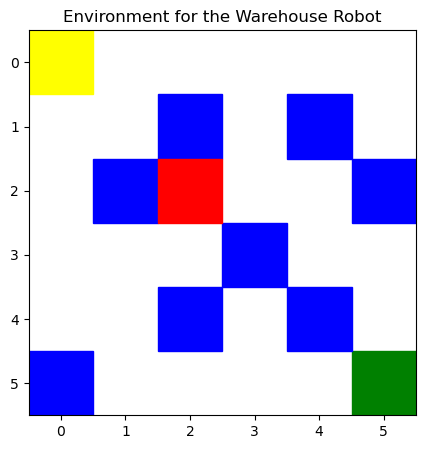

In [90]:
# We choose our environment is deterministic 
env = WarehouseEnv(env_type='Desktop/eterministic')
terminated, truncated = False, False
obs, info = env.reset()
env.render()


# Robot moving positions 

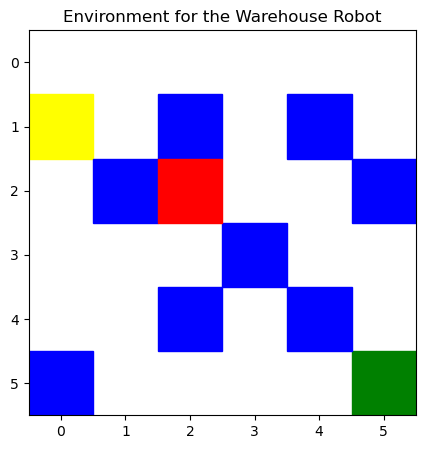

In [91]:
action = 0
observation, reward, done, truncated, info = env.step(action)
env.render()


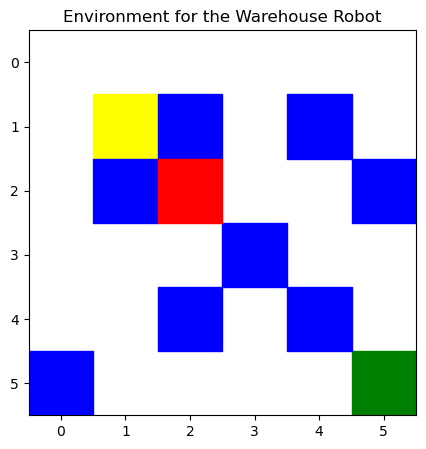

In [92]:
action = 2
observation, reward, done, truncated, info = env.step(action)
env.render()

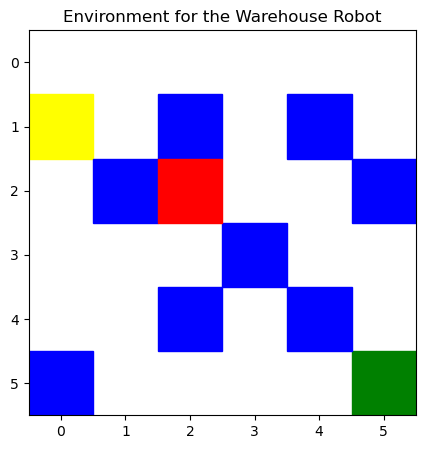

In [93]:
action = 3
observation, reward, done, truncated, info = env.step(action)
env.render()

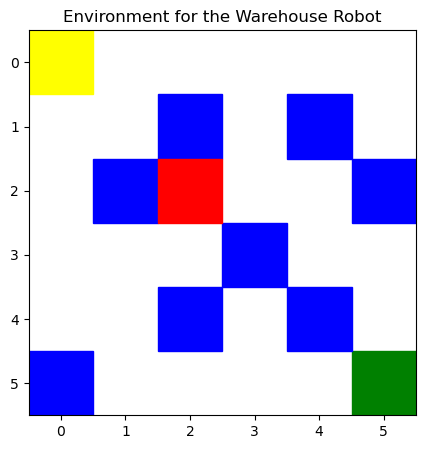

In [94]:
action = 1
observation, reward, done, truncated, info = env.step(action)
env.render()

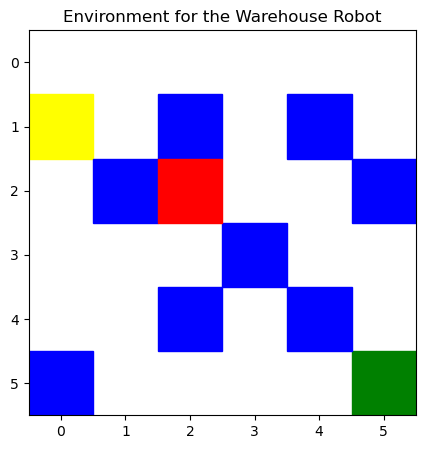

In [95]:
action = 0
observation, reward, done, truncated, info = env.step(action)
env.render()

# Design the Random Agent for Deterministic Environment

In [96]:

class RandomAgent:
    def __init__(self, env):
        self.env = env
# Move to pick up the item 
    def step(self, obs):
        if not self.env.has_item:
            target_pos = self.env.item_pos
        else:
            target_pos = self.env.goal_pos

        diff = [target_pos[0] - self.env.agent_pos[0], target_pos[1] - self.env.agent_pos[1]]

        
        if diff[0] > 0:
            # Agent will go down
            return 0  
        elif diff[0] < 0:
            # Agent will go up
            return 1  
        elif diff[1] > 0:
            # Agent will go right
            return 2
        elif diff[1] < 0:
            # Agent will go left
            return 3 

        if np.array_equal(self.env.agent_pos, self.env.item_pos):
            return 4  
        # Droping in the goal position
        elif np.array_equal(self.env.agent_pos, self.env.goal_pos) and self.env.has_item:
            return 5  

        return np.random.choice([0, 1, 2, 3])


Timestep: 1
Action: 0, Reward: -20, Terminated: False, Truncated: False


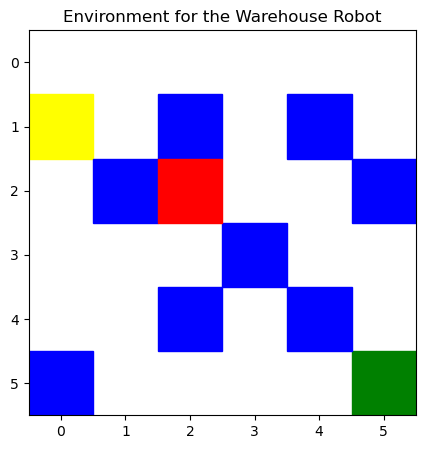

Timestep: 2
Action: 0, Reward: -20, Terminated: False, Truncated: False


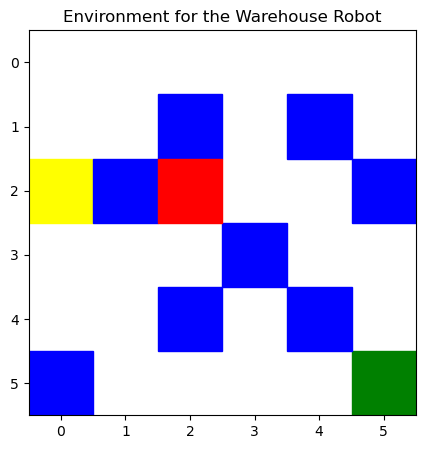

Timestep: 3
Action: 2, Reward: -20, Terminated: False, Truncated: False


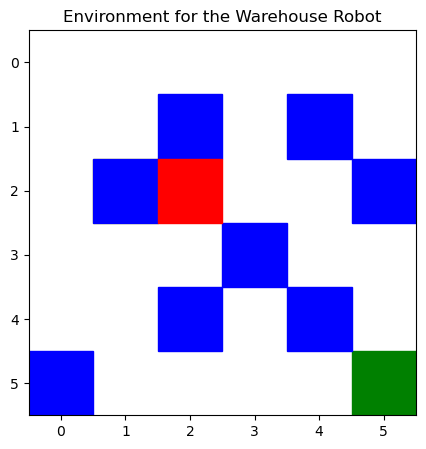

Timestep: 4
Action: 2, Reward: -20, Terminated: False, Truncated: False


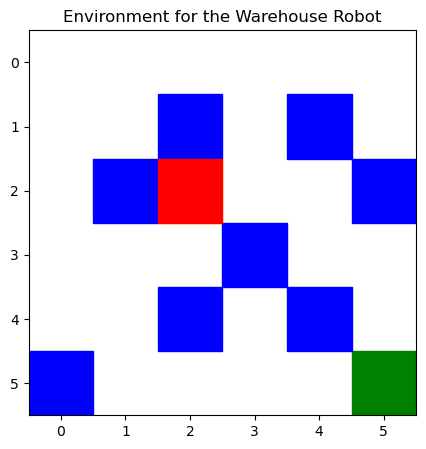

Timestep: 5
Action: 4, Reward: -20, Terminated: False, Truncated: False


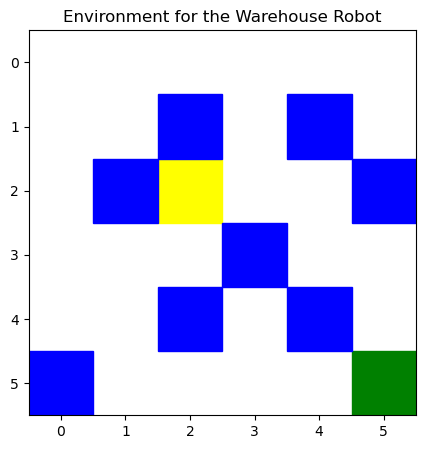

Timestep: 6
Action: 0, Reward: -20, Terminated: False, Truncated: False


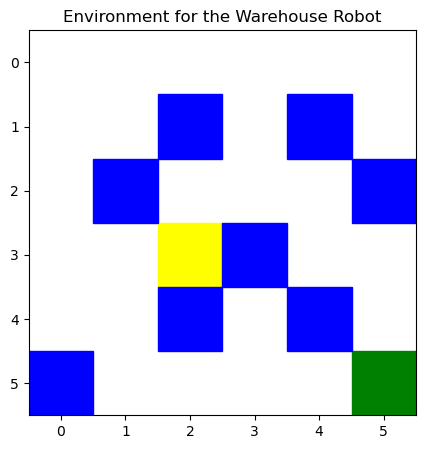

Timestep: 7
Action: 0, Reward: -20, Terminated: False, Truncated: False


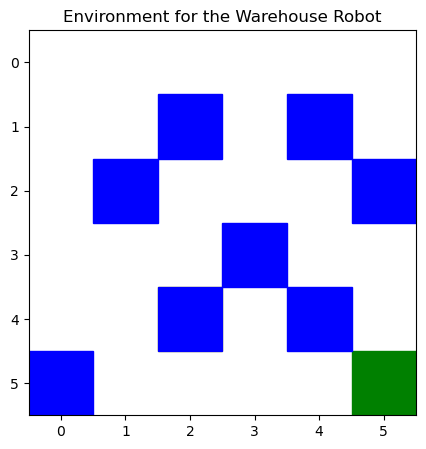

Timestep: 8
Action: 0, Reward: -20, Terminated: False, Truncated: False


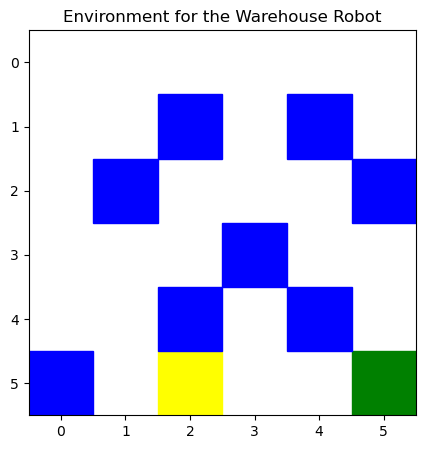

Timestep: 9
Action: 2, Reward: -20, Terminated: False, Truncated: False


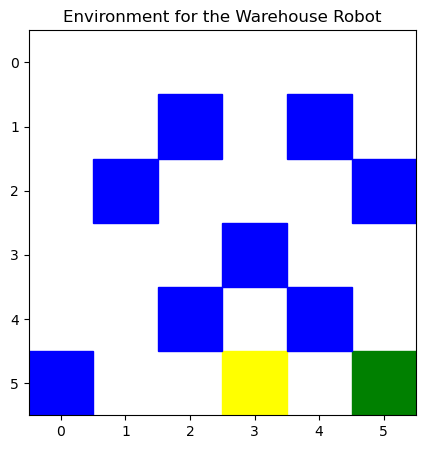

Timestep: 10
Action: 2, Reward: -20, Terminated: False, Truncated: False


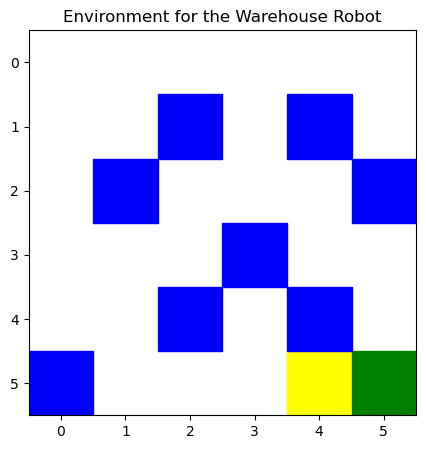

Timestep: 11
Action: 2, Reward: -20, Terminated: True, Truncated: False


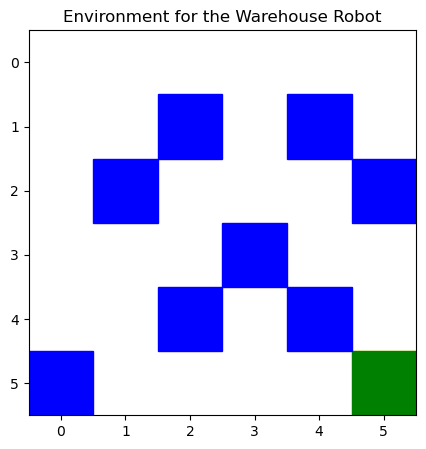

Episode ended.


In [97]:
# I have demonstrated here the movement of the agent.

if __name__ == '__main__':
    env = WarehouseEnv(env_type='deterministic') 
    agent = RandomAgent(env)

    obs, info = env.reset()
    terminated, truncated = False, False

    # I have run the agent upto 15 steps
    for timestep in range(15):
        action = agent.step(obs)

        obs, reward, terminated, truncated, info = env.step(action)

        print(f'Timestep: {timestep + 1}')
        print(f'Action: {action}, Reward: {reward}, Terminated: {terminated}, Truncated: {truncated}')
        
        # I have display the movement of the robot in warehouse
        env.render()

        if terminated or truncated:
            print("Episode ended.")
            break


# Design the Random Agent for Stochastic Environment

Timestep: 1
Action: 0, Reward: -20, Terminated: False, Truncated: False


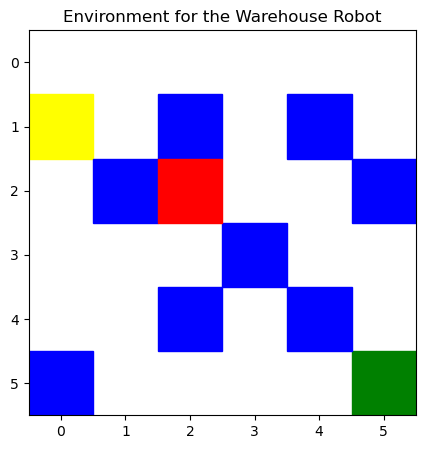

Timestep: 2
Action: 0, Reward: -20, Terminated: False, Truncated: False


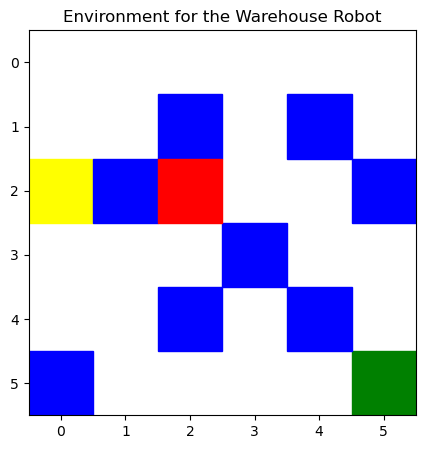

Timestep: 3
Action: 2, Reward: -20, Terminated: False, Truncated: False


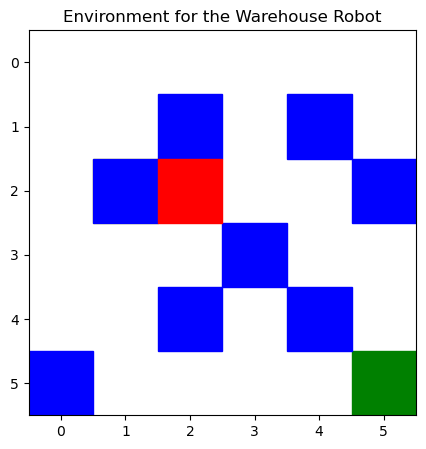

Timestep: 4
Action: 2, Reward: -20, Terminated: False, Truncated: False


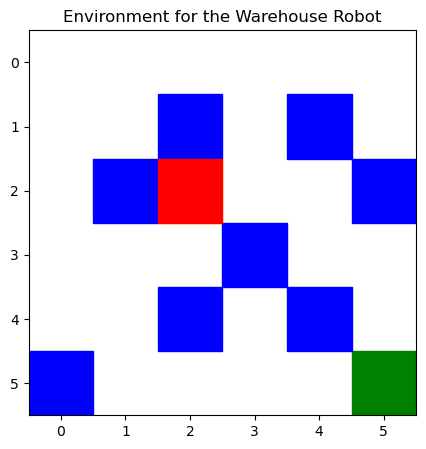

Timestep: 5
Action: 4, Reward: -20, Terminated: False, Truncated: False


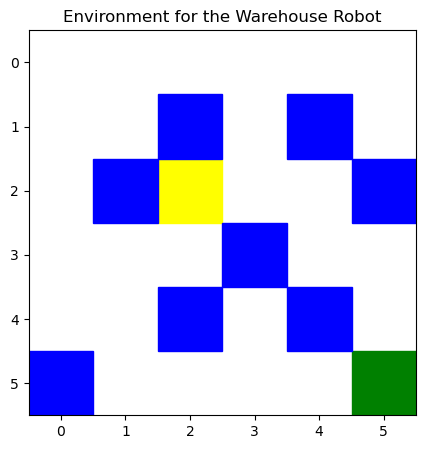

Timestep: 6
Action: 0, Reward: -20, Terminated: False, Truncated: False


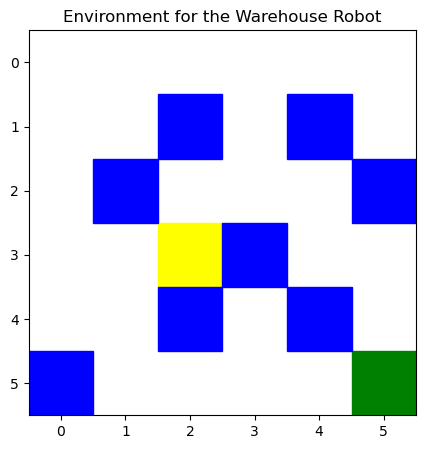

Timestep: 7
Action: 0, Reward: -20, Terminated: False, Truncated: False


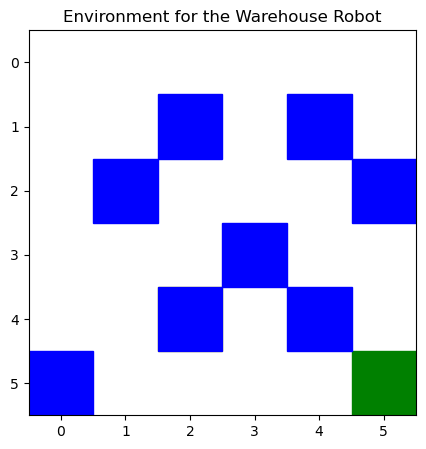

Timestep: 8
Action: 0, Reward: -20, Terminated: False, Truncated: False


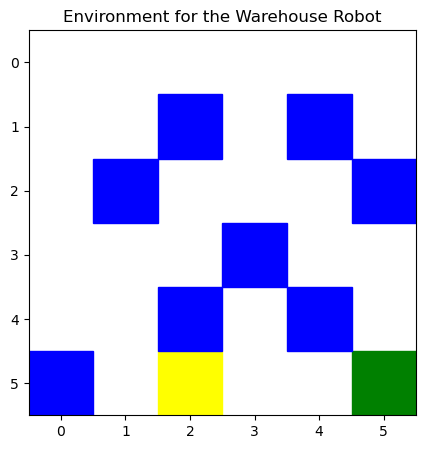

Timestep: 9
Action: 2, Reward: -20, Terminated: False, Truncated: False


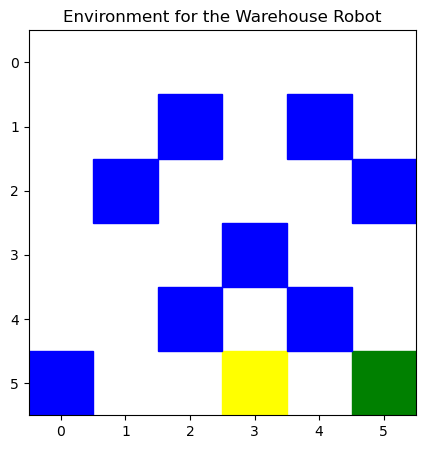

Timestep: 10
Action: 2, Reward: -20, Terminated: False, Truncated: False


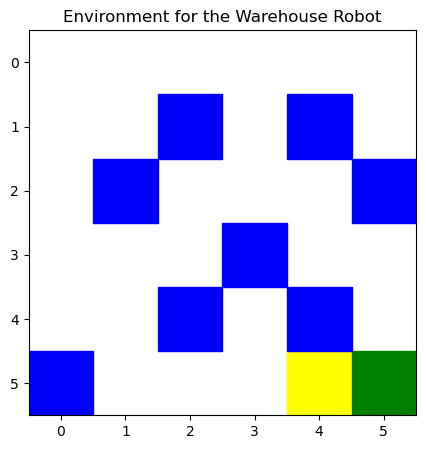

Timestep: 11
Action: 2, Reward: -20, Terminated: False, Truncated: False


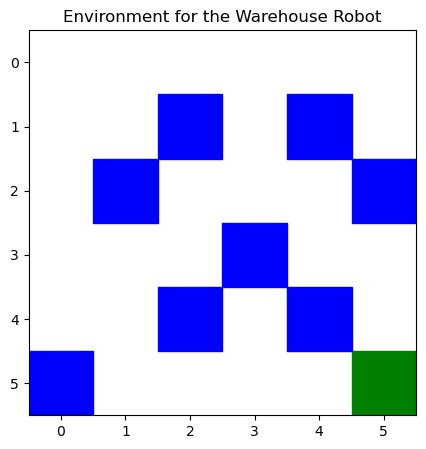

Timestep: 12
Action: 0, Reward: -20, Terminated: False, Truncated: False


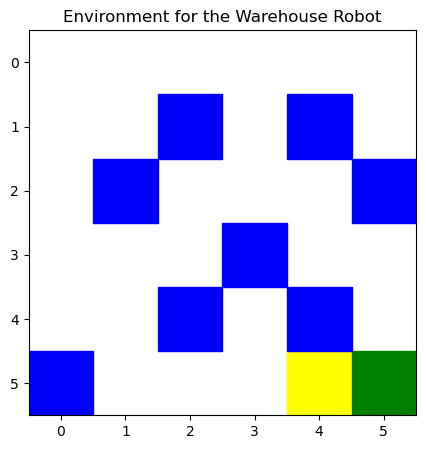

Timestep: 13
Action: 2, Reward: -20, Terminated: True, Truncated: False


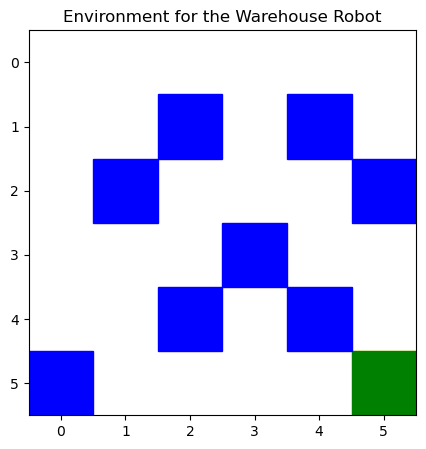

Episode ended.


In [98]:
if __name__ == '__main__':
    env = WarehouseEnv(env_type='Stochastic', use_q_learning=False) 
    agent = RandomAgent(env)

    obs, info = env.reset()
    terminated, truncated = False, False

    # I have run the agent upto 15 steps
    for timestep in range(15):
        action = agent.step(obs)

        obs, reward, terminated, truncated, info = env.step(action)

        print(f'Timestep: {timestep + 1}')
        print(f'Action: {action}, Reward: {reward}, Terminated: {terminated}, Truncated: {truncated}')
        
        # I have display the movement of the robot in warehouse
        env.render()

        # Stop if the episode is over
        if terminated or truncated:
            print("Episode ended.")
            break


# Part 2.1: Q Learning

In [99]:
# Apply the Q Learning algorithm
class whqlearning:
    def __init__(self, env, learning_rate=0.1, discount_rate=0.99, epsilon=1.0, epsilon_decay=0.995, min_epsilon=0.01):
        """
        Initializes the Q-learning agent for the warehouse environment.
        Args:
            env: The warehouse environment object.
            learning_rate: Learning rate for Q-value updates (alpha).
            discount_rate: Discount factor for future rewards (gamma).
            epsilon: Exploration rate for epsilon-greedy policy.
            epsilon_decay: Decay rate for epsilon after each episode.
            min_epsilon: Minimum value for epsilon (to prevent infinite exploration).
        """
        self.env = env
        self.learning_rate = learning_rate
        self.discount_rate = discount_rate
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.min_epsilon = min_epsilon
        self.state_space_size = env.grid_size[0] * env.grid_size[1] * 2
        self.action_space_size = env.action_space.n
        self.Q_table = np.zeros((self.state_space_size, self.action_space_size)) # Q-Table elements are set to be zeroes
        self.goal_pos = self.encode_state(env.goal_pos, has_item=True) # I have encoded the goal position

    def encode_state(self, position, has_item):
        """
        Encodes the agent's state (position and has_item) into a unique state index.

        """
        pos_index = position[0] * self.env.grid_size[1] + position[1]  # I have converted the grid from 2D to 1D
        return pos_index + (self.env.grid_size[0] * self.env.grid_size[1] if has_item else 0)
    
    def choose_action(self, state, epsilon):
        """
        Chooses an action using the epsilon-greedy policy.

        """
        if np.random.random() < epsilon:
            return self.env.action_space.sample()  # Exploration: choose a random action
        else:
            return np.argmax(self.Q_table[state])  # Exploitation: choose the best-known action


    def update(self, state, action, reward, next_state, learning_rate, discount_rate):
        """
        Updates the Q-value for the given state-action pair using the Q-learning formula.

        """
        #self.Q_table[state, action] += self.learning_rate * (reward + self.discount_rate * self.Q_table[next_state, np.argmax(self.Q_table[next_state])] - self.Q_table[state, action])
        best_next_action = np.argmax(self.Q_table[next_state])
        td_target = reward + discount_rate * self.Q_table[next_state, best_next_action]
        td_error = td_target - self.Q_table[state, action]
        self.Q_table[state, action] += learning_rate * td_error

       
    def update_epsilon(self):
        """
        Epsilon value update after each episode.
        """
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)

    def reset_terminal_state(self):
        """
        Sets the terminal state Q-values to zero to prevent learning past the goal state.
        """
        self.q_table[self.goal_pos, :] = 0


# Training Phase

In [100]:

def train(agent, env, steps, epsilon, discount_rate, learning_rate, episode_no, record_video=False, env_render=False):
    """
    Trains the agent using the epsilon-greedy strategy for a given number of steps in the warehouse environment.

    Returns:
        tuple: Total reward for the episode and the number of steps taken.
    """
    
    state, info = env.reset()  # Reset the environment
    state = agent.encode_state(env.agent_pos, env.has_item)
    terminated, truncated = False, False
    total_reward = 0
    successful_dropoff = False
    steps_count = 0
    
    # Video Recording part (it is optional and no need)
    if record_video:
        output_folder = 'warehouse_movement_images'
        os.makedirs(output_folder, exist_ok=True)

    steps_count = 0
    for step in range(steps):
        action = agent.choose_action(state, epsilon)
        obs, reward, terminated, truncated, new_info = env.step(action)
        
        if action == 5 and reward == 20: 
            successful_dropoff = True

        new_state = agent.encode_state(env.agent_pos, env.has_item)

        # For update the Q-table
        agent.update(state, action, reward, new_state, learning_rate, discount_rate)
        total_reward += reward
        steps_count += 1

        if env_render:
            env.render()

        if record_video:
            env.render(record_video=True, output_folder=output_folder, episode=episode_no)

        if terminated or truncated:
            break

        state = new_state

    return total_reward, steps_count, successful_dropoff


In [101]:
 # Initialize
if __name__ == "__main__":
    env = WarehouseEnv(env_type='Deterministic')  
    agent = whqlearning(env) 
    num_episodes = 10 

    for episode_no in range(num_episodes):
        total_reward, steps_taken, successful_dropoff = train(agent, env, steps=15, epsilon=agent.epsilon,
                                                              discount_rate=0.99, learning_rate=0.1, episode_no=episode_no,
                                                              record_video=False, env_render=False)

        agent.update_epsilon()

        if successful_dropoff:
            print(f"Episode {episode_no + 1}: Successful Dropoff!")

        if (episode_no + 1) % 100 == 0:
            print(f"Testing the agent after {episode_no + 1} episodes...")
           

In [102]:

def episode_trainer(environment_type, episodes, steps, discount_rate, learning_rate, decay_rate=2):
    
    max_epsilon = 1
    min_epsilon = 0.01
    timesteps = steps
    convert_to_video = False  
    output_folder = 'grid_movement_images'
    total_rewards = []
    epsilon_values = []
    rewards_per_ep = {i: 0 for i in range(episodes)}

    env = WarehouseEnv(env_type=environment_type, use_q_learning=True)
    agent = whqlearning(env) 

    episode_steps_array = []

    for episode in tqdm(range(episodes), colour='green', desc='Training progress', unit='Episode'):
        epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay_rate * (episode / episodes))
        epsilon_values.append(epsilon)

        episode_reward, episode_steps, successful_dropoff = train(agent, env, steps, epsilon, discount_rate, learning_rate, episode, convert_to_video)

        rewards_per_ep[episode] = episode_reward
        total_rewards.append(episode_reward)
        episode_steps_array.append(episode_steps)


    # I have determined here the avaerage rewards
    rewards_per_ep_array = np.array(list(rewards_per_ep.values())).flatten()
    avg_rewards_over_eps = np.mean(rewards_per_ep_array)
    print("Average Rewards over all Episodes:", avg_rewards_over_eps)

    return rewards_per_ep, avg_rewards_over_eps, epsilon_values, agent


In [103]:
rewards, avg_rewards, epsilon_values, agent = episode_trainer(environment_type='Deterministic', episodes=1000, steps=15, discount_rate=0.99, learning_rate=0.1)


Training progress: 100%|█████████████| 1000/1000 [00:00<00:00, 4500.57Episode/s]

Average Rewards over all Episodes: -299.88


In [104]:
# For save the Q-table
import numpy as np
import pandas as pd
import h5py

def print_and_save_Q_table(environment_type, agent):
    """
    Prints and saves the Q-table of the trained agent for the given environment type.
    
    """
    print("Environment Type: ", environment_type, '\n')
    np.set_printoptions(suppress=True) 
    action_labels = ['DOWN', 'UP', 'RIGHT', "LEFT", "PICK",  "DROP"]
    state_labels = [f'S{i}' for i in range(agent.Q_table.shape[0])]
    df = pd.DataFrame(agent.Q_table, index=state_labels, columns=action_labels)
    print("\nQ-table:")
    print(df.to_string(float_format="{:.2f}".format))
# Location where I want to save the Q-table
    q_table_file_name = f'/Users/anip/Desktop/anipkuma_assignment1_checkpoint/q_learning_policy_table_{environment_type}.h5'
    
    with h5py.File(q_table_file_name, 'w') as f:
        f.create_dataset('Q_table', data=agent.Q_table)

    print("Saved Q-table into file: ", q_table_file_name)
    print(f"Q-table shape: {agent.Q_table.shape}")


In [105]:
# Q-Table After training the agent
print_and_save_Q_table(environment_type='Deterministic', agent=agent)


Environment Type:  Deterministic 


Q-table:
       DOWN      UP   RIGHT    LEFT    PICK    DROP
S0  -139.17 -140.02 -139.12 -143.08 -141.17 -143.05
S1  -121.30 -122.86 -121.33 -134.53 -122.23 -123.49
S2  -103.93 -104.45 -104.24 -110.18 -105.12 -104.71
S3   -88.75  -89.04  -88.86  -91.26  -89.64  -88.46
S4   -75.38  -75.79  -75.57  -76.20  -76.02  -74.75
S5   -65.28  -64.94  -64.25  -66.13  -65.54  -64.27
S6  -121.52 -135.39 -121.40 -121.66 -122.53 -121.78
S7  -104.86 -111.09 -104.67 -116.03 -107.36 -108.06
S8   -87.67  -97.84  -88.41  -98.42  -87.82  -88.56
S9   -76.61  -79.12  -76.37  -77.53  -76.67  -78.19
S10  -65.20  -65.54  -65.82  -66.71  -66.61  -65.48
S11  -56.73  -56.21  -56.84  -57.79  -57.09  -57.76
S12 -104.51 -114.64 -104.39 -106.92 -105.39 -104.35
S13  -88.13  -97.62  -88.12  -94.41  -88.67  -90.37
S14  -71.48  -80.71  -71.31  -84.94  -70.22  -70.28
S15  -64.62  -65.07  -63.93  -64.04  -63.15  -63.18
S16  -52.88  -53.04  -53.42  -55.34  -52.63  -52.59
S17  -44.69  -47.86

In [106]:
import h5py

def load_Q_table(file_name):
    with h5py.File(file_name, 'r') as f:
        Q_table = f['Q_table'][:]
    return Q_table

# Load the Q-table
q_table = load_Q_table('q_learning_policy_table_Deterministic.h5')


# Parameters for training the deterministic environment

In [107]:

episodes = 5000
steps = 256
discount_rate = 0.97
learning_rate = 0.7
decay_rate = 2
environment_type = 'Deterministic'

determ_reward_per_eps, determ_avg_rewards_per_eps, deter_epsilon_values, trained_agent = episode_trainer(
    environment_type=environment_type,
    episodes=episodes,
    steps=steps,
    discount_rate=discount_rate,
    learning_rate=learning_rate,
    decay_rate=decay_rate
)

print("Total rewards per episode:", determ_reward_per_eps)
print("Average reward per episode:", determ_avg_rewards_per_eps)

print_and_save_Q_table(environment_type, trained_agent)


Training progress: 100%|█████████████| 5000/5000 [00:01<00:00, 2532.74Episode/s]

Average Rewards over all Episodes: -722.98
Total rewards per episode: {0: -5120, 1: -5120, 2: -4500, 3: -5120, 4: -5120, 5: -5120, 6: -5120, 7: -3180, 8: -5120, 9: -2120, 10: -4920, 11: -5120, 12: -3480, 13: -5120, 14: -5120, 15: -5120, 16: -5120, 17: -5120, 18: -1640, 19: -5120, 20: -840, 21: -5120, 22: -5120, 23: -5120, 24: -5120, 25: -5120, 26: -5120, 27: -5120, 28: -5120, 29: -3040, 30: -5120, 31: -3440, 32: -4660, 33: -5120, 34: -5120, 35: -5120, 36: -5120, 37: -5120, 38: -5120, 39: -5120, 40: -5120, 41: -5120, 42: -1500, 43: -5120, 44: -5120, 45: -4940, 46: -5120, 47: -5120, 48: -3380, 49: -2820, 50: -5120, 51: -5120, 52: -5120, 53: -5120, 54: -5120, 55: -5120, 56: -5120, 57: -5120, 58: -5120, 59: -5120, 60: -2320, 61: -5120, 62: -5120, 63: -5120, 64: -5120, 65: -3020, 66: -2220, 67: -3100, 68: -5120, 69: -4860, 70: -800, 71: -5120, 72: -5120, 73: -5120, 74: -5120, 75: -5120, 76: -5120, 77: -2760, 78: -3300, 79: -5120, 80: -5120, 81: -5120, 82: -3240, 83: -5120, 84: -5120, 85: -3

# Parameters for training the stochastic environment

In [108]:
# Training parameters for the stochastic environment
episodes = 5000
steps = 256
discount_rate = 0.95
learning_rate = 0.8
decay_rate = 2
environment_type = 'Stochastic'  
stoch_reward_per_eps, stoch_avg_rewards_per_eps, stoch_epsilon_values, stoch_agent = episode_trainer(
    environment_type=environment_type,
    episodes=episodes,
    steps=steps,
    discount_rate=discount_rate,
    learning_rate=learning_rate,
    decay_rate=decay_rate
)

print("Total rewards per episode:", stoch_reward_per_eps)
print("Average reward per episode:", stoch_avg_rewards_per_eps)

print_and_save_Q_table(environment_type, stoch_agent)


Training progress: 100%|█████████████| 5000/5000 [00:02<00:00, 2078.31Episode/s]

Average Rewards over all Episodes: -859.936
Total rewards per episode: {0: -5120, 1: -5120, 2: -3040, 3: -5120, 4: -2480, 5: -4000, 6: -5120, 7: -5120, 8: -5120, 9: -5120, 10: -5120, 11: -5120, 12: -3820, 13: -3700, 14: -5120, 15: -5120, 16: -5120, 17: -2520, 18: -5120, 19: -5120, 20: -5120, 21: -5120, 22: -5120, 23: -5120, 24: -5120, 25: -2340, 26: -5120, 27: -5120, 28: -5120, 29: -980, 30: -5120, 31: -5120, 32: -5120, 33: -4140, 34: -5120, 35: -1340, 36: -5120, 37: -5120, 38: -1780, 39: -5120, 40: -3820, 41: -1800, 42: -5120, 43: -5120, 44: -5120, 45: -1820, 46: -5120, 47: -5120, 48: -5120, 49: -560, 50: -5120, 51: -5120, 52: -5120, 53: -5120, 54: -3320, 55: -5120, 56: -5120, 57: -2640, 58: -2760, 59: -5120, 60: -4900, 61: -2180, 62: -5120, 63: -1960, 64: -4320, 65: -5120, 66: -3840, 67: -5120, 68: -5120, 69: -5120, 70: -5120, 71: -2580, 72: -5080, 73: -5120, 74: -5120, 75: -3380, 76: -5120, 77: -5120, 78: -5120, 79: -4460, 80: -5120, 81: -5120, 82: -1500, 83: -5120, 84: -5120, 85: -

# Plot configuration for the environment 

In [109]:
# Ploting the Rewards vs Episodes graph
def rewards_per_episode_plot(rewards_per_ep, environment_type, epsilons=[]):
    """
    Plots rewards per episode.

    """
    episodes = np.array(list(rewards_per_ep.keys())).flatten()
    rewards = np.array(list(rewards_per_ep.values())).flatten()

    plt.figure(figsize=(10, 6))
    plt.plot(episodes, rewards, linestyle='-', markersize=4, color='green', label='Rewards')

    if epsilons:
        epsilons = np.array(epsilons).flatten()
        plt.plot(episodes, epsilons, linestyle='--', color='red', label='Epsilon')

    plt.title(f'Rewards per Episode in {environment_type} Environment', fontsize=18)
    plt.xlabel('Episode', fontsize=14)
    plt.ylabel('Rewards', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.xticks(range(0, max(episodes)+1, max(1, len(episodes)//10)), fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()


In [110]:
# Ploting the Epsilon vs Episodes graph

def epsilon_decay_plot(epsilon_values, environment_type):
    """
    Plots the epsilon decay over episodes.
    """
    if isinstance(epsilon_values, dict):
        epsilon_values = list(epsilon_values.values())

    plt.figure(figsize=(10, 6))
    plt.plot(epsilon_values, marker='o', linestyle='-', markersize=4, color='blue')
    plt.title(f'Epsilon Decay in {environment_type} Environment', fontsize=18)
    plt.xlabel('Episode', fontsize=14)
    plt.ylabel('Epsilon Value', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.show()


# Plot for Deterministic - Rewards Per Episode

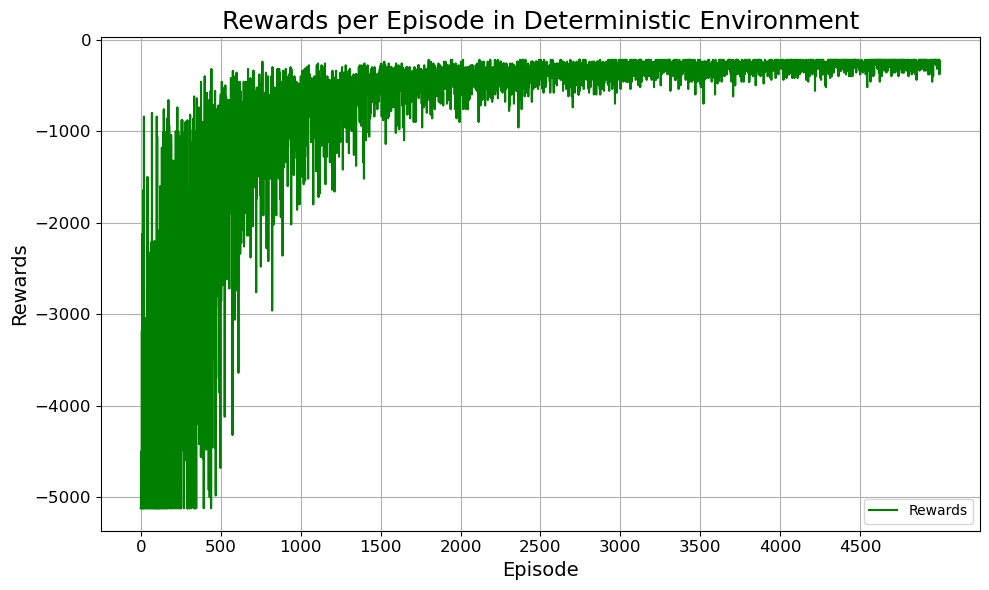

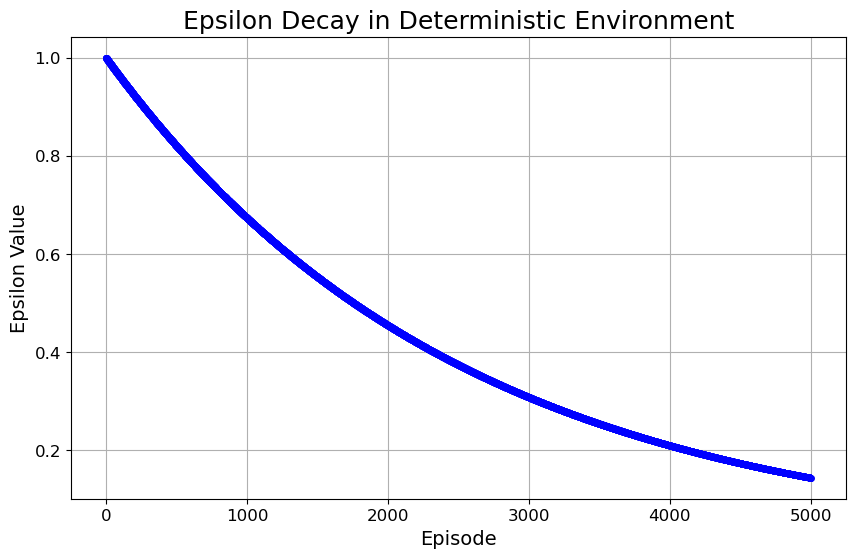

In [111]:
# Plot the Rewards- Epsilon decay graph for Deterministic environment

rewards_per_episode_plot(determ_reward_per_eps, environment_type='Deterministic')

epsilon_decay_plot(deter_epsilon_values, environment_type='Deterministic')


# Plot for Stochastic - Rewards Per Episode

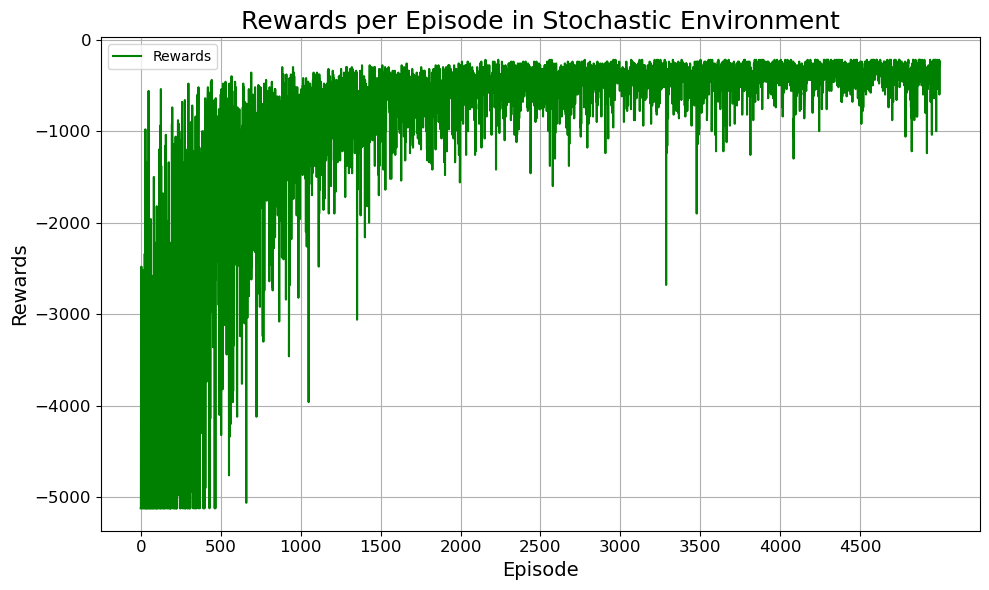

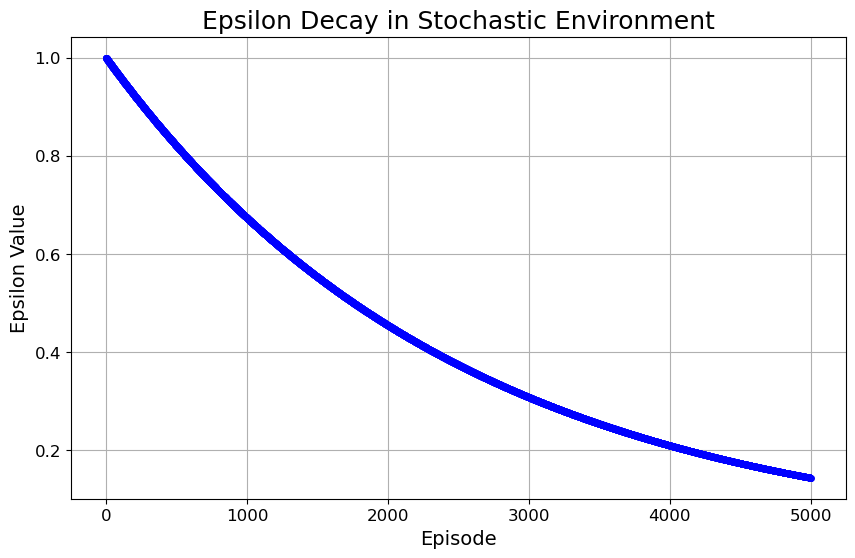

In [112]:
# Plot the Rewards- Epsilon decay graph for Stochastic environment

rewards_per_episode_plot(stoch_reward_per_eps, environment_type='Stochastic')

epsilon_decay_plot(stoch_epsilon_values, environment_type='Stochastic')


# Greedy Action for deterministic Env.

In [113]:
def greedy_agent(agent, env, n_episodes=10):
    epsilon = 0  
    total_episodes = n_episodes  
    steps_per_episode = 15  
    greedy_reward_per_ep = {}

    print("Environment type:", env.env_type)
    
    for episode in tqdm(range(total_episodes), colour='green', desc='Greedy agent progress', unit='Episode'):
        state, info = env.reset()
        state = agent.encode_state(env.agent_pos, env.has_item)  
        terminated, truncated = False, False

        total_reward = 0
        steps_count = 0

        for step in range(steps_per_episode):
            action = agent.choose_action(state, epsilon)

            obs, reward, terminated, truncated, new_info = env.step(action)
            total_reward += reward

            new_state = agent.encode_state(env.agent_pos, env.has_item)
            state = new_state
            steps_count += 1
            env.render()

            # Terminate if the episode is finished
            if terminated or truncated:
                break

        greedy_reward_per_ep[episode] = total_reward

    # I evaluate the average rewards across all episodes
    rewards_per_ep_array = np.array(list(greedy_reward_per_ep.values())).flatten()
    avg_rewards_over_eps = np.mean(rewards_per_ep_array)

    print(f"\nTotal Rewards per Episode: {greedy_reward_per_ep}")
    print(f"Average Rewards per Episode: {avg_rewards_over_eps}")
    
    return avg_rewards_over_eps, greedy_reward_per_ep


Training progress: 100%|█████████████| 1000/1000 [00:00<00:00, 4975.15Episode/s]


Average Rewards over all Episodes: -299.82
Environment type: Deterministic


Greedy agent progress:   0%|                        | 0/10 [00:00<?, ?Episode/s]

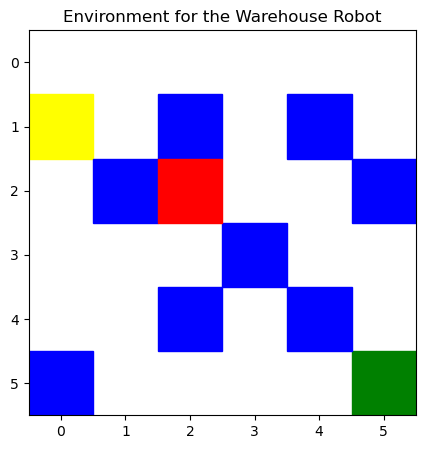

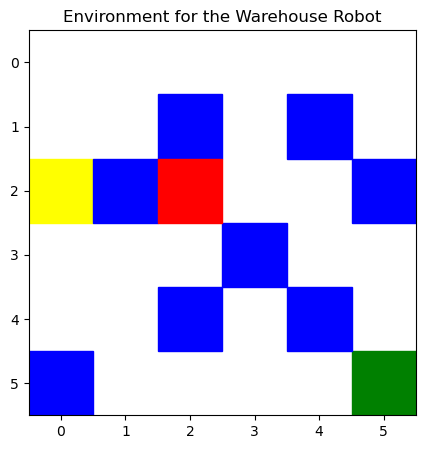

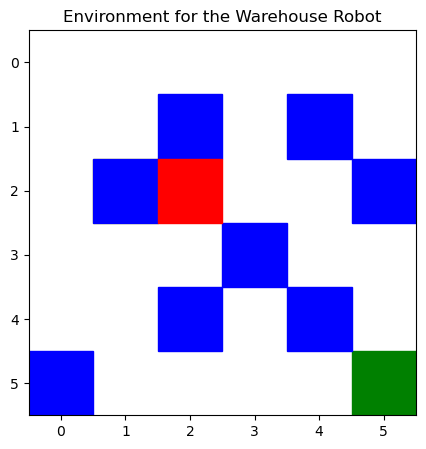

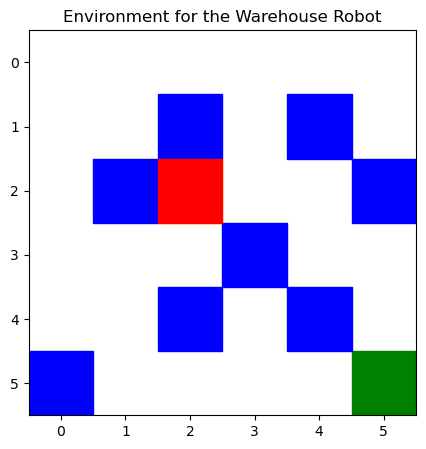

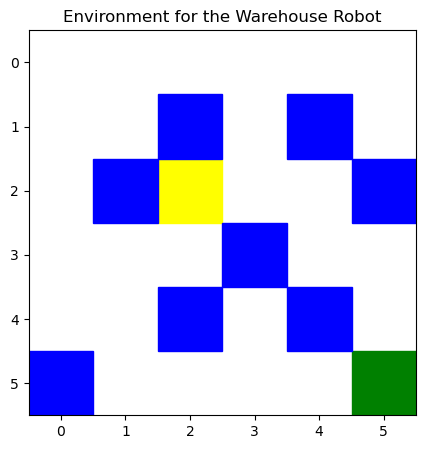

...

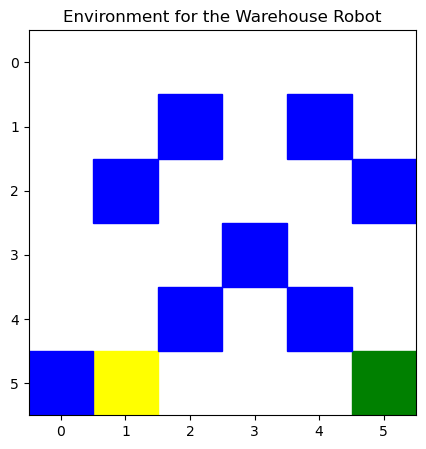

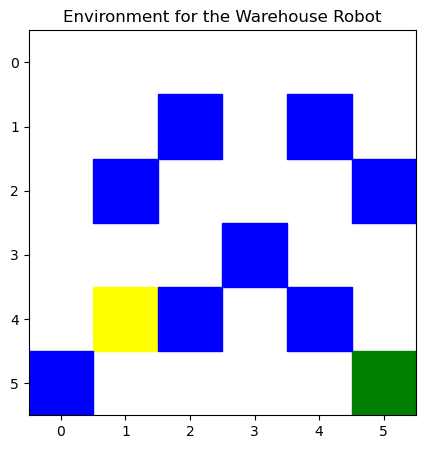

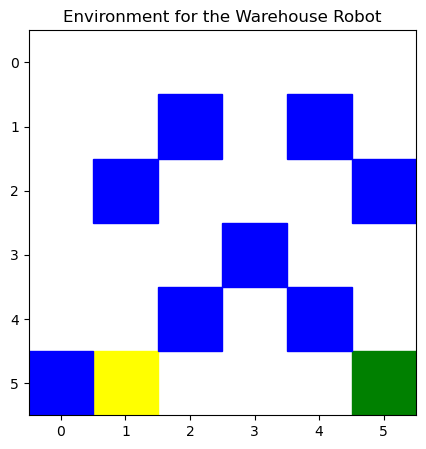

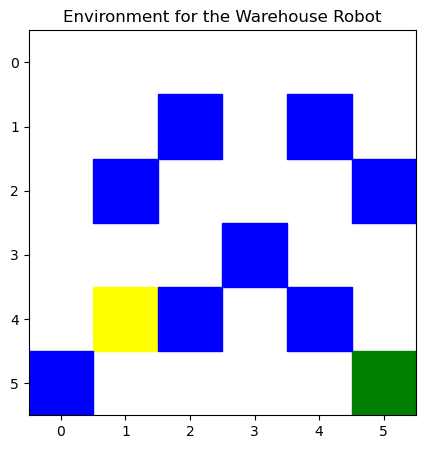

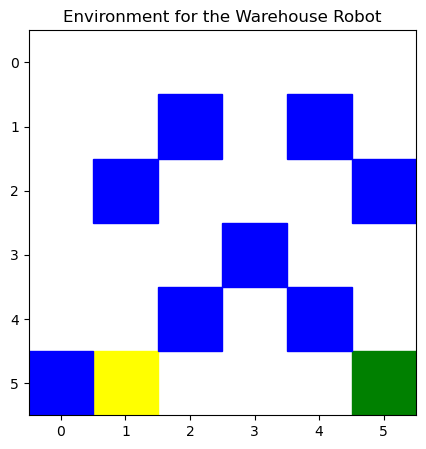

Greedy agent progress:  10%|█▌              | 1/10 [00:00<00:04,  2.05Episode/s]

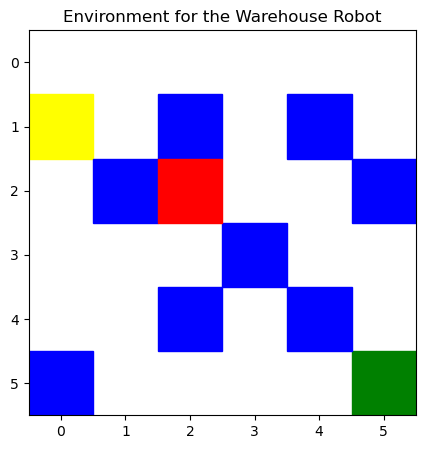

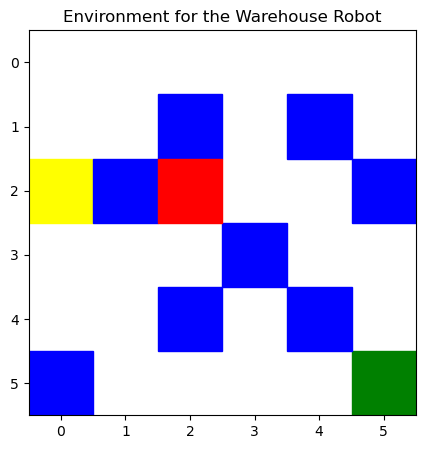

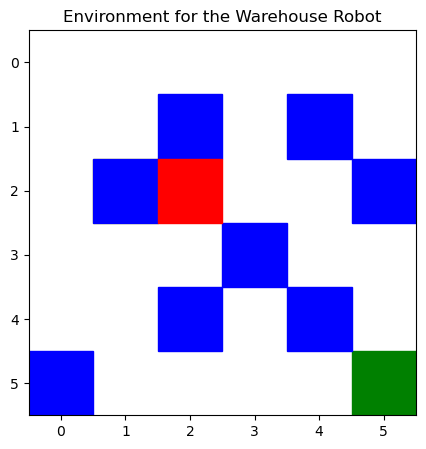

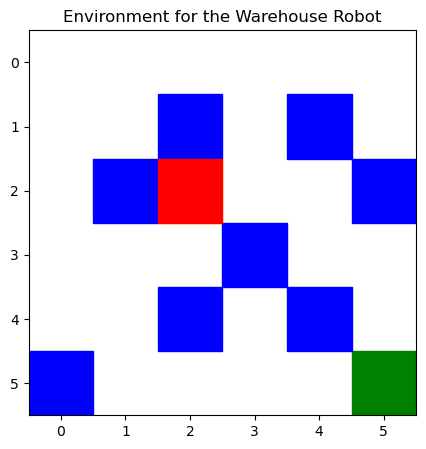

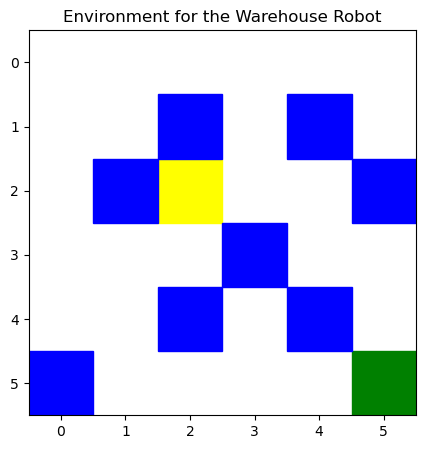

...

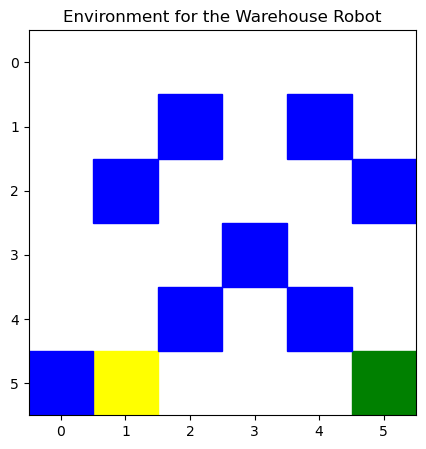

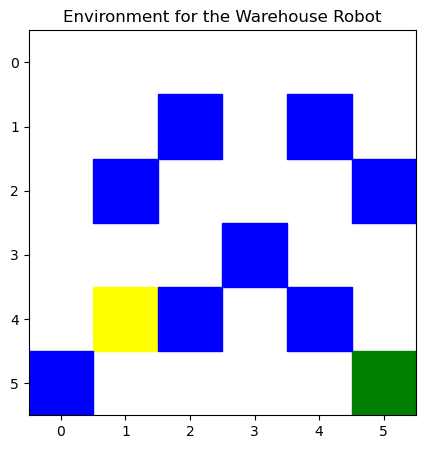

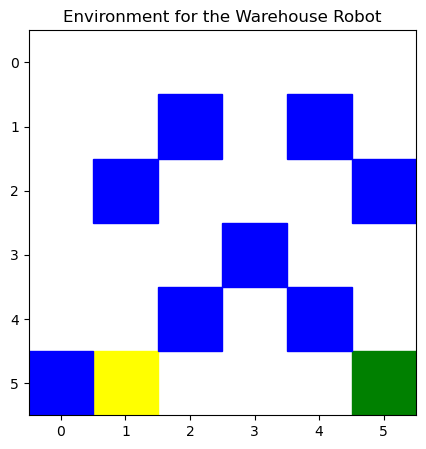

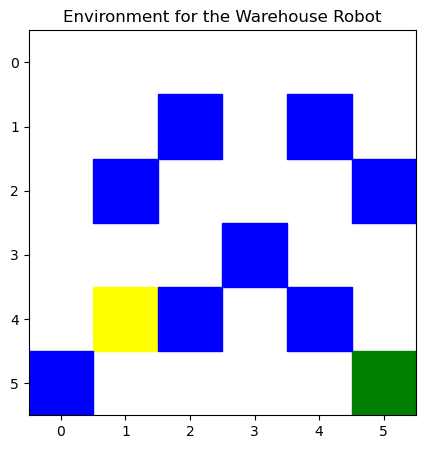

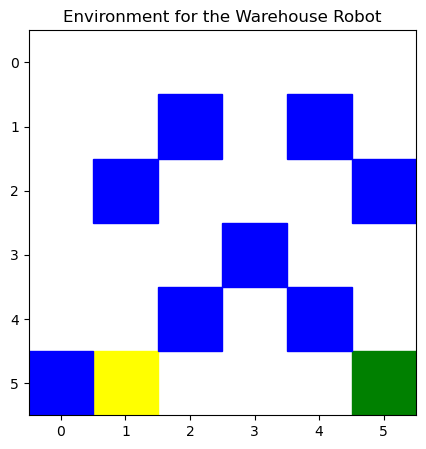

Greedy agent progress:  20%|███▏            | 2/10 [00:00<00:03,  2.20Episode/s]

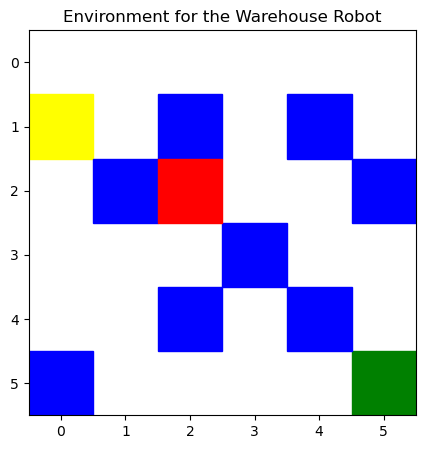

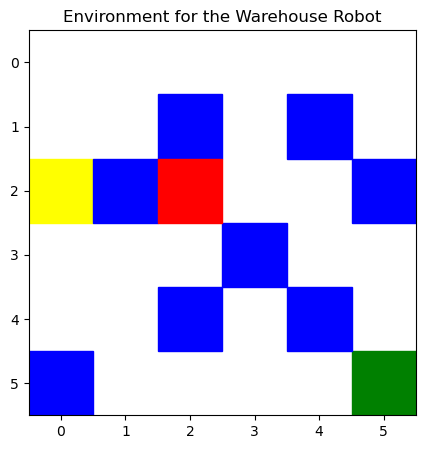

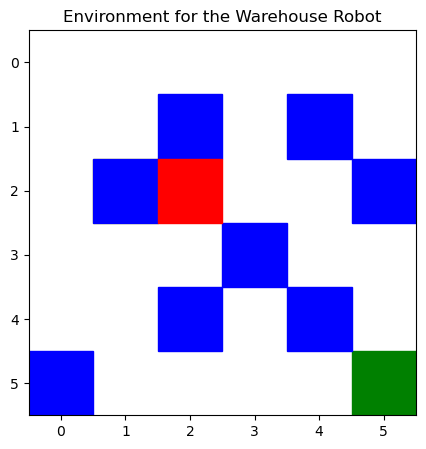

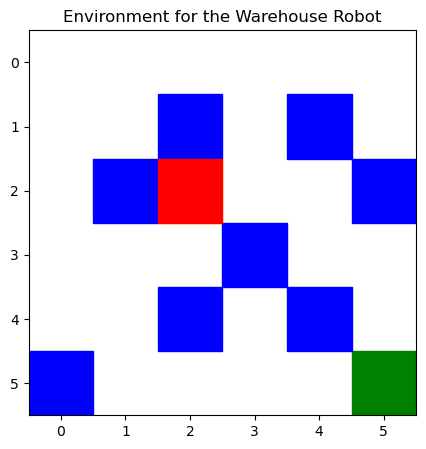

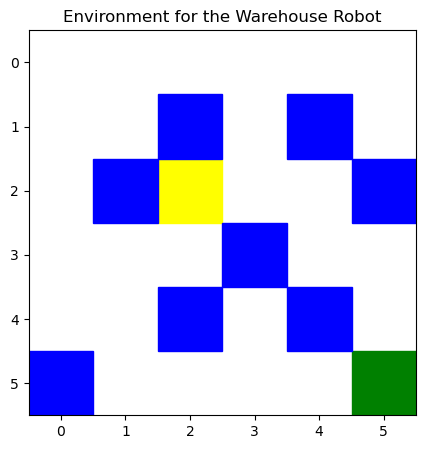

...

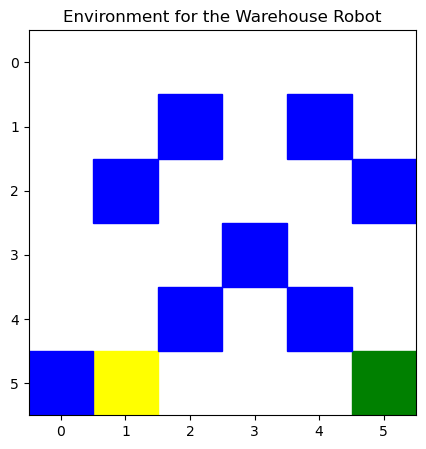

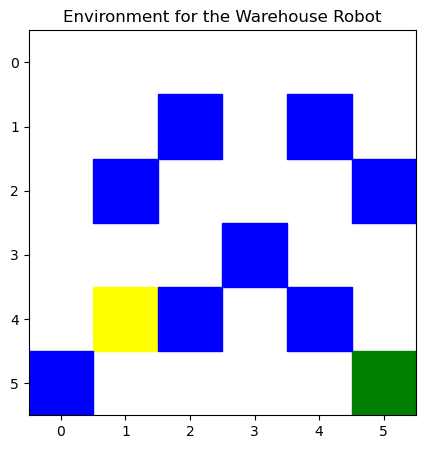

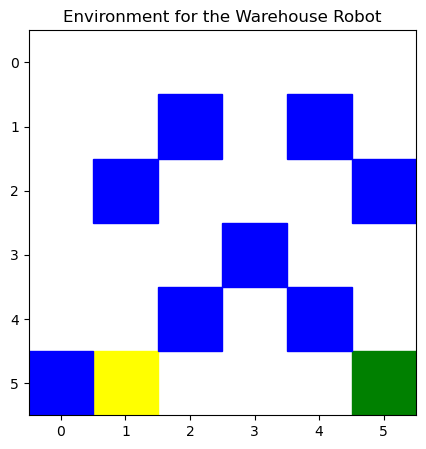

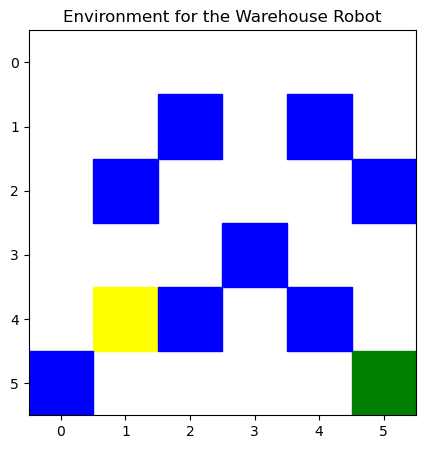

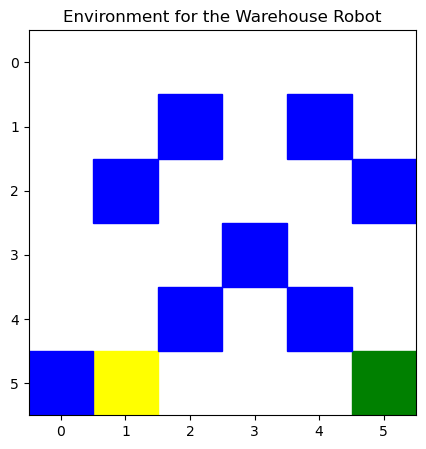

Greedy agent progress:  30%|████▊           | 3/10 [00:01<00:03,  2.24Episode/s]

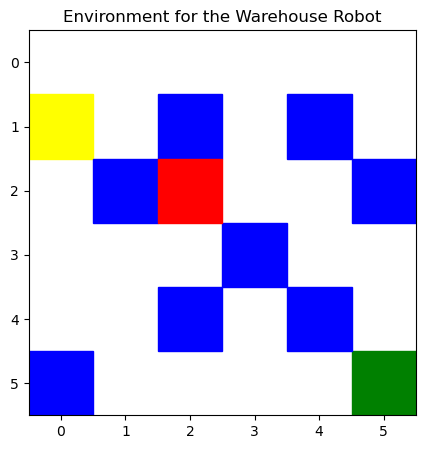

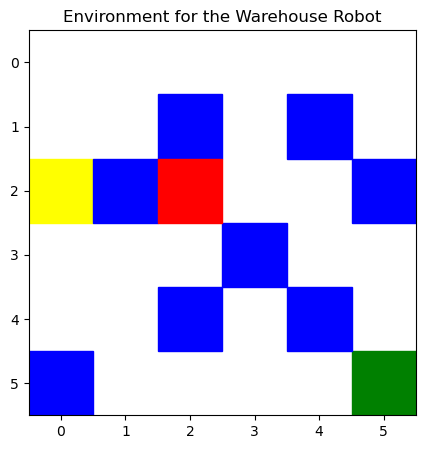

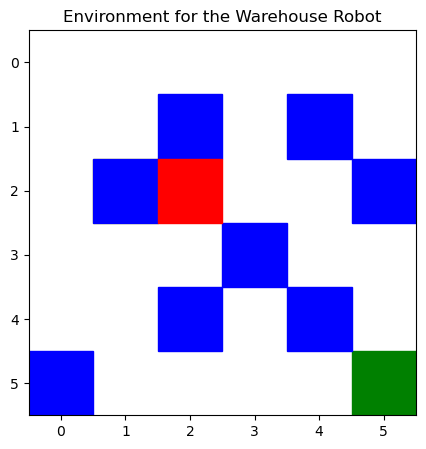

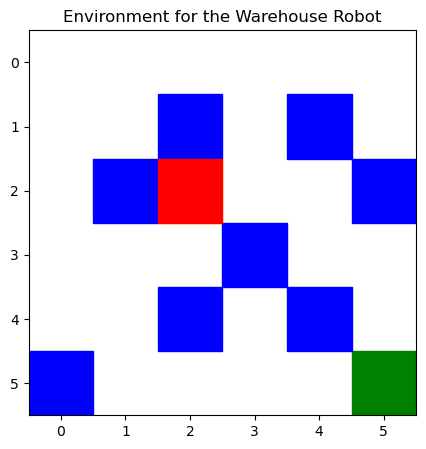

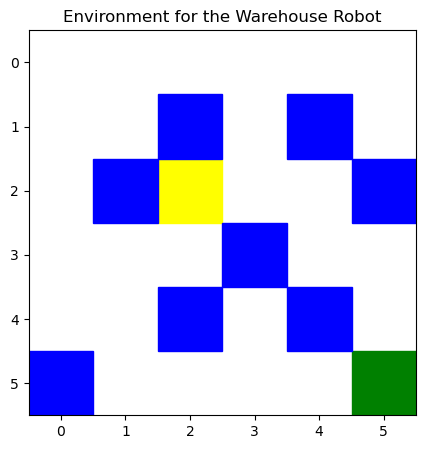

...

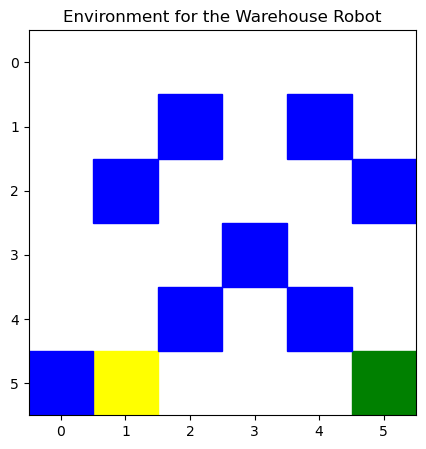

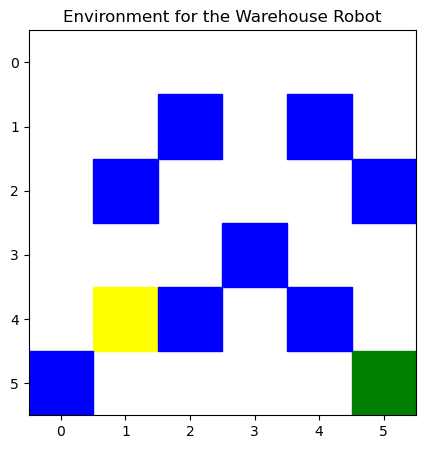

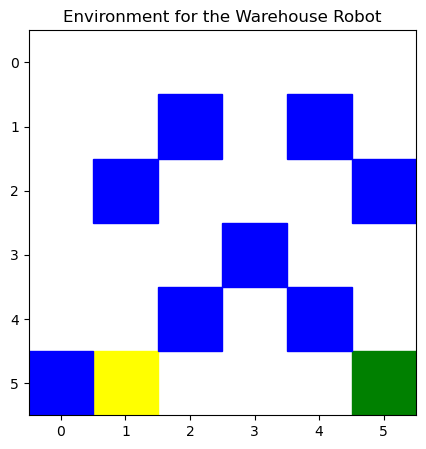

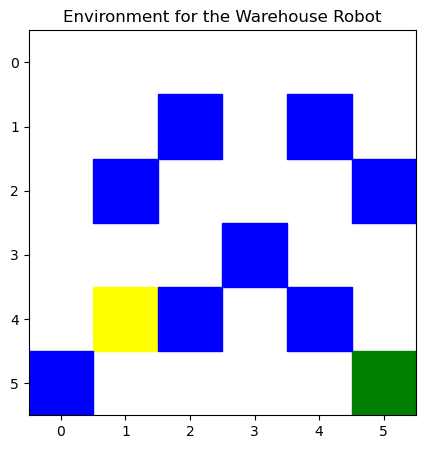

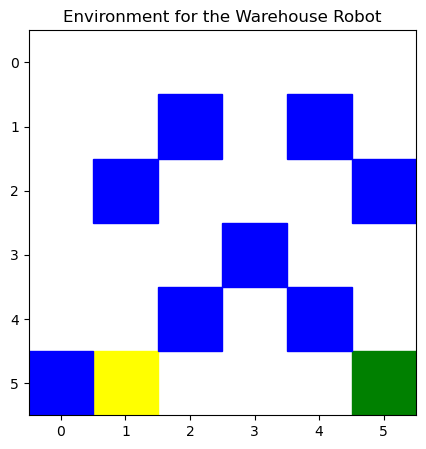

Greedy agent progress:  40%|██████▍         | 4/10 [00:01<00:02,  2.18Episode/s]

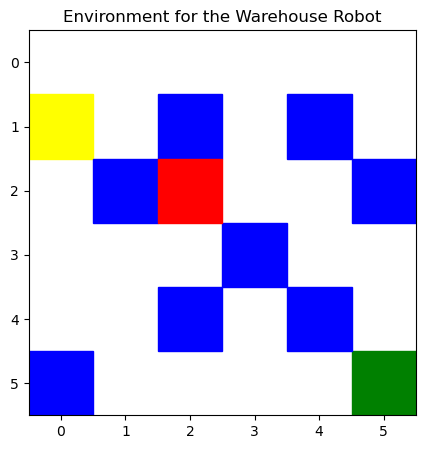

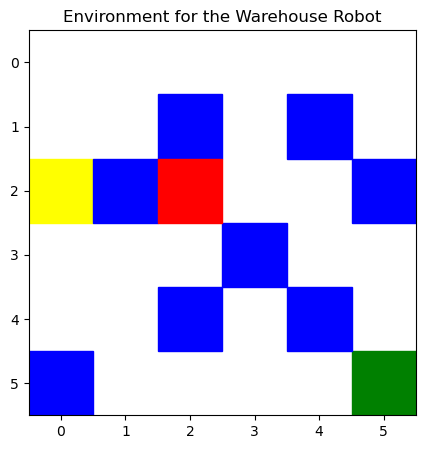

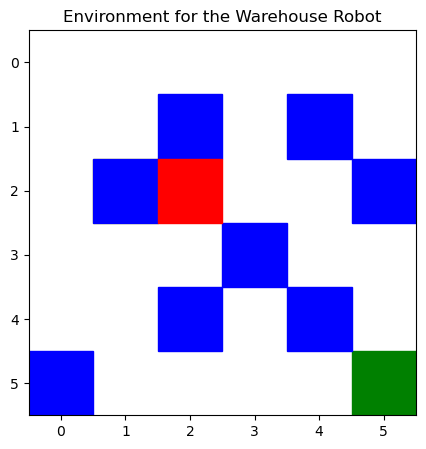

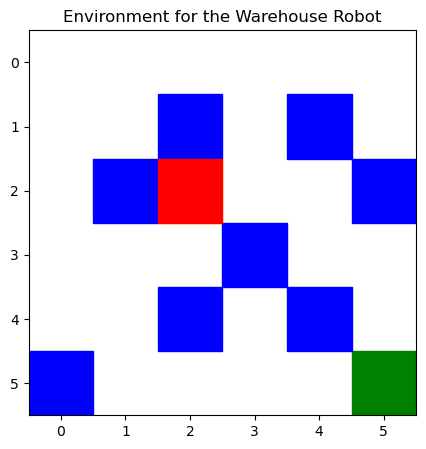

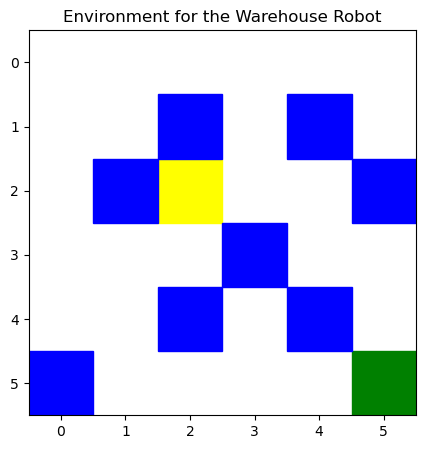

...

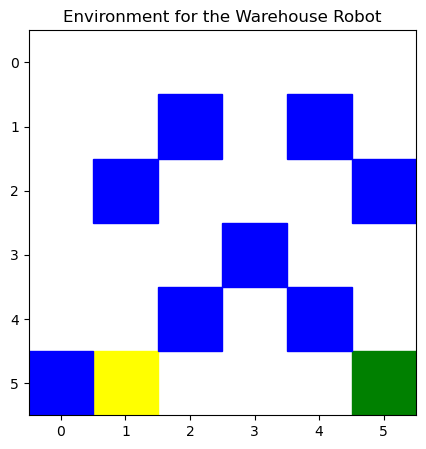

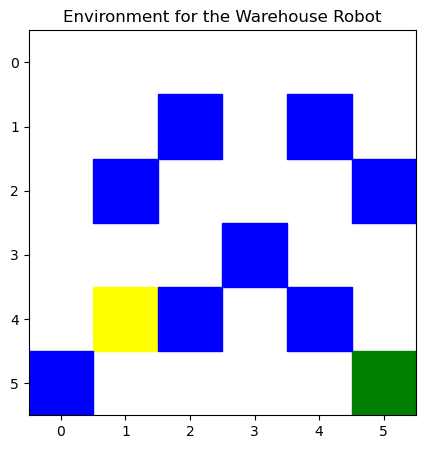

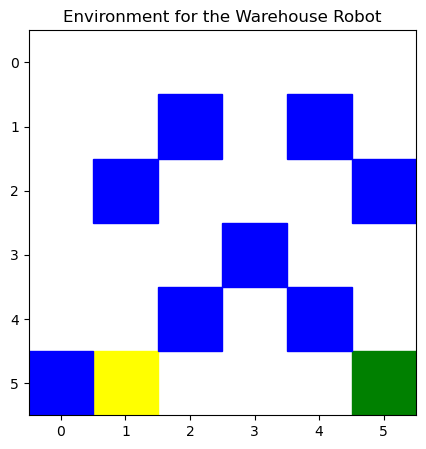

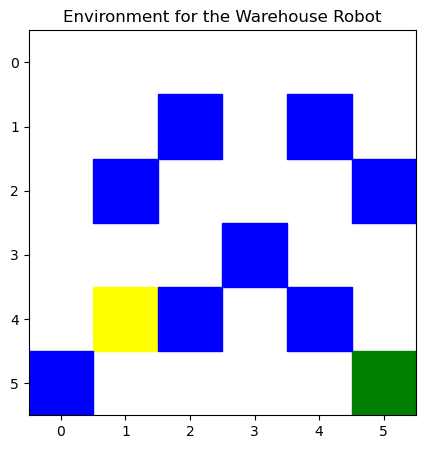

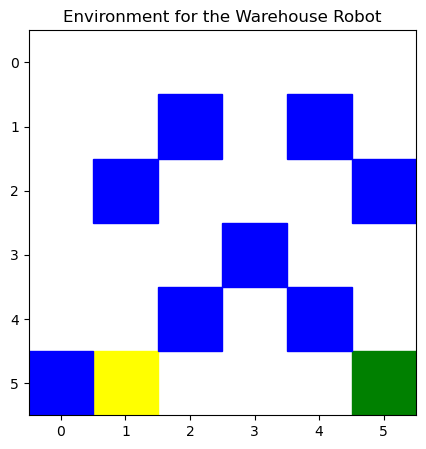

Greedy agent progress:  50%|████████        | 5/10 [00:02<00:02,  2.22Episode/s]

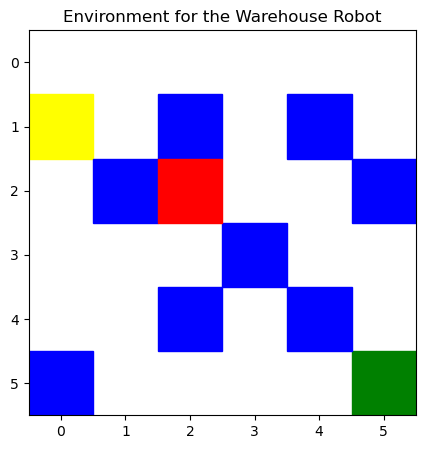

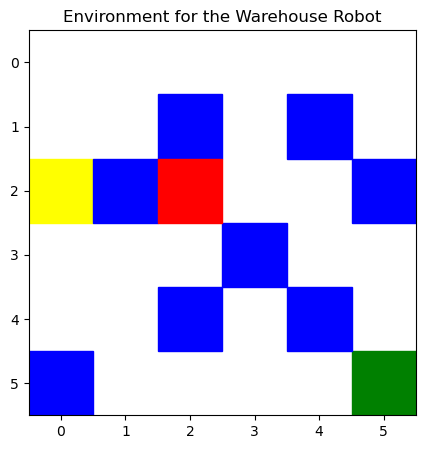

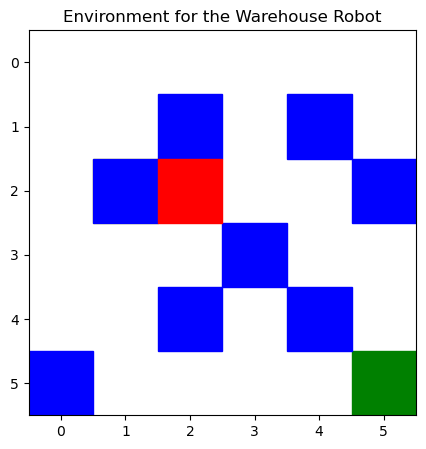

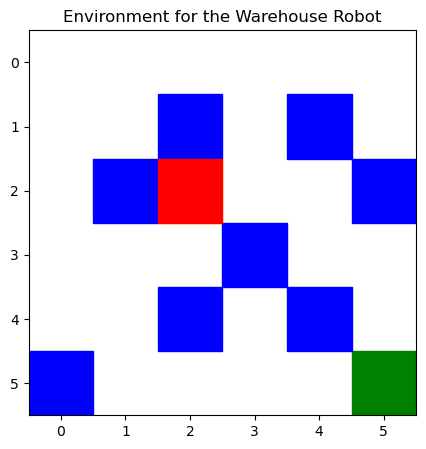

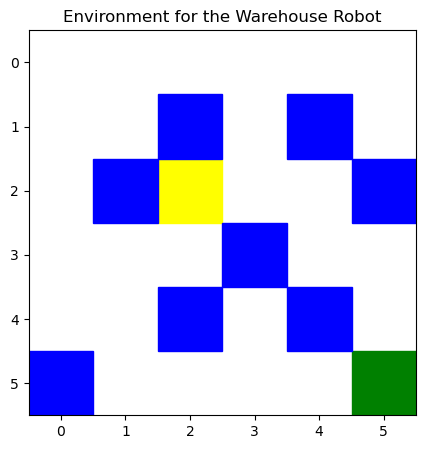

...

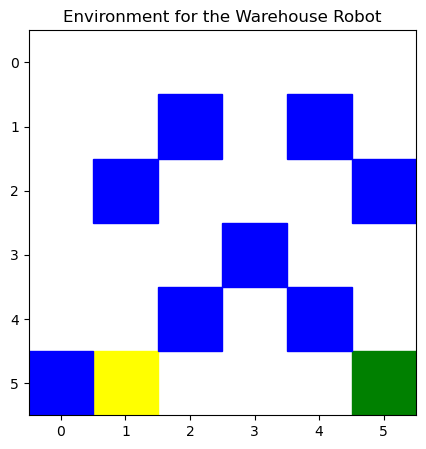

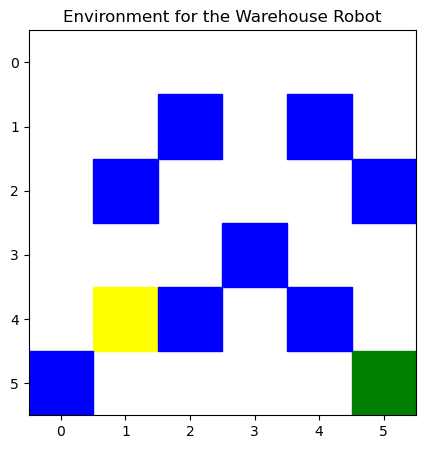

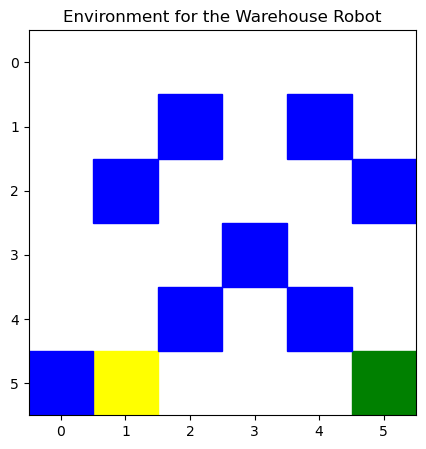

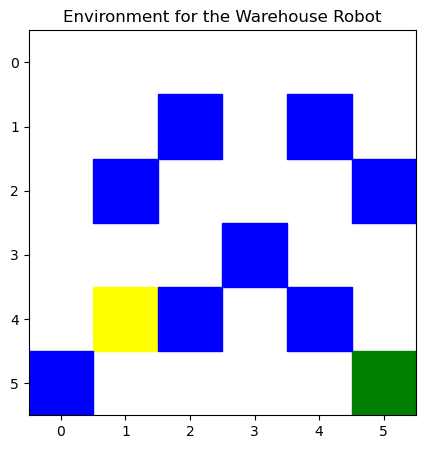

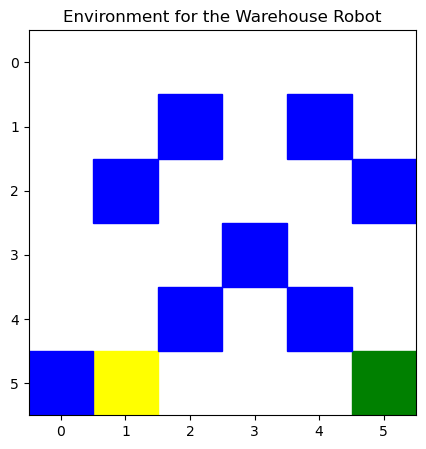

Greedy agent progress:  60%|█████████▌      | 6/10 [00:02<00:01,  2.24Episode/s]

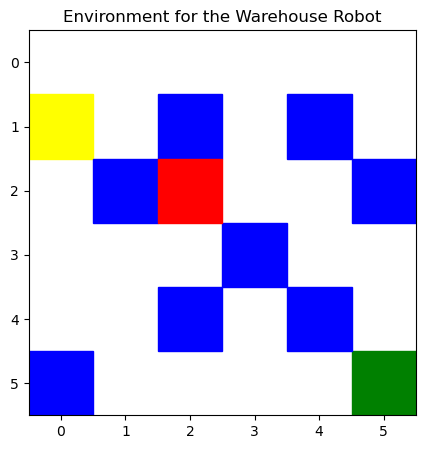

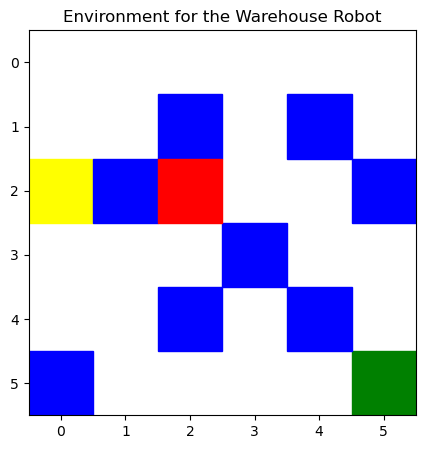

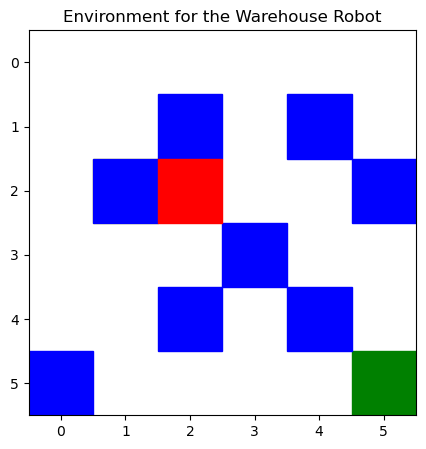

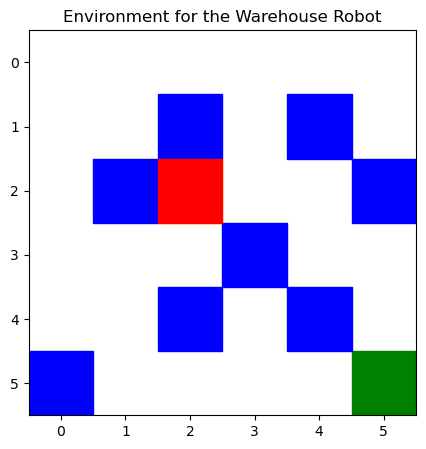

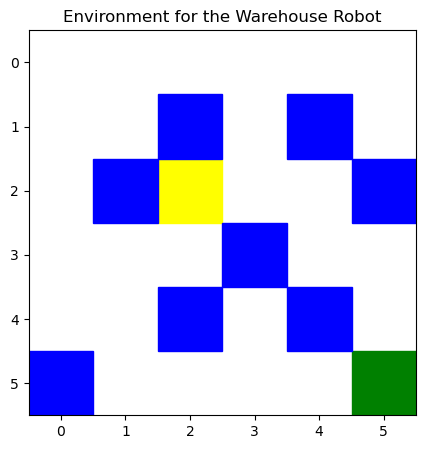

...

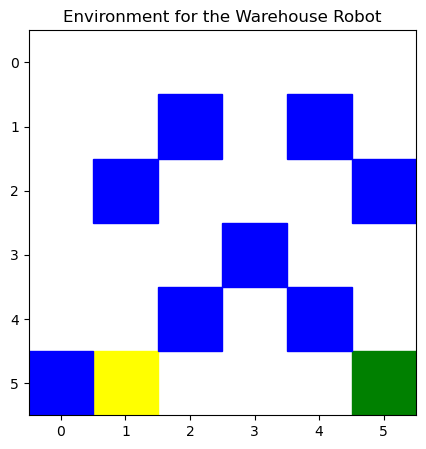

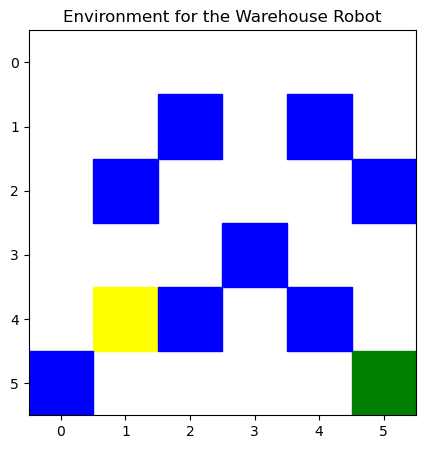

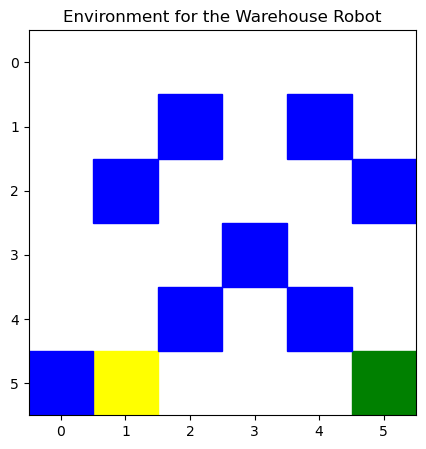

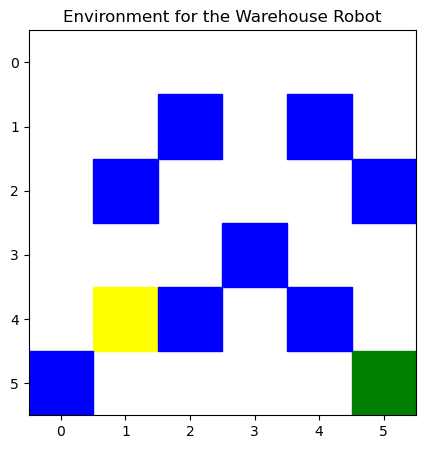

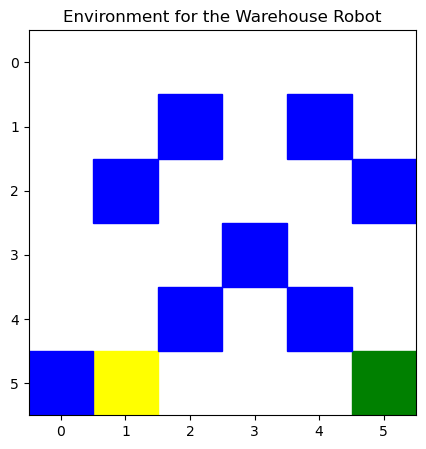

Greedy agent progress:  70%|███████████▏    | 7/10 [00:03<00:01,  2.18Episode/s]

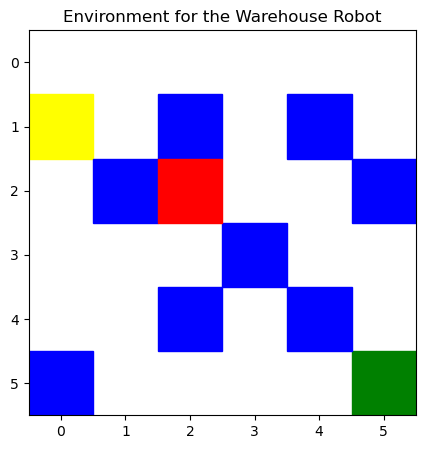

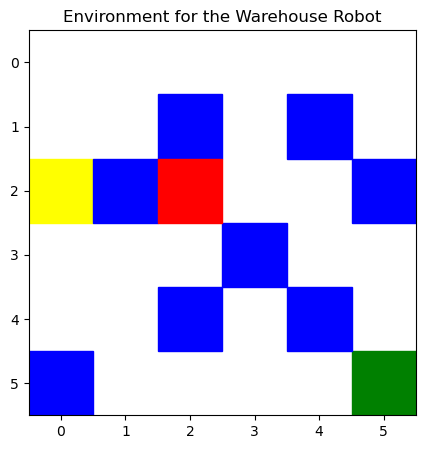

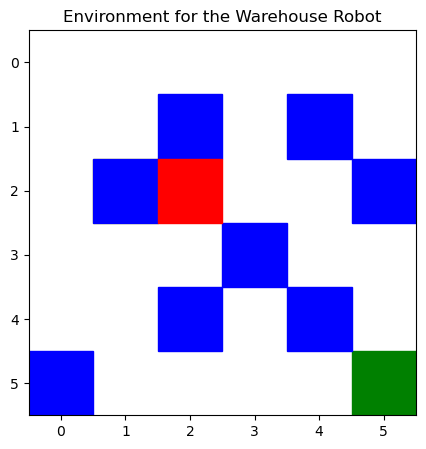

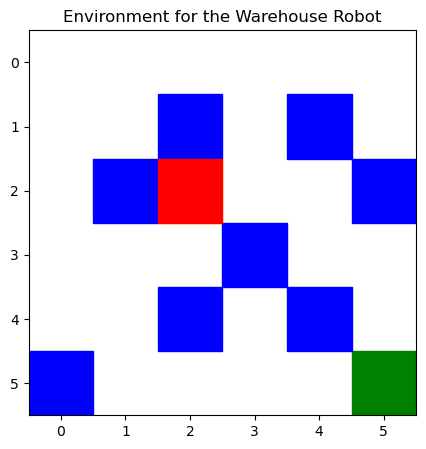

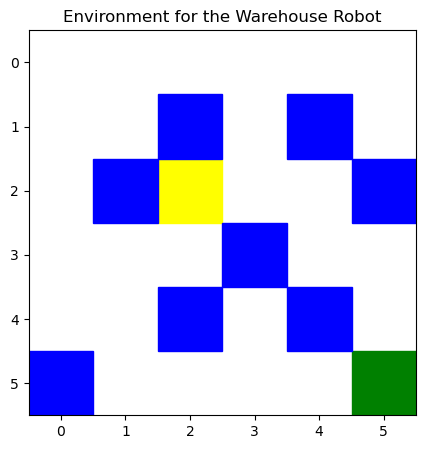

...

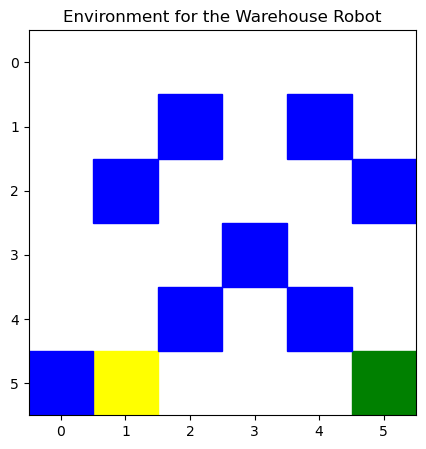

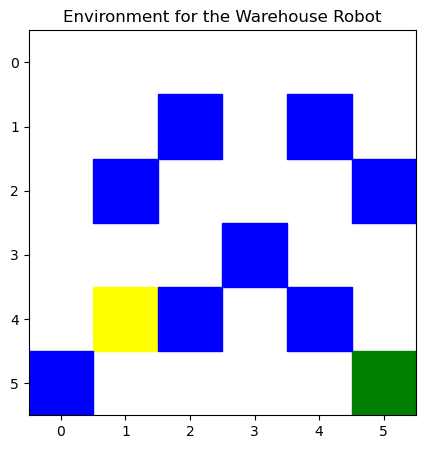

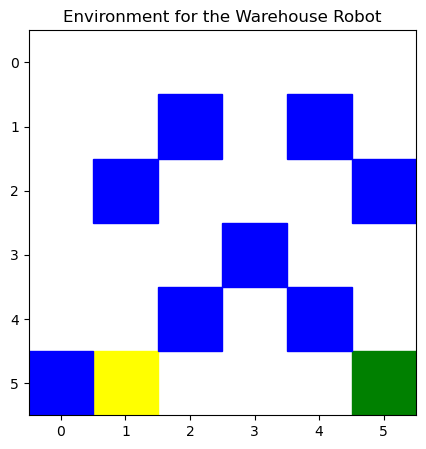

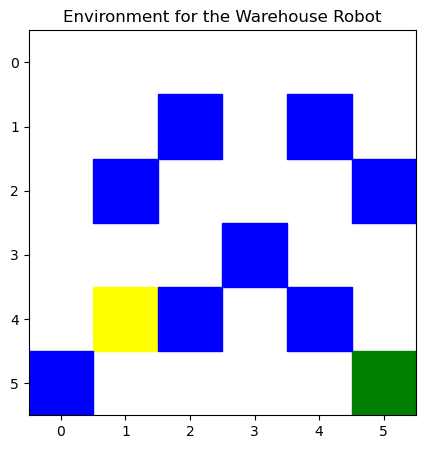

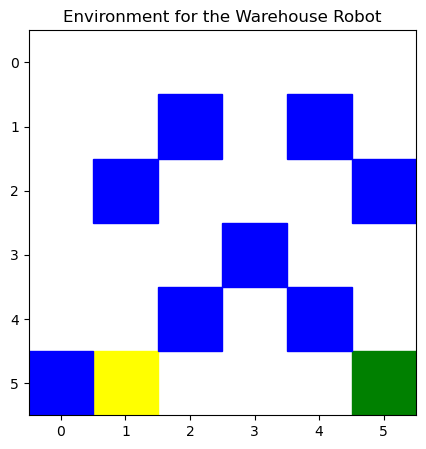

Greedy agent progress:  80%|████████████▊   | 8/10 [00:03<00:00,  2.22Episode/s]

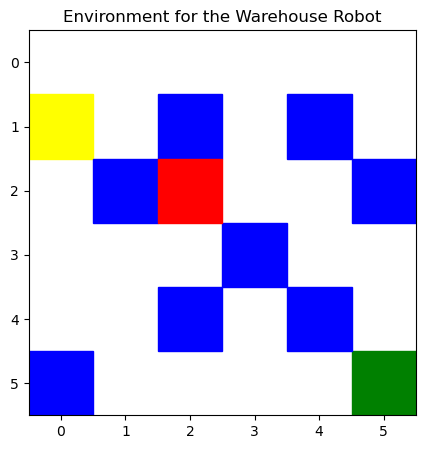

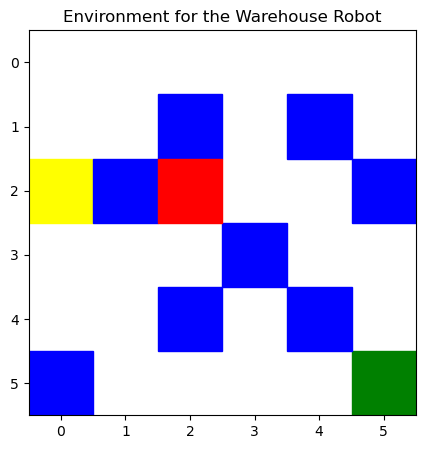

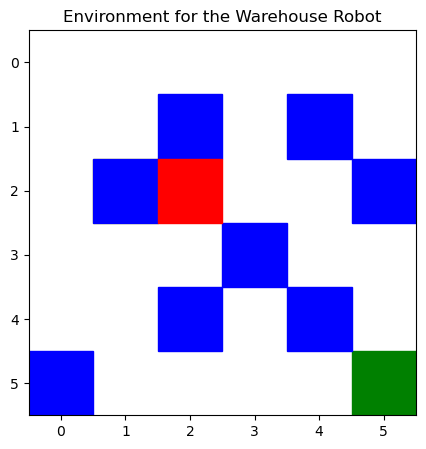

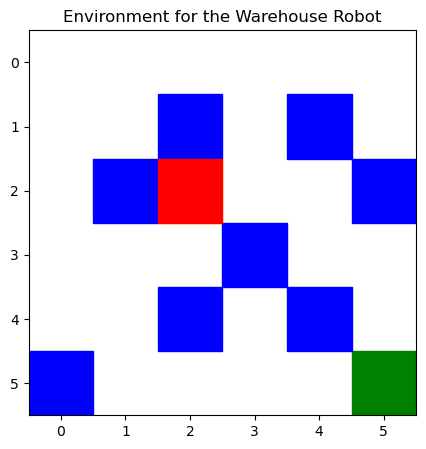

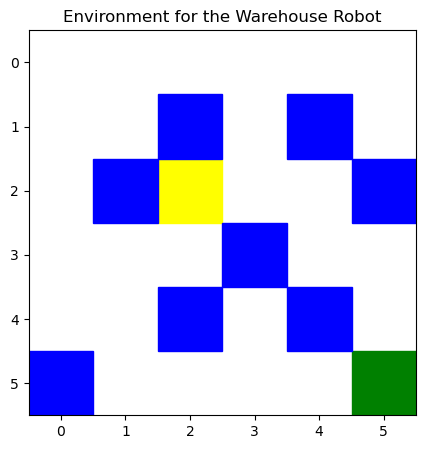

...

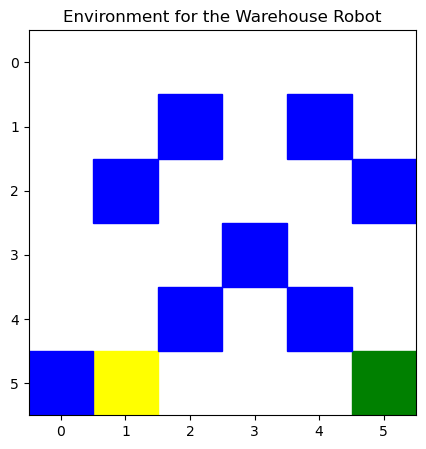

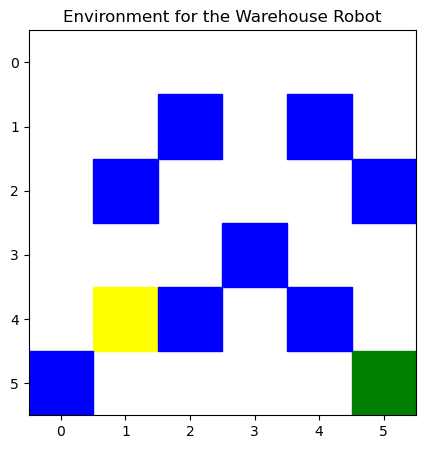

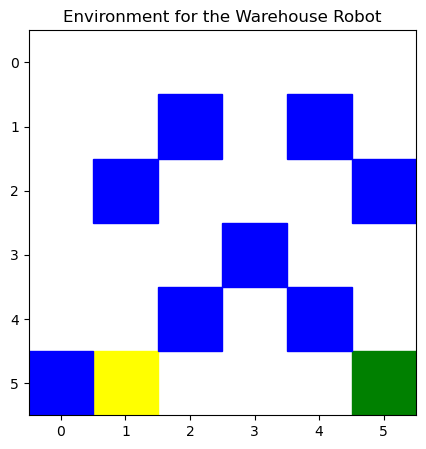

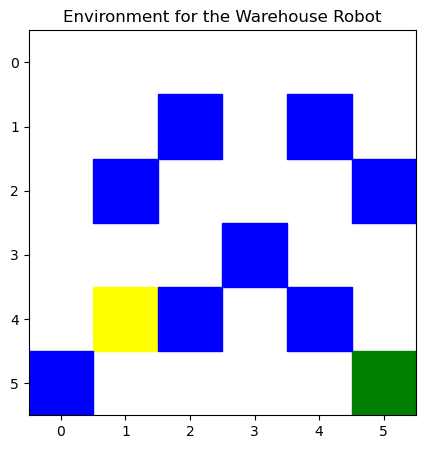

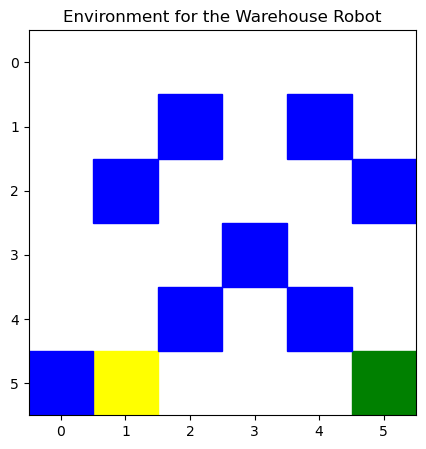

Greedy agent progress:  90%|██████████████▍ | 9/10 [00:04<00:00,  2.23Episode/s]

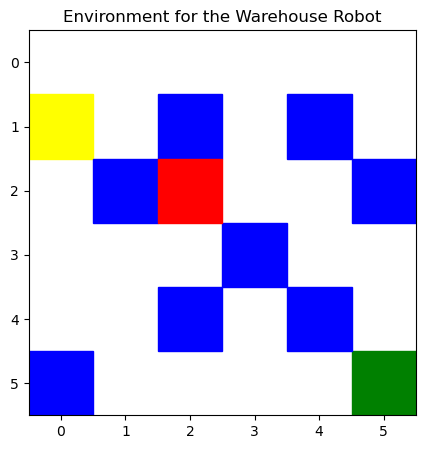

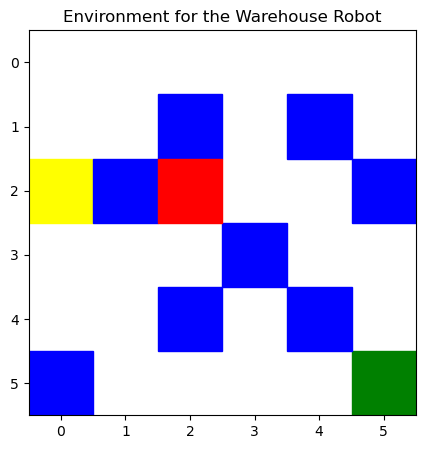

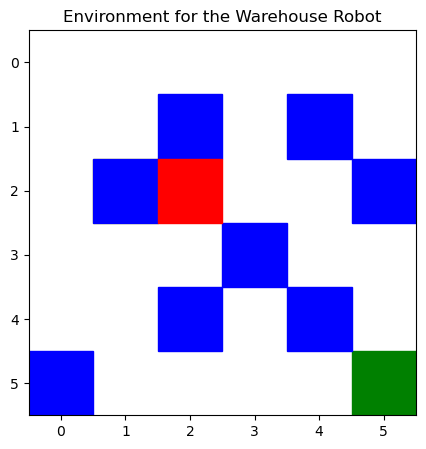

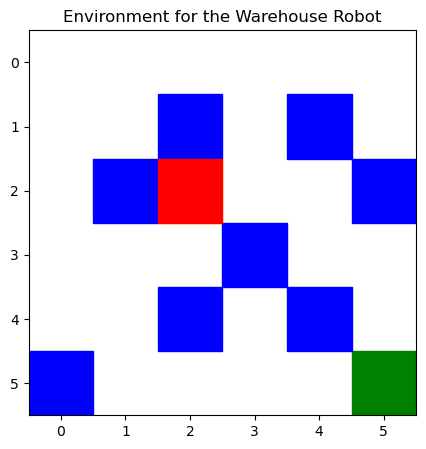

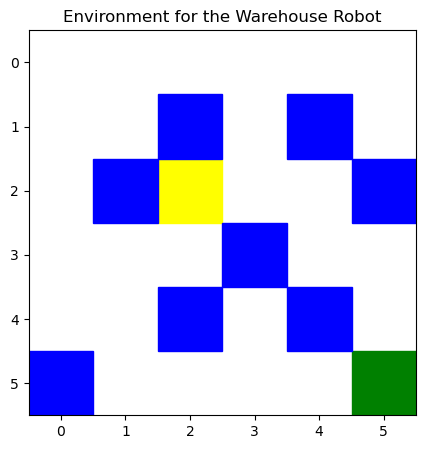

...

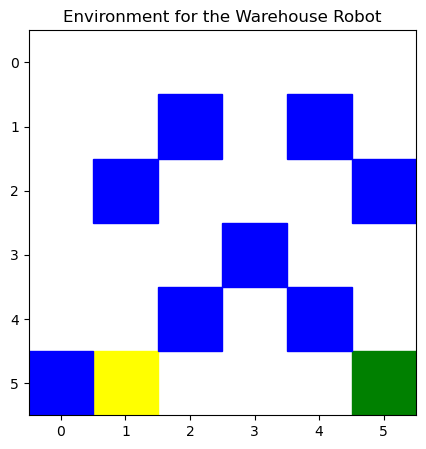

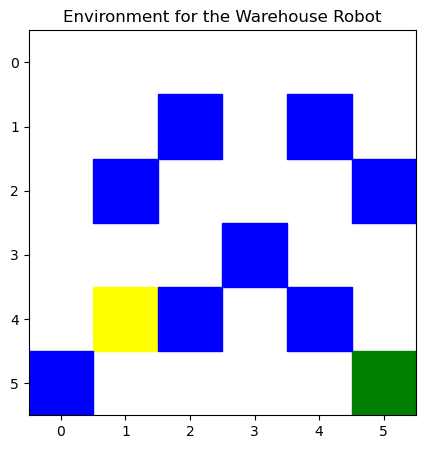

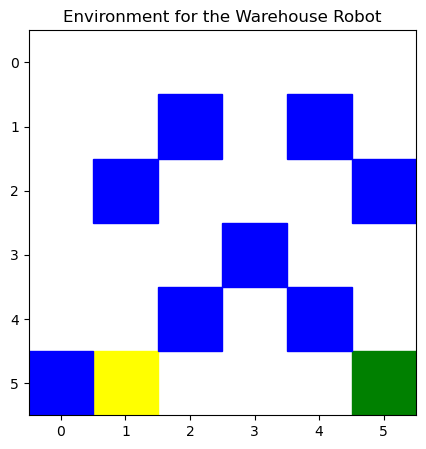

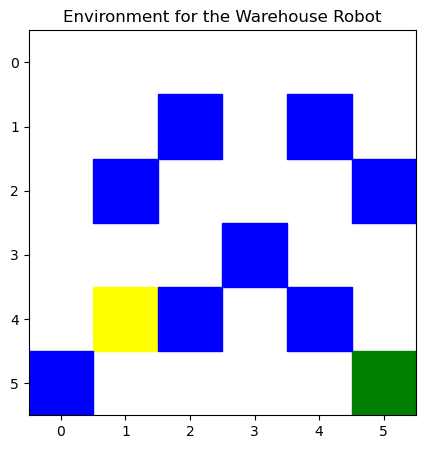

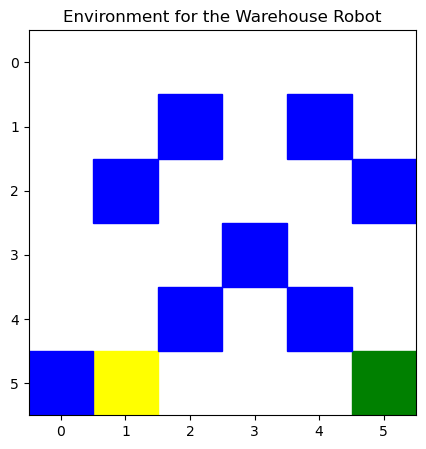

Greedy agent progress: 100%|███████████████| 10/10 [00:04<00:00,  2.20Episode/s]


Total Rewards per Episode: {0: -300, 1: -300, 2: -300, 3: -300, 4: -300, 5: -300, 6: -300, 7: -300, 8: -300, 9: -300}
Average Rewards per Episode: -300.0


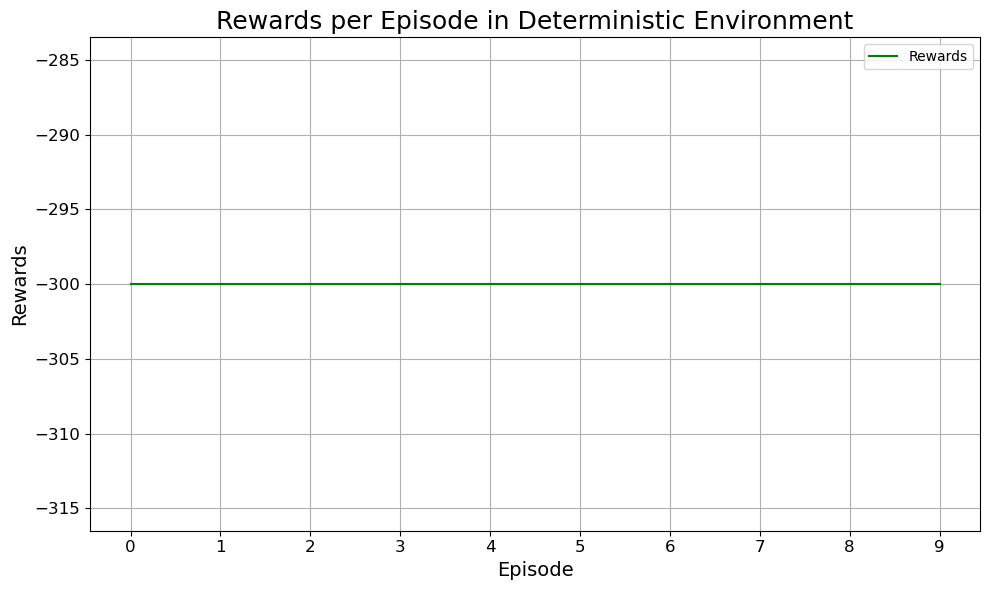

In [114]:
# Training for the agent for Deterministic environment
rewards, avg_rewards, epsilon_values, trained_agent = episode_trainer(
    environment_type='Deterministic', 
    episodes=1000, 
    steps=15, 
    discount_rate=0.99, 
    learning_rate=0.1
)

avg_ep_rewards, greedy_rwd_per_ep = greedy_agent(trained_agent, env, 10)

rewards_per_episode_plot(greedy_rwd_per_ep, 'Deterministic')


# Greedy Action for Stochastic Env.

Training progress: 100%|█████████████| 1000/1000 [00:00<00:00, 5086.34Episode/s]


Average Rewards over all Episodes: -299.86
Environment type: Deterministic


Greedy agent progress:   0%|                        | 0/10 [00:00<?, ?Episode/s]

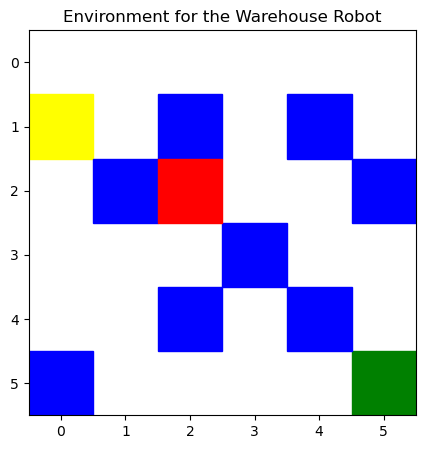

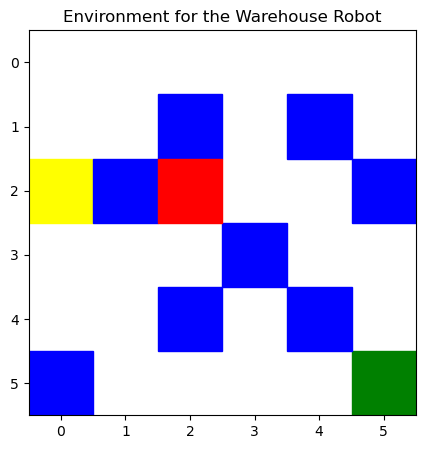

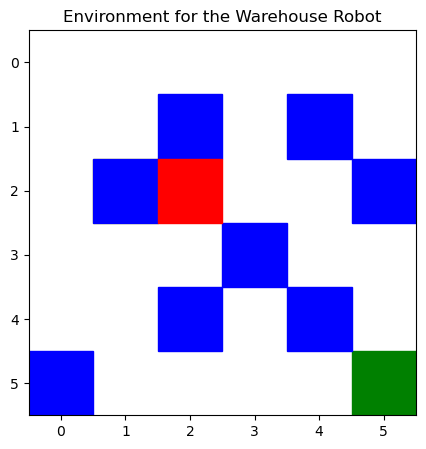

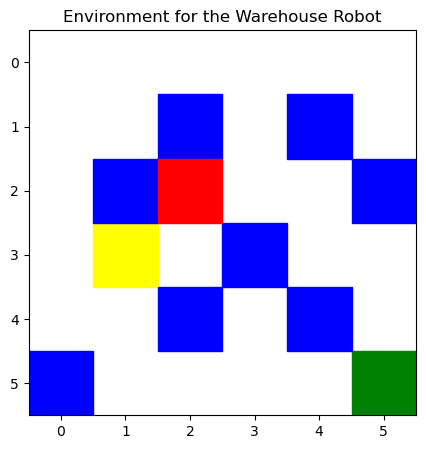

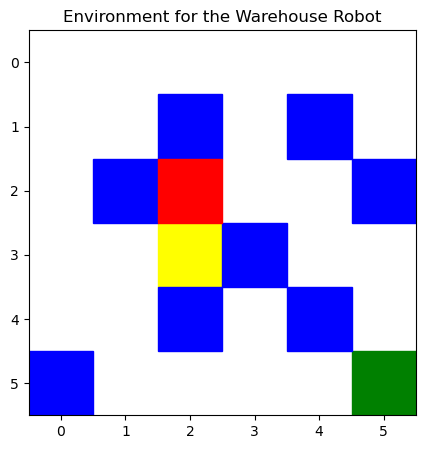

...

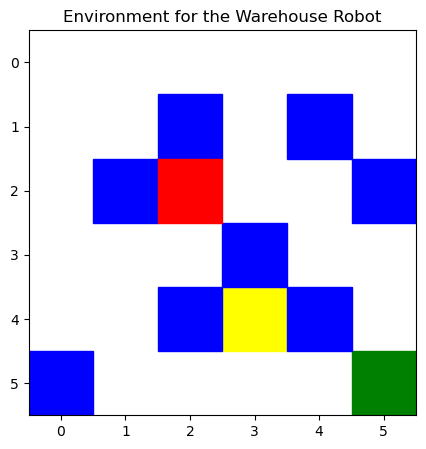

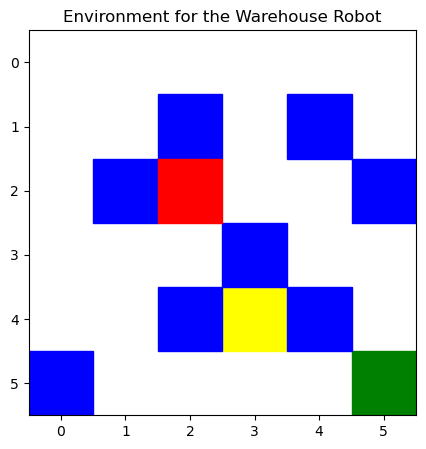

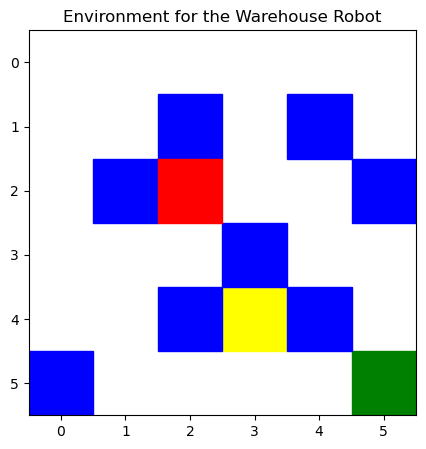

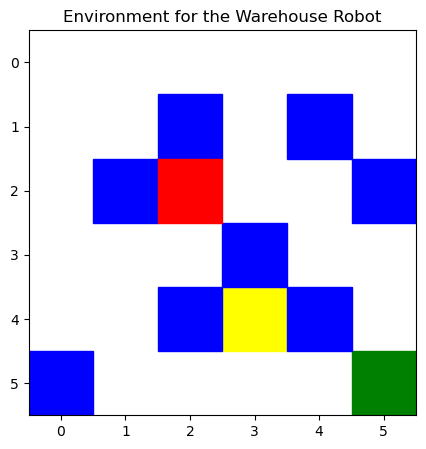

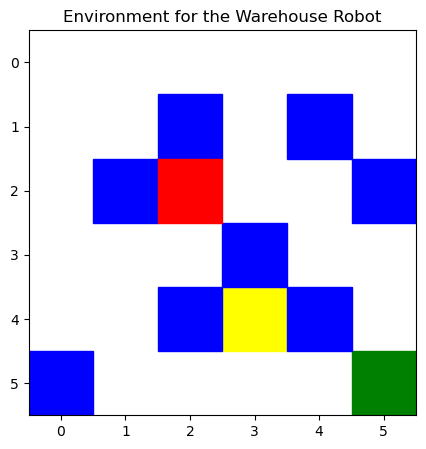

Greedy agent progress:  10%|█▌              | 1/10 [00:00<00:04,  2.19Episode/s]

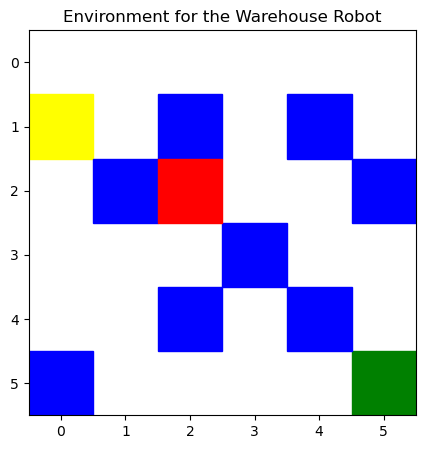

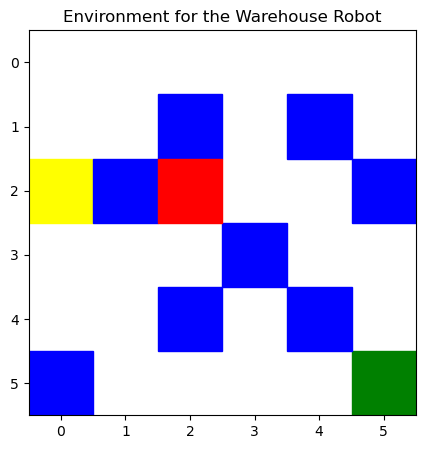

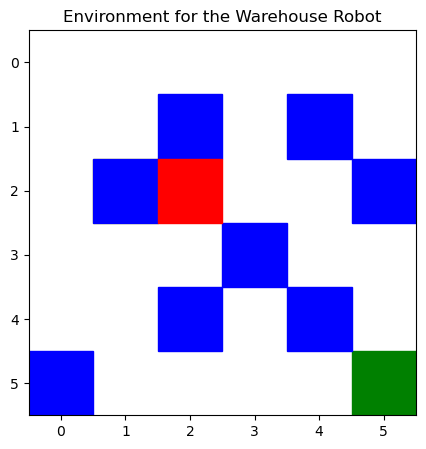

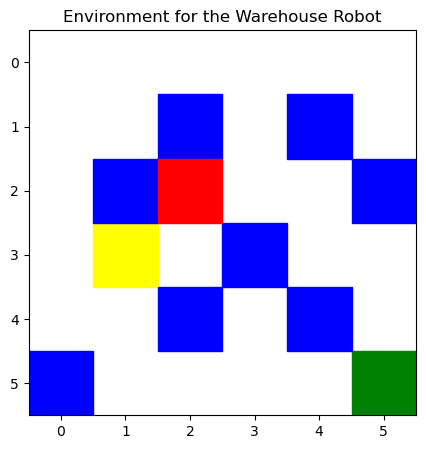

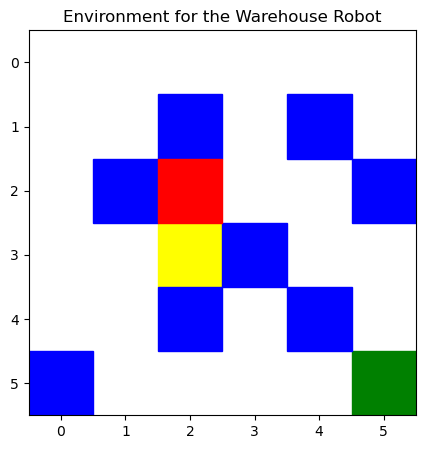

...

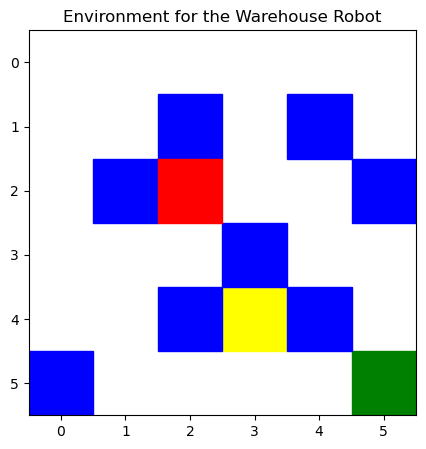

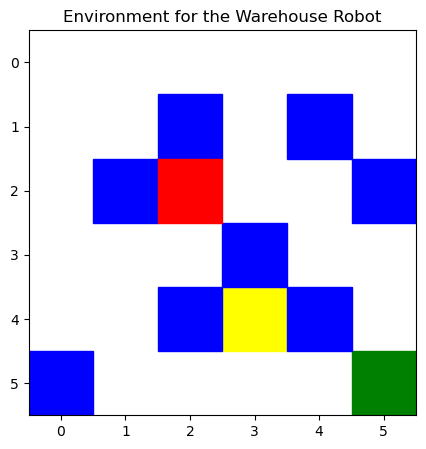

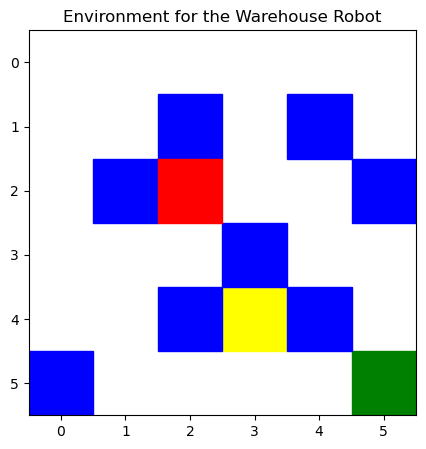

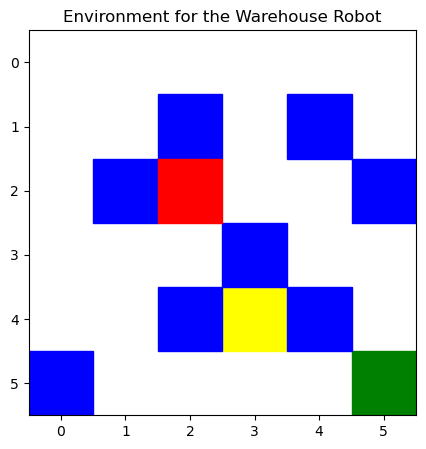

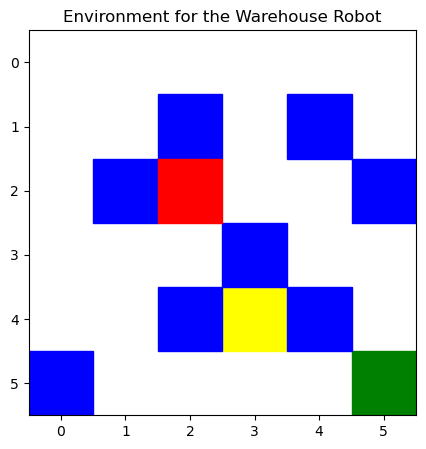

Greedy agent progress:  20%|███▏            | 2/10 [00:00<00:03,  2.23Episode/s]

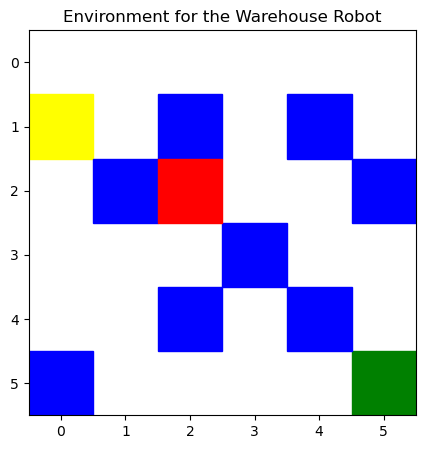

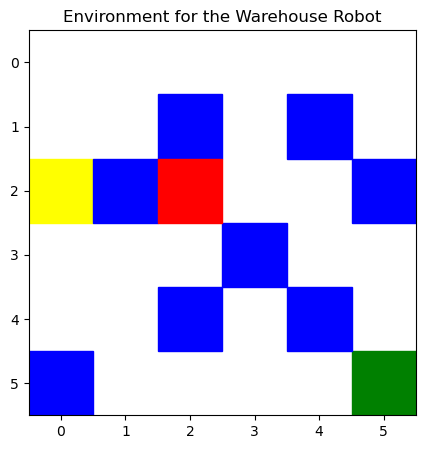

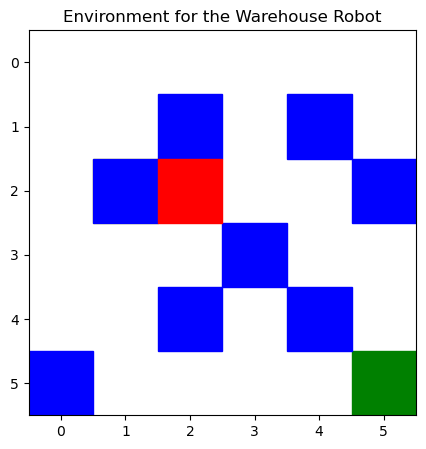

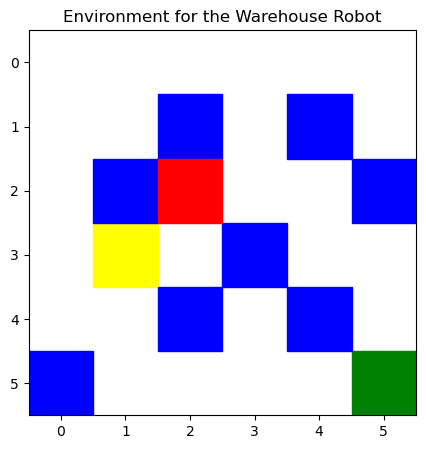

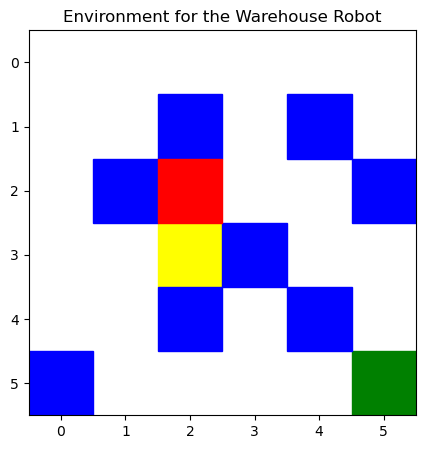

...

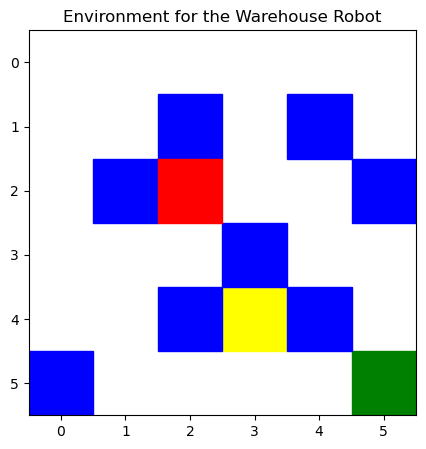

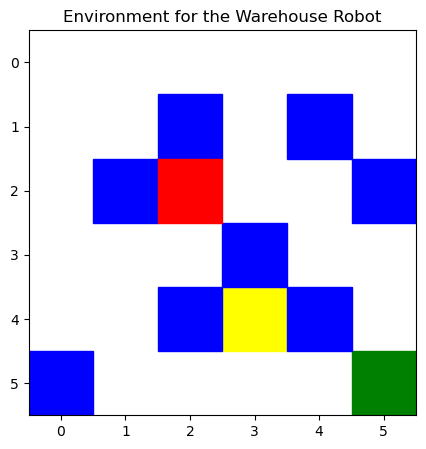

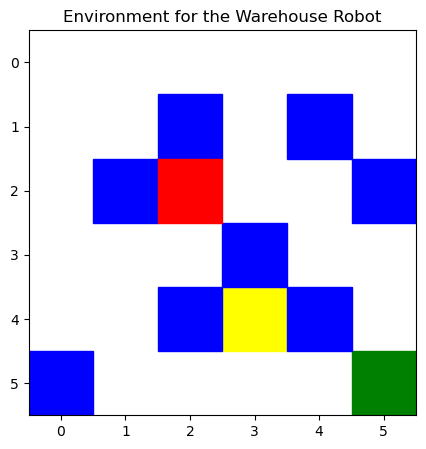

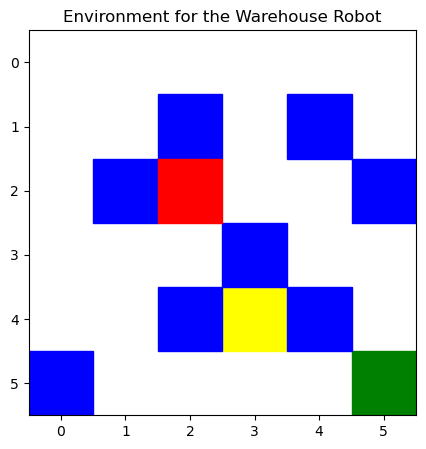

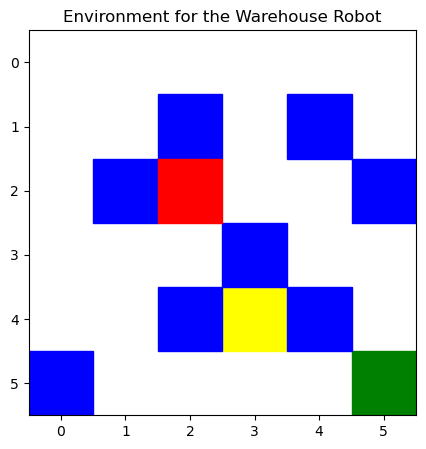

Greedy agent progress:  30%|████▊           | 3/10 [00:01<00:03,  2.13Episode/s]

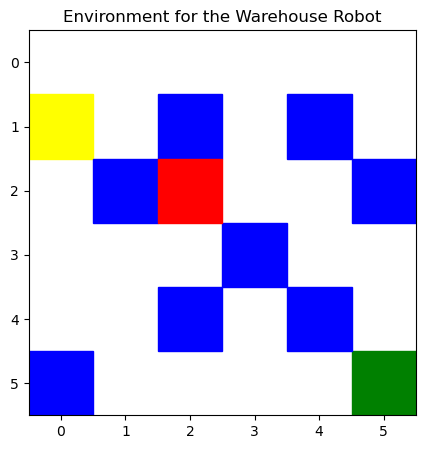

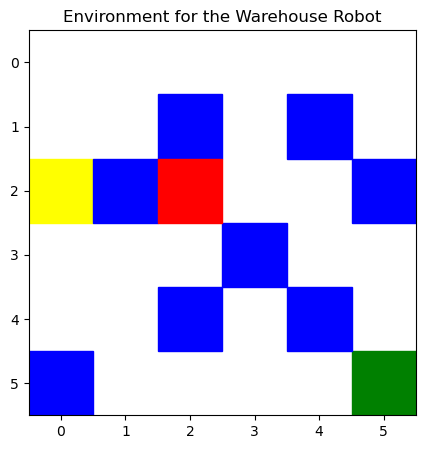

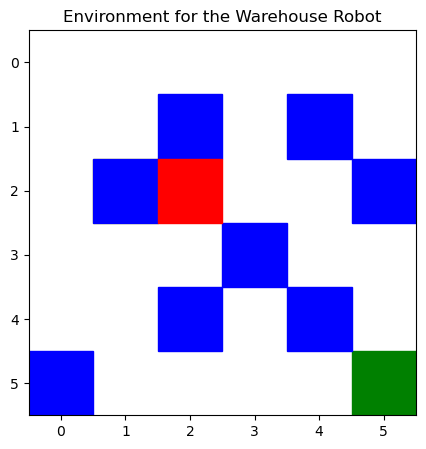

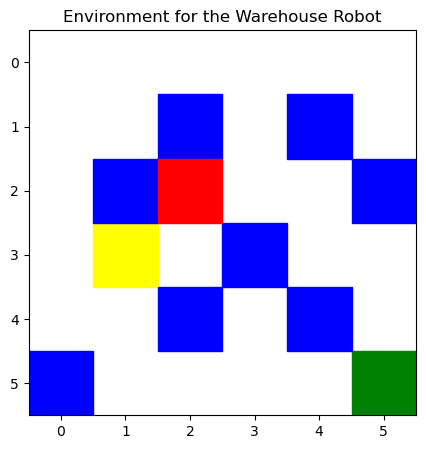

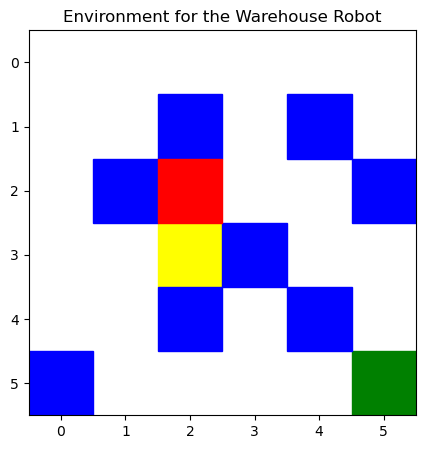

...

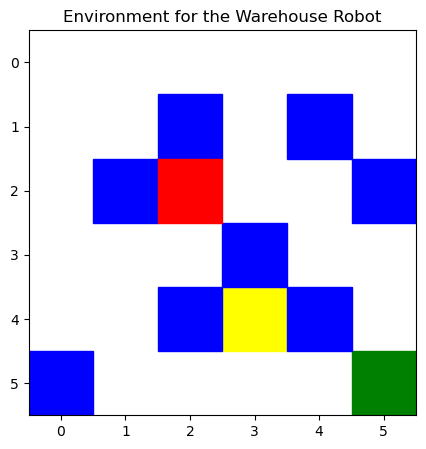

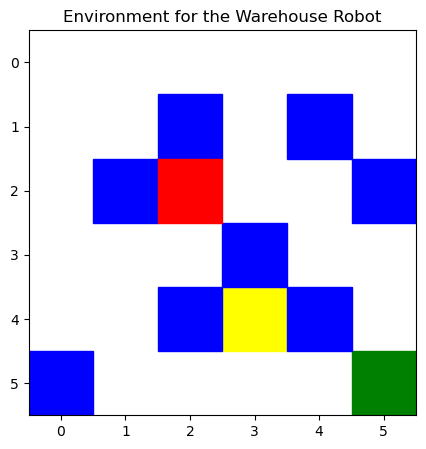

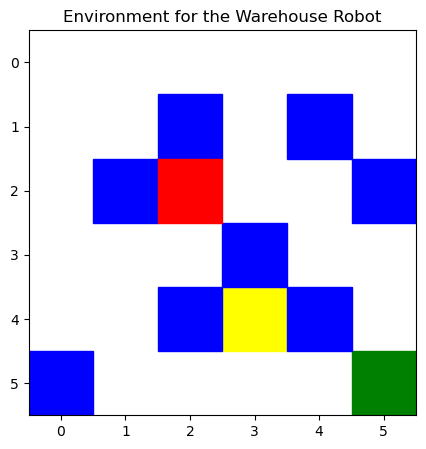

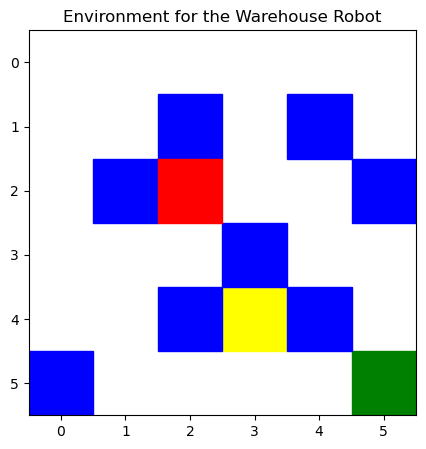

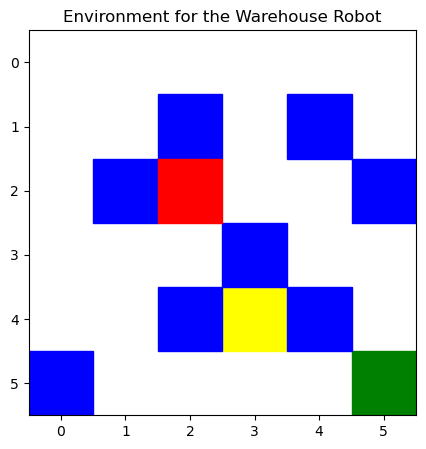

Greedy agent progress:  40%|██████▍         | 4/10 [00:01<00:02,  2.17Episode/s]

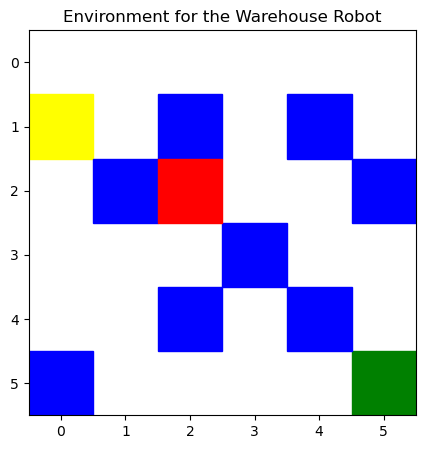

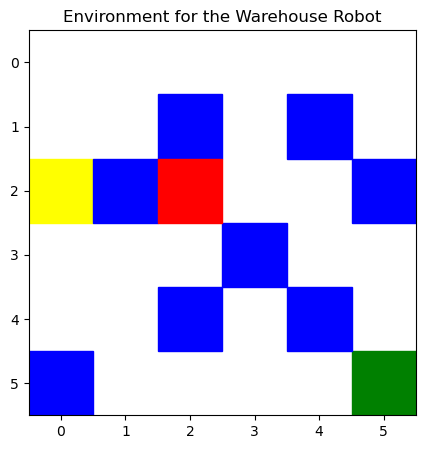

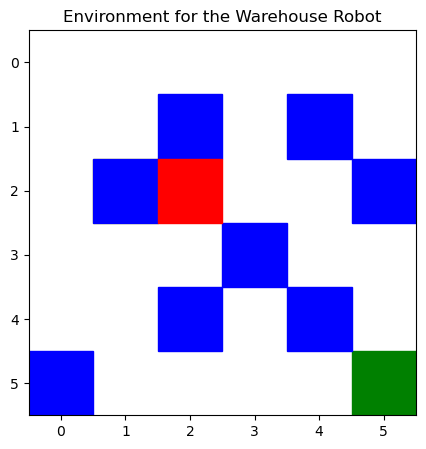

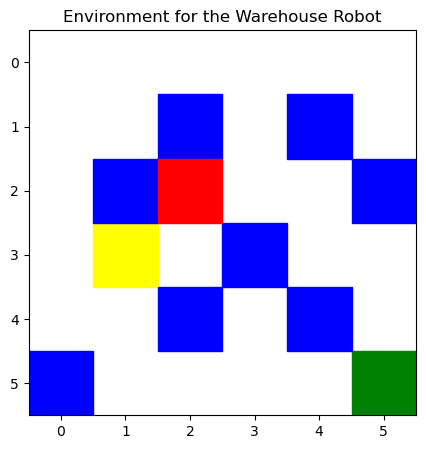

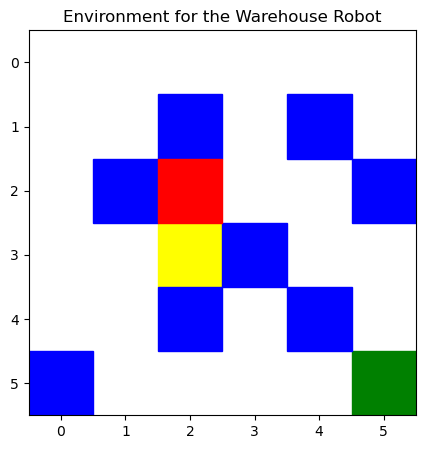

...

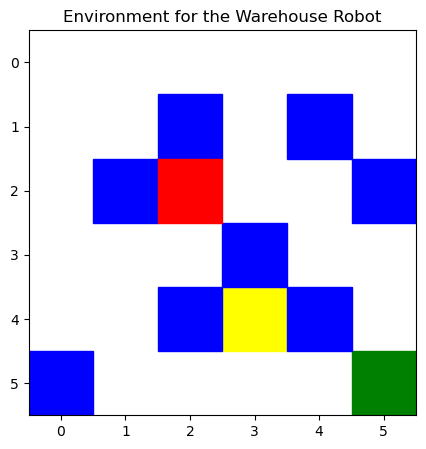

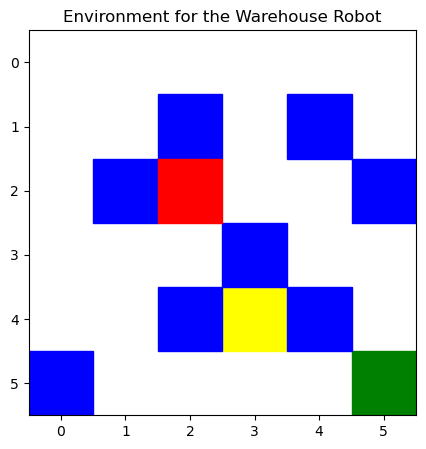

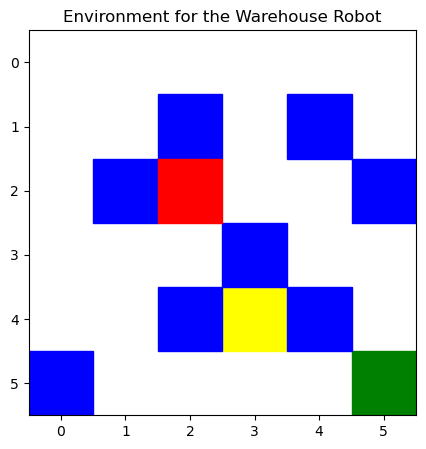

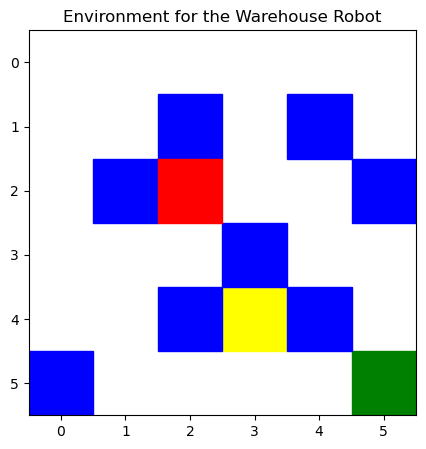

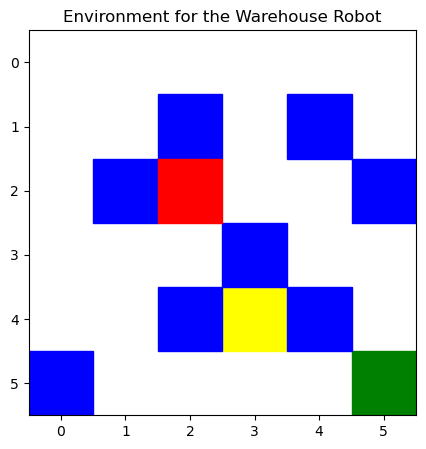

Greedy agent progress:  50%|████████        | 5/10 [00:02<00:02,  2.21Episode/s]

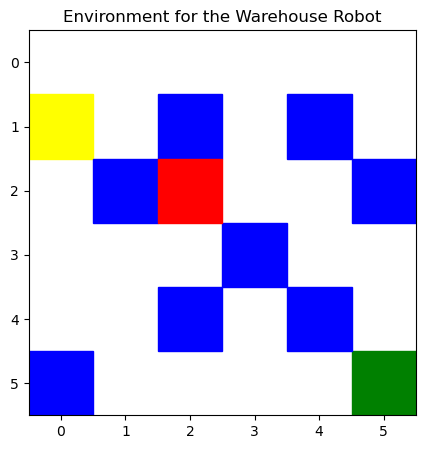

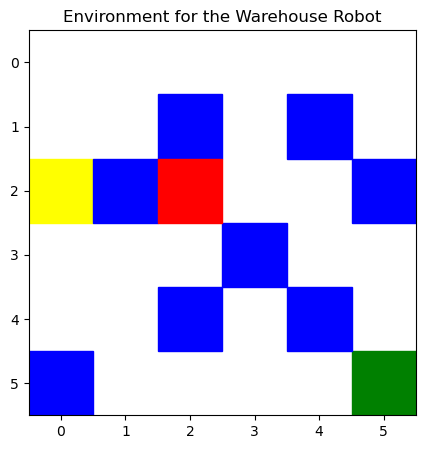

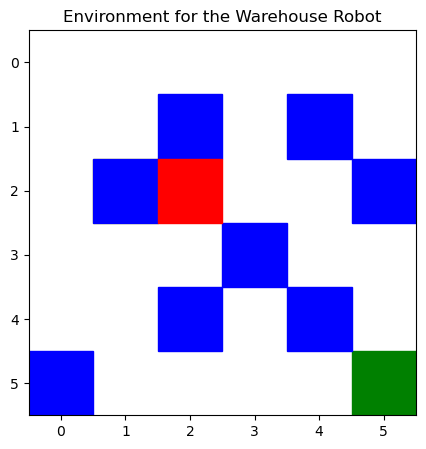

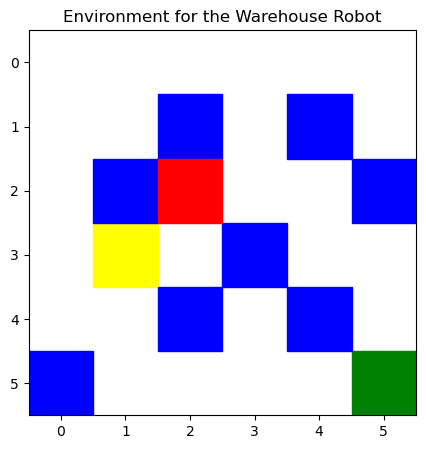

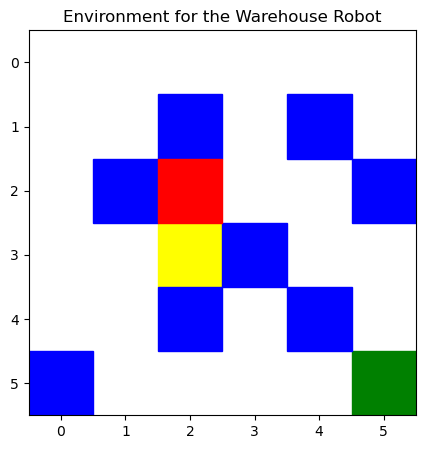

...

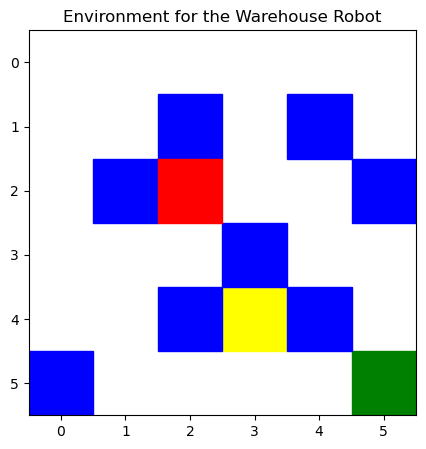

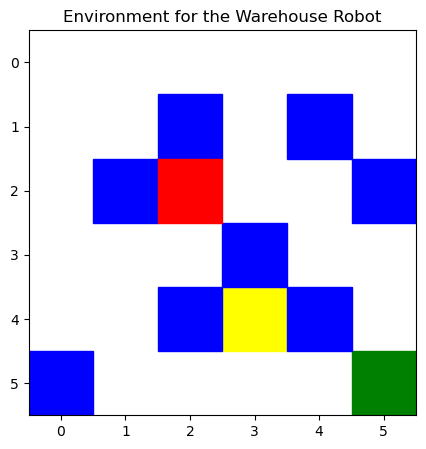

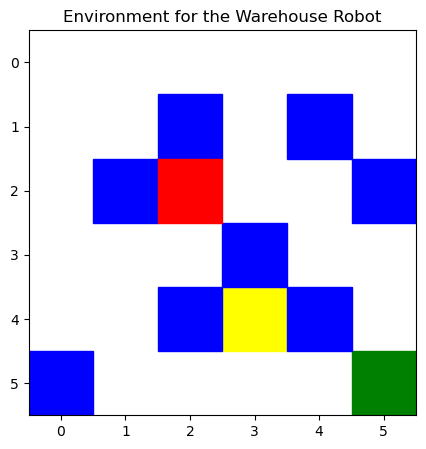

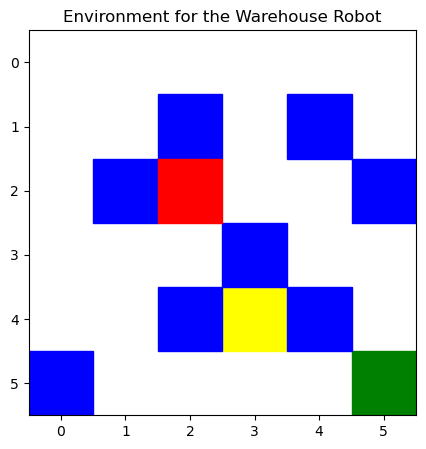

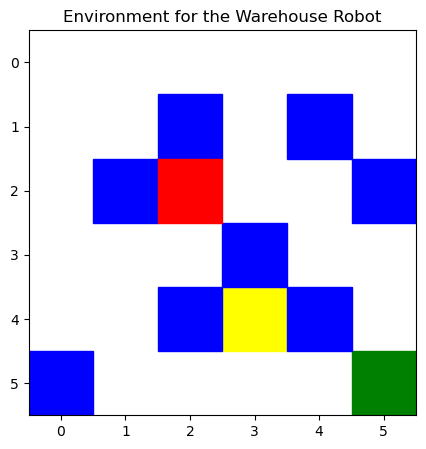

Greedy agent progress:  60%|█████████▌      | 6/10 [00:02<00:01,  2.16Episode/s]

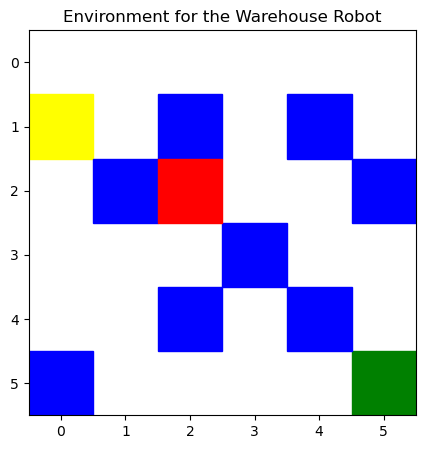

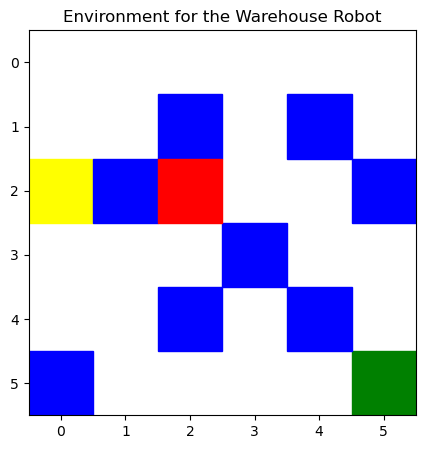

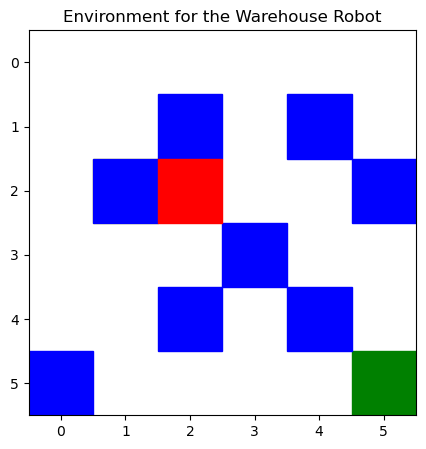

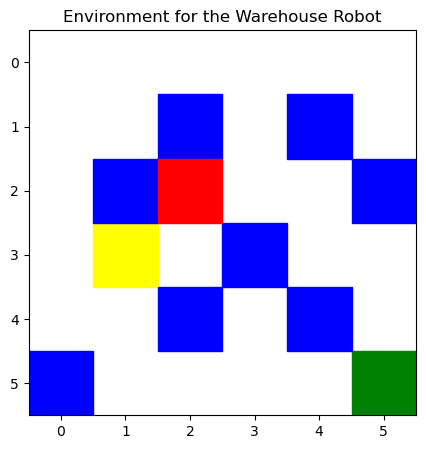

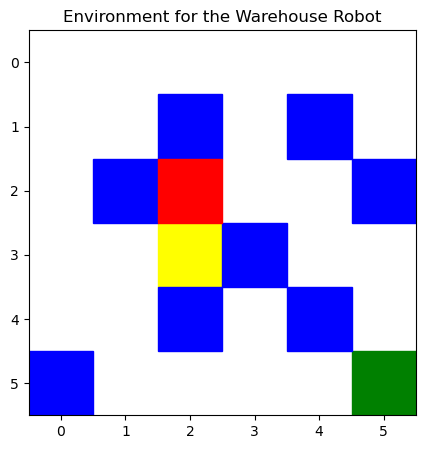

...

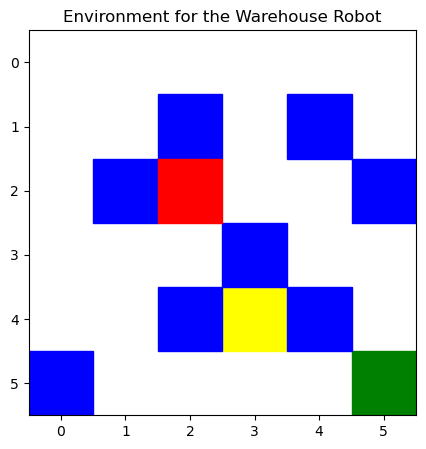

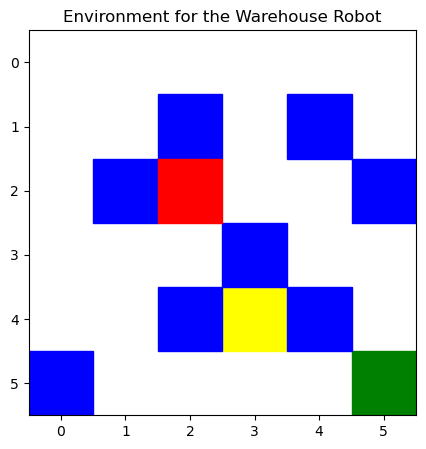

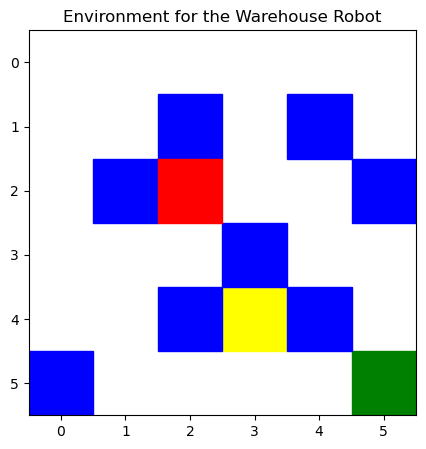

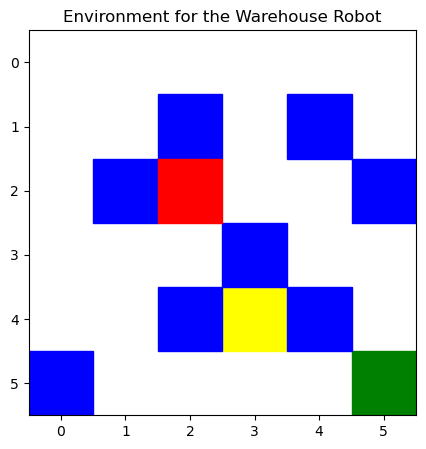

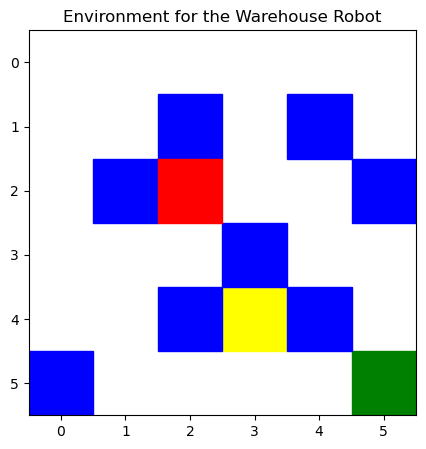

Greedy agent progress:  70%|███████████▏    | 7/10 [00:03<00:01,  2.21Episode/s]

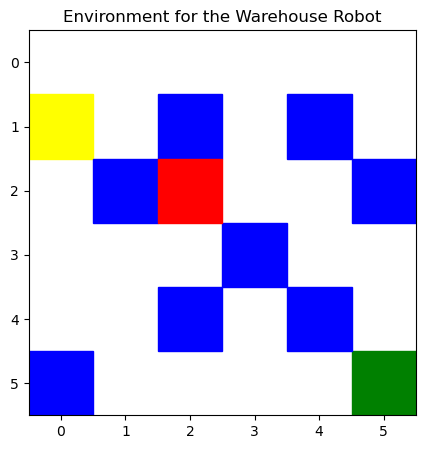

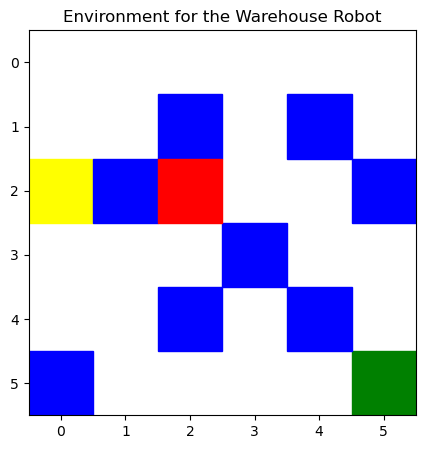

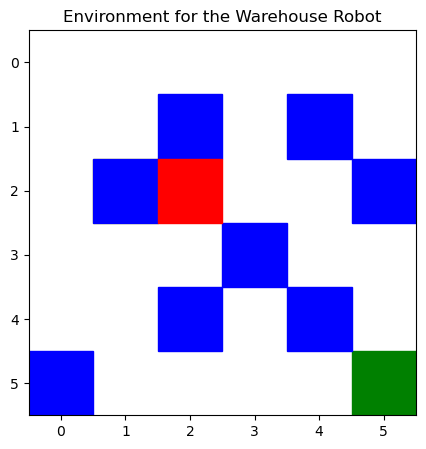

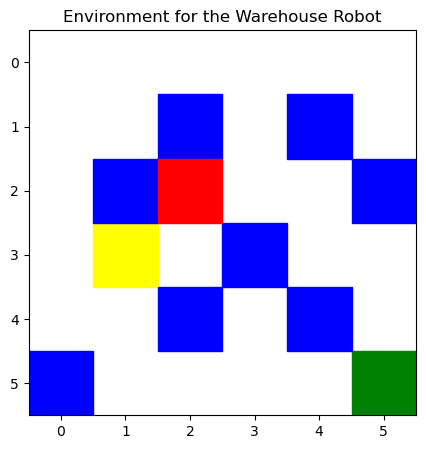

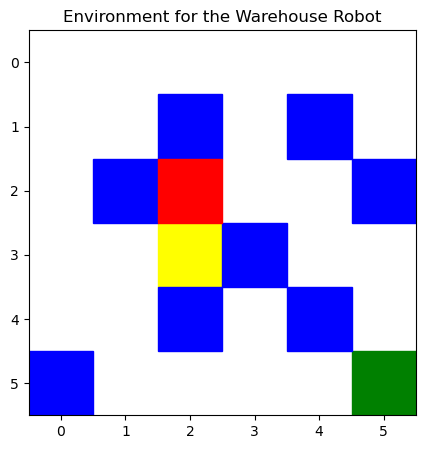

...

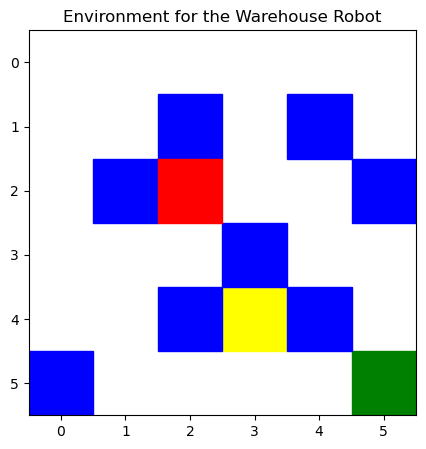

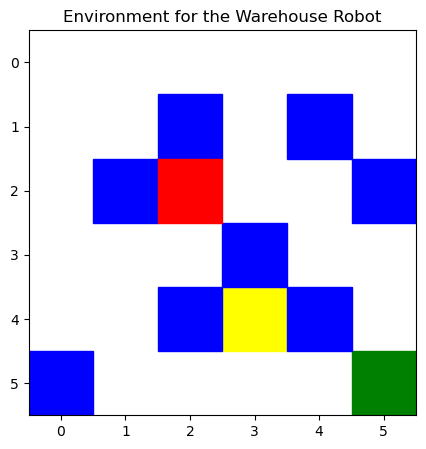

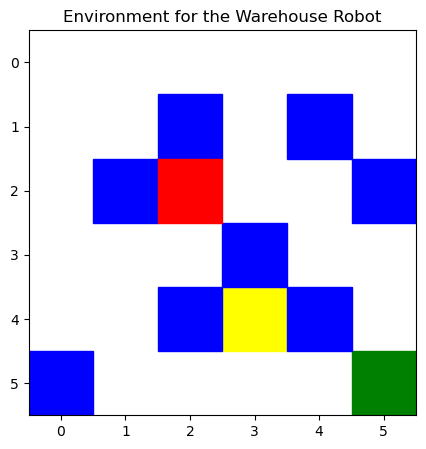

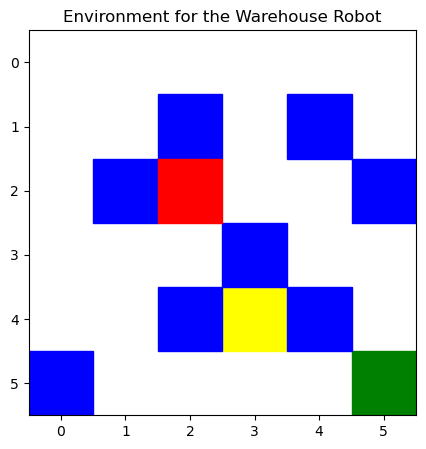

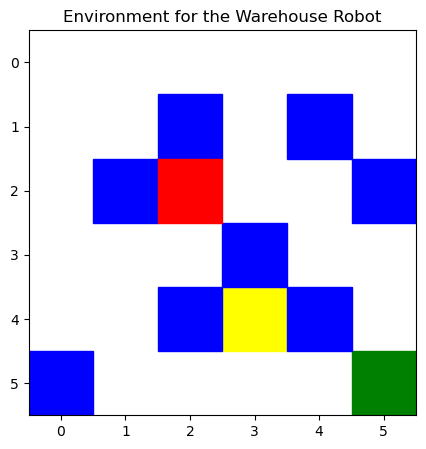

Greedy agent progress:  80%|████████████▊   | 8/10 [00:03<00:00,  2.23Episode/s]

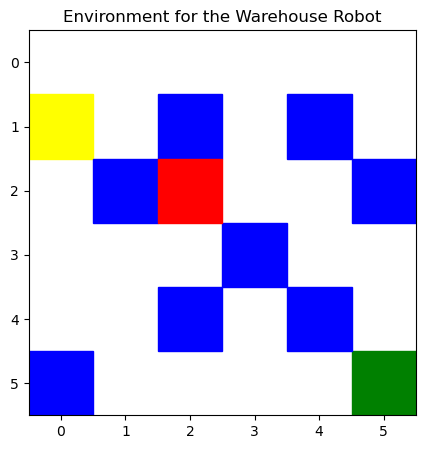

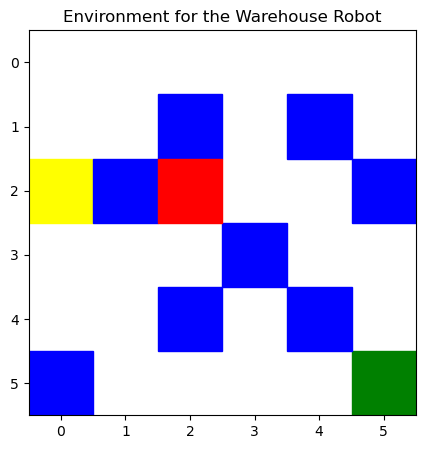

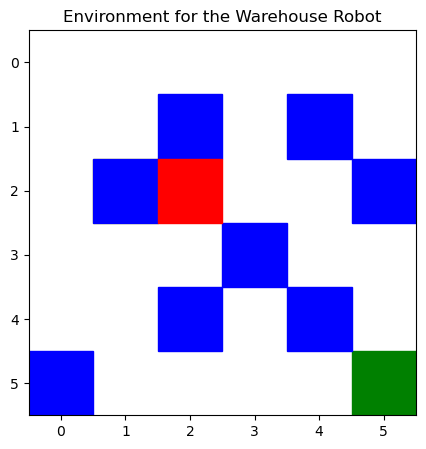

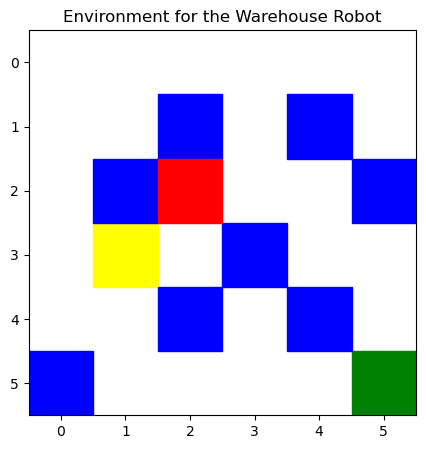

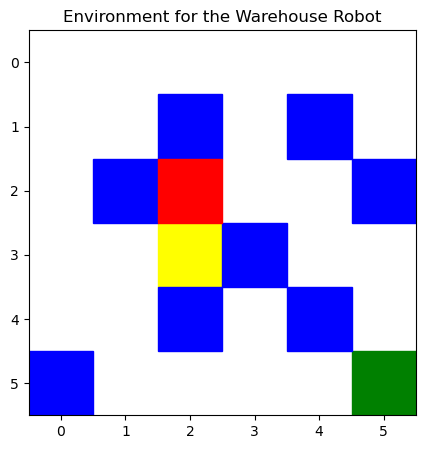

...

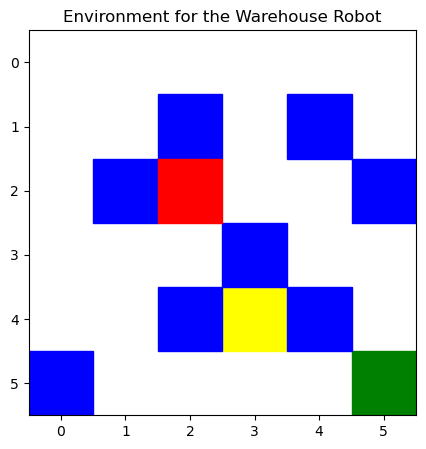

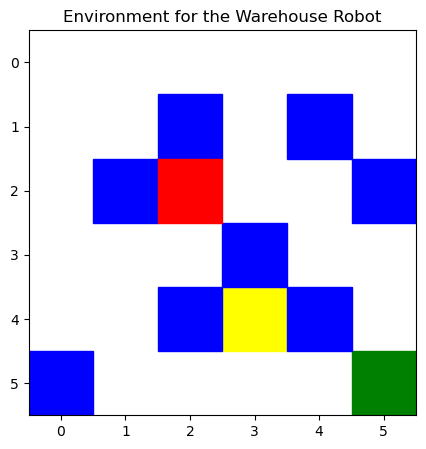

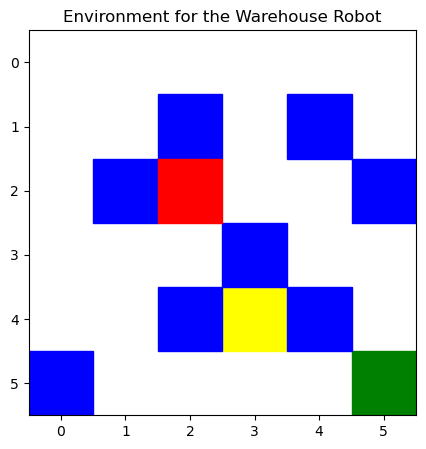

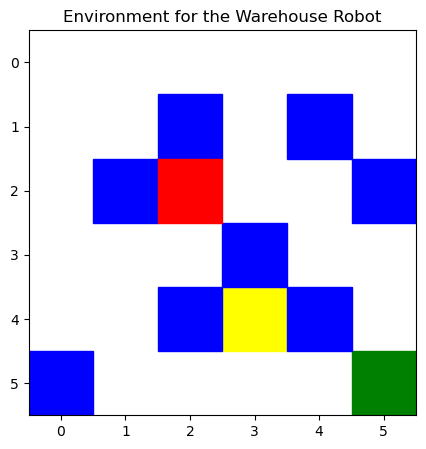

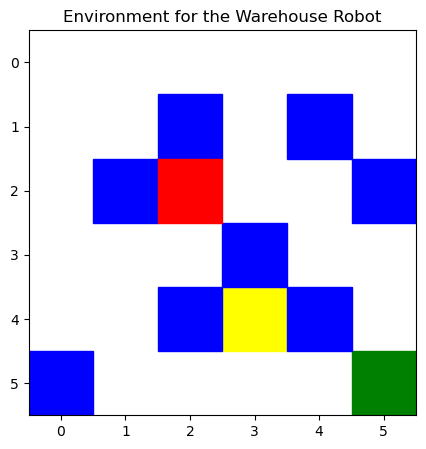

Greedy agent progress:  90%|██████████████▍ | 9/10 [00:04<00:00,  2.18Episode/s]

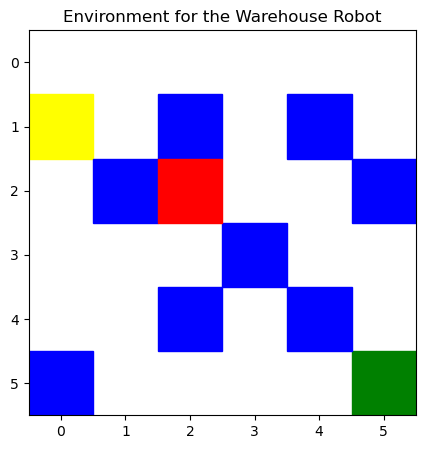

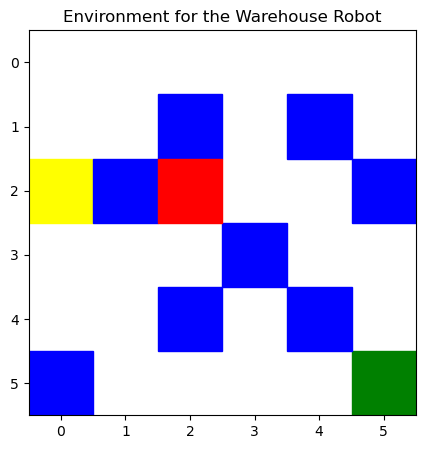

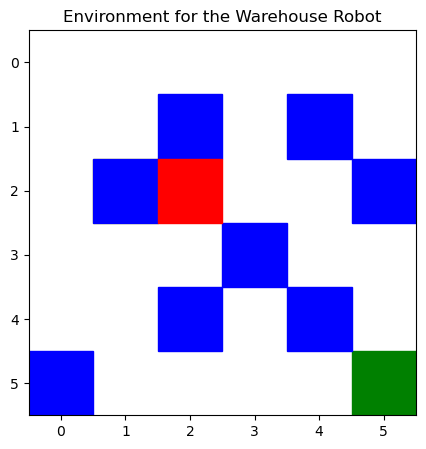

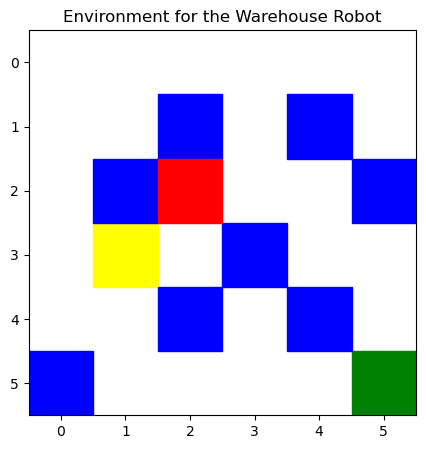

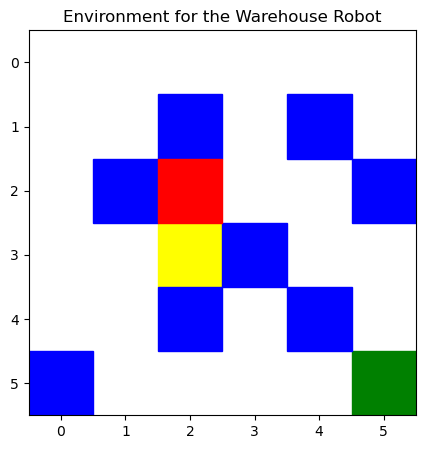

...

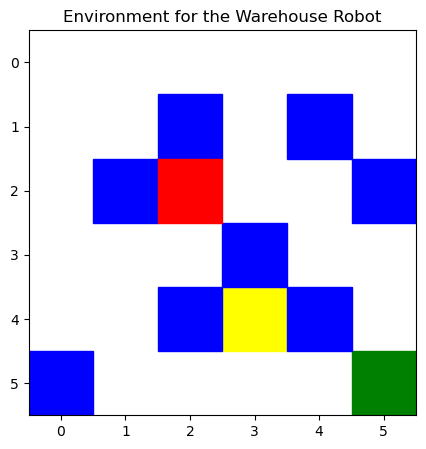

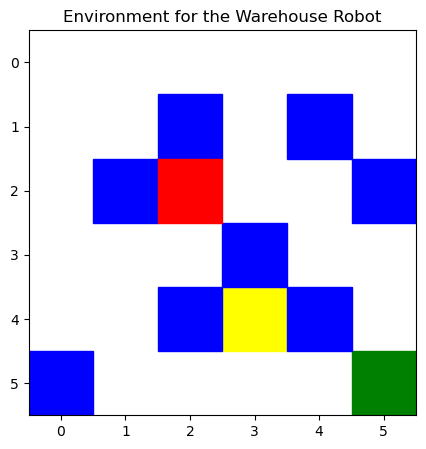

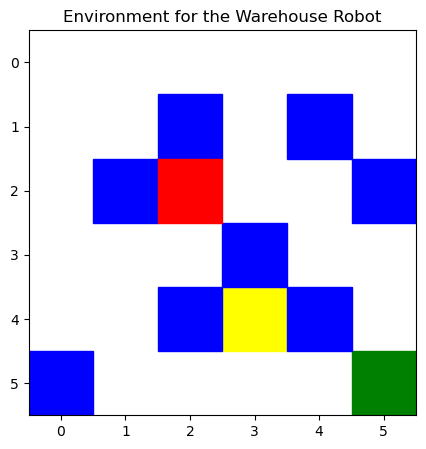

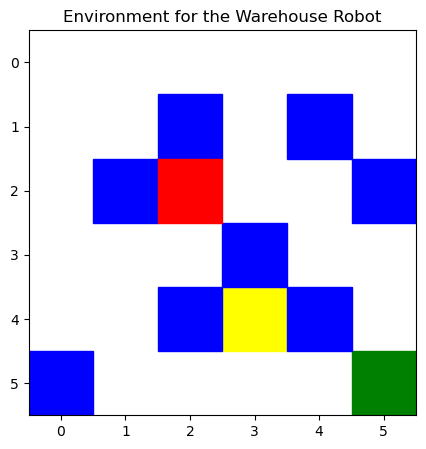

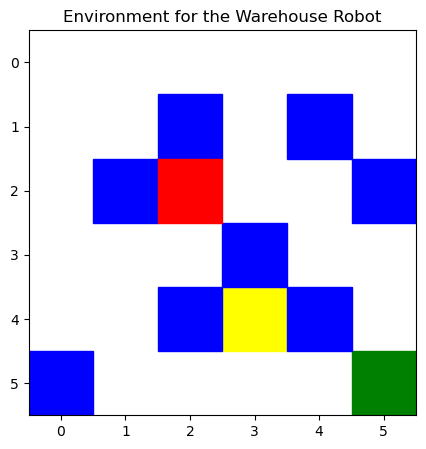

Greedy agent progress: 100%|███████████████| 10/10 [00:04<00:00,  2.19Episode/s]


Total Rewards per Episode: {0: -300, 1: -300, 2: -300, 3: -300, 4: -300, 5: -300, 6: -300, 7: -300, 8: -300, 9: -300}
Average Rewards per Episode: -300.0


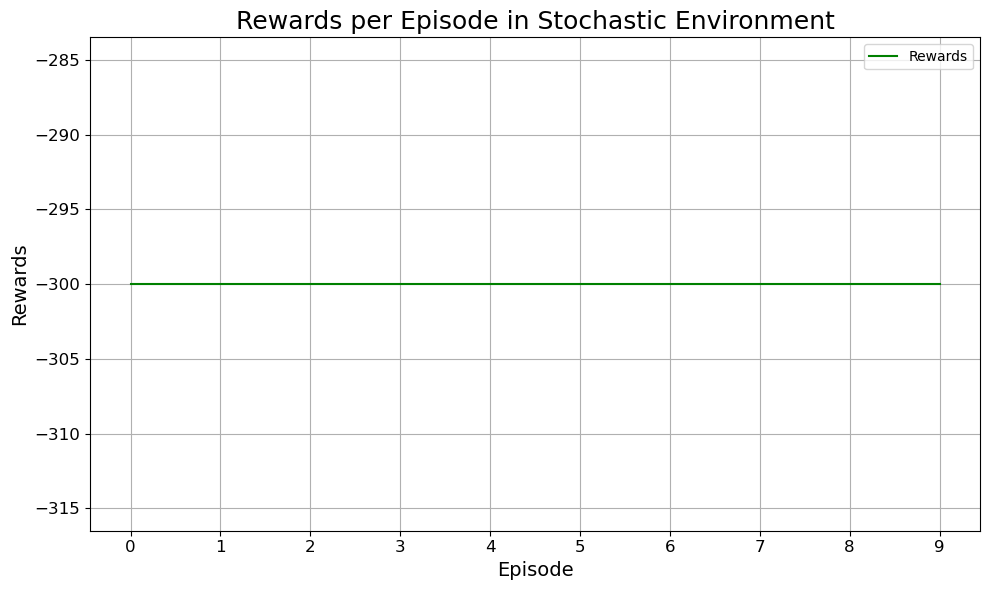

In [115]:
# Training for the agent for Stochastic environment


rewards, avg_rewards, epsilon_values, trained_agent = episode_trainer(
    environment_type='Stochastic', 
    episodes=1000, 
    steps=15, 
    discount_rate=0.99, 
    learning_rate=0.1
)

avg_ep_rewards, greedy_rwd_per_ep = greedy_agent(trained_agent, env, 10)

rewards_per_episode_plot(greedy_rwd_per_ep, 'Stochastic')


# Tune Hyperparameters

In [118]:
import optuna

def objective(trial):
    steps = 100
    episodes = 1000

    learning_rate = trial.suggest_float('learning_rate', 0.01, 1.0, log=True)
    discount_rate = trial.suggest_float('discount_rate', 0.3, 0.99)
    decay_rate = trial.suggest_float('decay_rate', 0.001, 0.1)
    max_epsilon = trial.suggest_float('max_epsilon', 0.5, 1.0)
    min_epsilon = trial.suggest_float('min_epsilon', 0.01, 0.1)

    env = WarehouseEnv(env_type='Deterministic', use_q_learning=True)
    agent = whqlearning(env, learning_rate=learning_rate, discount_rate=discount_rate)

    total_reward = 0
    rewards_per_ep = {}
    
    for episode in range(episodes):
        epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay_rate * episode)

        episode_reward, _ , _ = train(agent, env, steps=steps, epsilon=epsilon,
                                      discount_rate=discount_rate, learning_rate=learning_rate,
                                      episode_no=episode)
        rewards_per_ep[episode] = episode_reward
        total_reward += episode_reward

    return total_reward / episodes  # It will return average reward per episode

# I have create here the Optuna study to maximize the average reward
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

opt_trial = study.best_trial
print('Best Trial Value (Average Reward per Episode): ', opt_trial.value)
print('Best Trial Parameters: ', opt_trial.params)


[I 2024-09-26 00:21:31,548] A new study created in memory with name: no-name-ea44b466-158e-4956-8a6d-178c4f37a94e
[I 2024-09-26 00:21:31,734] Trial 0 finished with value: -316.82 and parameters: {'learning_rate': 0.6965489805465543, 'discount_rate': 0.9456648523251763, 'decay_rate': 0.027813031764046536, 'max_epsilon': 0.7165732667515718, 'min_epsilon': 0.01851245452449739}. Best is trial 0 with value: -316.82.
[I 2024-09-26 00:21:32,044] Trial 1 finished with value: -646.72 and parameters: {'learning_rate': 0.12384259005975362, 'discount_rate': 0.9103591632677778, 'decay_rate': 0.06937541100204545, 'max_epsilon': 0.6680718910673795, 'min_epsilon': 0.04714629963634956}. Best is trial 0 with value: -316.82.
[I 2024-09-26 00:21:32,876] Trial 2 finished with value: -1761.62 and parameters: {'learning_rate': 0.021606283499799088, 'discount_rate': 0.7065770455945046, 'decay_rate': 0.03947002529300529, 'max_epsilon': 0.7234962237211722, 'min_epsilon': 0.06939780218361026}. Best is trial 0 wi

Best Trial Value (Average Reward per Episode):  -309.14
Best Trial Parameters:  {'learning_rate': 0.7734796573557178, 'discount_rate': 0.7203568950229757, 'decay_rate': 0.06966793861725147, 'max_epsilon': 0.8993519415904518, 'min_epsilon': 0.02246136084947845}


Training progress: 100%|██████████████| 5000/5000 [00:16<00:00, 309.20Episode/s]


Average Rewards over all Episodes: -5958.42


Training progress: 100%|██████████████| 5000/5000 [00:16<00:00, 304.05Episode/s]


Average Rewards over all Episodes: -5878.764


Training progress: 100%|██████████████| 5000/5000 [00:16<00:00, 305.52Episode/s]


Average Rewards over all Episodes: -5860.36


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 251.72Episode/s]


Average Rewards over all Episodes: -6971.128


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 254.60Episode/s]


Average Rewards over all Episodes: -6915.328


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 255.24Episode/s]


Average Rewards over all Episodes: -6897.008


Training progress: 100%|██████████████| 5000/5000 [00:14<00:00, 342.81Episode/s]


Average Rewards over all Episodes: -5234.432


Training progress: 100%|██████████████| 5000/5000 [00:14<00:00, 340.82Episode/s]


Average Rewards over all Episodes: -5256.428


Training progress: 100%|██████████████| 5000/5000 [00:14<00:00, 334.77Episode/s]


Average Rewards over all Episodes: -5258.564


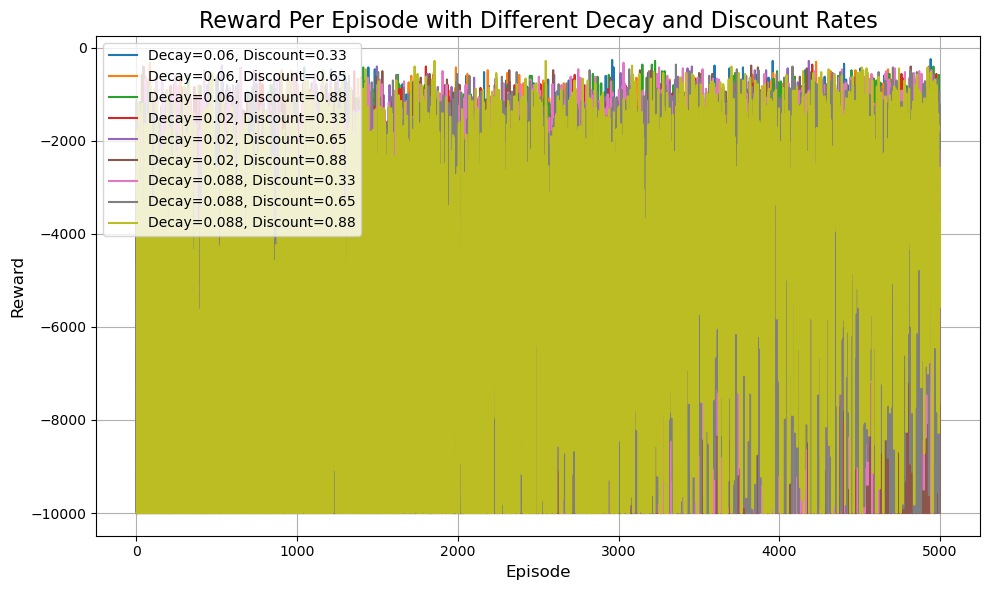

In [120]:
import matplotlib.pyplot as plt
import numpy as np

def optimized_episode_runner(**kwargs):
    learning_rate = 0.8
    max_epsilon = 1.0
    min_epsilon = 0.01

    decay_rate = kwargs.get('decay_rate', 0.5)
    discount_rate = kwargs.get('discount_rate', 0.97)
    environment_type = kwargs.get('environment_type', 'Deterministic')

    reward_per_eps, avg_rewards_per_eps, epsilon_values, agent = episode_trainer(
        environment_type=environment_type,
        episodes=5000,  
        steps=500,     
        discount_rate=discount_rate,
        learning_rate=learning_rate,
        decay_rate=decay_rate
    )

    return reward_per_eps, avg_rewards_per_eps, epsilon_values

decay_rates = [0.06, 0.02, 0.088]
discount_rates = [0.33, 0.65, 0.88]

plt.figure(figsize=(10, 6))
plt.title('Reward Per Episode with Different Decay and Discount Rates', fontsize=16)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Reward', fontsize=12)

for i, decay_rate in enumerate(decay_rates):
    for j, discount_rate in enumerate(discount_rates):
        reward_per_ep, avg_ep_rewards, epsilon_values = optimized_episode_runner(
            decay_rate=decay_rate, discount_rate=discount_rate
        )

        rewards = np.array(list(reward_per_ep.values())).flatten()

        plt.plot(rewards, label=f'Decay={decay_rate}, Discount={discount_rate}')

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# 2.2 Apply the SARSA method

In [126]:
class whsarsa:
    def __init__(self, env, learning_rate=0.1, discount_rate=0.99, epsilon=1.0, epsilon_decay=0.995, min_epsilon=0.01):
        """
        Initializes the SARSA agent for the warehouse environment.
        """
        self.env = env
        self.learning_rate = learning_rate
        self.discount_rate = discount_rate
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.min_epsilon = min_epsilon
        self.state_space_size = env.grid_size[0] * env.grid_size[1] * 2
        self.action_space_size = env.action_space.n
        self.Q_table = np.zeros((self.state_space_size, self.action_space_size))  

    def encode_state(self, position, has_item):
        """
        Encodes the agent's state (position and has_item) into a unique state index.
        """
        pos_index = position[0] * self.env.grid_size[1] + position[1]  
        return pos_index + (self.env.grid_size[0] * self.env.grid_size[1] if has_item else 0)

    def choose_action(self, state, epsilon):
        """
        Chooses an action using the epsilon-greedy policy.
        """
        if np.random.random() < epsilon:
            return self.env.action_space.sample()  
        else:
            return np.argmax(self.Q_table[state])  

    def update(self, state, action, reward, next_state, next_action, learning_rate, discount_rate):
        """
        Updates the Q-value for the given state-action pair using the SARSA update rule.
        """
        td_target = reward + discount_rate * self.Q_table[next_state, next_action]  
        td_error = td_target - self.Q_table[state, action]  
        self.Q_table[state, action] += learning_rate * td_error  

    def update_epsilon(self):
        """
        Updates the epsilon value after each episode.
        """
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)


# Training Phase for SARSA method

In [127]:
def train_sarsa(agent, env, steps, epsilon, discount_rate, learning_rate, episode_no, record_video=False, env_render=False):
    """
    Trains the SARSA agent using the epsilon-greedy strategy for a given number of steps in the warehouse environment.

    """
    state, info = env.reset()  
    state = agent.encode_state(env.agent_pos, env.has_item)  
    action = agent.choose_action(state, epsilon)  

    terminated, truncated = False, False
    total_reward = 0
    successful_dropoff = False
    steps_count = 0
    
    if record_video:
        output_folder = 'warehouse_movement_images'
        os.makedirs(output_folder, exist_ok=True)

    for step in range(steps):
        obs, reward, terminated, truncated, new_info = env.step(action)

        if action == 5 and reward == 20: 
            successful_dropoff = True

        new_state = agent.encode_state(env.agent_pos, env.has_item)
        next_action = agent.choose_action(new_state, epsilon)
        agent.update(state, action, reward, new_state, next_action, learning_rate, discount_rate)
        total_reward += reward
        steps_count += 1

        if env_render:
            env.render()

        if record_video:
            env.render(record_video=True, output_folder=output_folder, episode=episode_no)

        if terminated or truncated:
            break

        state = new_state
        action = next_action

    return total_reward, steps_count, successful_dropoff


In [128]:
if __name__ == "__main__":
    env = WarehouseEnv(env_type='Deterministic')  
    agent = whsarsa(env)  
    num_episodes = 10  

    for episode_no in range(num_episodes):
        total_reward, steps_taken, successful_dropoff = train_sarsa(agent, env, steps=15, epsilon=agent.epsilon,
                                                                    discount_rate=0.99, learning_rate=0.1, episode_no=episode_no,
                                                                    record_video=False, env_render=False)

        agent.update_epsilon()

        if successful_dropoff:
            print(f"Episode {episode_no + 1}: Successful Dropoff!")

        if (episode_no + 1) % 100 == 0:
            print(f"Testing the agent after {episode_no + 1} episodes...")


In [129]:
def episode_trainer_sarsa(environment_type, episodes, steps, discount_rate, learning_rate, decay_rate=2):
    
    max_epsilon = 1
    min_epsilon = 0.01

    timesteps = steps
    convert_to_video = False  
    output_folder = 'grid_movement_images'

    total_rewards = []
    epsilon_values = []
    rewards_per_ep = {i: 0 for i in range(episodes)}

    env = WarehouseEnv(env_type=environment_type, use_q_learning=True)
    agent = whsarsa(env)  

    episode_steps_array = []

    for episode in tqdm(range(episodes), colour='blue', desc='Training progress', unit='Episode'):
        epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay_rate * (episode / episodes))
        epsilon_values.append(epsilon)

        episode_reward, episode_steps, successful_dropoff = train_sarsa(agent, env, steps, epsilon, discount_rate, learning_rate, episode, convert_to_video)

        rewards_per_ep[episode] = episode_reward
        total_rewards.append(episode_reward)
        episode_steps_array.append(episode_steps)


    rewards_per_ep_array = np.array(list(rewards_per_ep.values())).flatten()
    avg_rewards_over_eps = np.mean(rewards_per_ep_array)

    print("Average Rewards over all Episodes:", avg_rewards_over_eps)

    return rewards_per_ep, avg_rewards_over_eps, epsilon_values, agent


In [130]:
rewards_per_ep, avg_rewards_over_eps, epsilon_values, agent = episode_trainer_sarsa(
    environment_type='Deterministic',
    episodes=1000,
    steps=15,
    discount_rate=0.99,
    learning_rate=0.1
)


Training progress: 100%|█████████████| 1000/1000 [00:00<00:00, 5212.49Episode/s]

Average Rewards over all Episodes: -299.94


# Save the Q-table

In [134]:

def print_and_save_Q_table_sarsa(environment_type, agent):
    """
    Prints and saves the Q-table of the trained SARSA agent for the given environment type.
    """
    print("Environment Type: ", environment_type, '\n')
    np.set_printoptions(suppress=True)  

    action_labels = ['DOWN', 'UP', 'RIGHT', "LEFT", "PICK",  "DROP"]
    state_labels = [f'S{i}' for i in range(agent.Q_table.shape[0])]
    df = pd.DataFrame(agent.Q_table, index=state_labels, columns=action_labels)
    print("\nQ-table:")
    print(df.to_string(float_format="{:.2f}".format))

    q_table_file_name = f'/Users/anip/Desktop/anipkuma_assignment1_checkpoint/Q_table_SARSA__{environment_type}.h5'
    
    with h5py.File(q_table_file_name, 'w') as f:
        f.create_dataset('Q_table', data=agent.Q_table)

    print("Saved Q-table into file: ", q_table_file_name)
    print(f"Q-table shape: {agent.Q_table.shape}")


In [135]:
print_and_save_Q_table_sarsa(environment_type='Deterministic', agent=agent)


Environment Type:  Deterministic 


Q-table:
       DOWN      UP   RIGHT    LEFT    PICK    DROP
S0  -145.05 -152.64 -143.64 -154.28 -151.54 -154.66
S1  -125.08 -132.07 -125.04 -146.89 -129.08 -128.29
S2  -106.83 -109.30 -107.08 -122.95 -111.81 -109.30
S3   -91.02  -91.46  -91.13  -93.51  -92.90  -91.30
S4   -76.24  -79.27  -77.00  -79.66  -79.28  -78.07
S5   -65.83  -66.72  -65.15  -66.61  -67.39  -67.92
S6  -124.33 -148.81 -124.27 -126.62 -126.95 -127.08
S7  -107.20 -112.70 -107.34 -126.49 -107.20 -111.09
S8   -89.87  -94.51  -89.97 -100.80  -90.09  -90.72
S9   -77.18  -80.31  -77.55  -85.05  -78.91  -78.54
S10  -65.81  -65.85  -65.27  -66.60  -66.79  -67.59
S11  -56.87  -57.50  -59.97  -56.94  -59.27  -59.80
S12 -106.69 -122.02 -106.60 -110.75 -109.13 -109.12
S13  -90.31 -102.30  -90.06  -96.33  -92.37  -91.93
S14  -72.19  -87.33  -72.67  -82.00  -71.70  -71.71
S15  -63.64  -68.07  -64.36  -65.90  -64.67  -65.39
S16  -53.98  -55.93  -53.18  -56.00  -54.99  -54.45
S17  -43.86  -45.95

In [141]:
episodes = 5000
steps = 256
discount_rate = 0.97
learning_rate = 0.7
decay_rate = 2
environment_type = 'Deterministic'

determ_reward_per_eps, determ_avg_rewards_per_eps, deter_epsilon_values, trained_agent = episode_trainer_sarsa(
    environment_type=environment_type,
    episodes=episodes,
    steps=steps,
    discount_rate=discount_rate,
    learning_rate=learning_rate,
    decay_rate=decay_rate
)

print("Total rewards per episode (SARSA):", determ_reward_per_eps)
print("Average reward per episode (SARSA):", determ_avg_rewards_per_eps)

Training progress: 100%|█████████████| 5000/5000 [00:02<00:00, 1865.87Episode/s]

Average Rewards over all Episodes: -959.456
Total rewards per episode (SARSA): {0: -3080, 1: -5120, 2: -3240, 3: -5120, 4: -5120, 5: -5120, 6: -3280, 7: -5120, 8: -1420, 9: -5120, 10: -5120, 11: -5120, 12: -5120, 13: -5120, 14: -5120, 15: -5120, 16: -5120, 17: -5120, 18: -5120, 19: -5120, 20: -2720, 21: -5120, 22: -5120, 23: -5120, 24: -5120, 25: -5120, 26: -5120, 27: -1740, 28: -5120, 29: -5120, 30: -5120, 31: -5120, 32: -5120, 33: -3200, 34: -5120, 35: -5120, 36: -2620, 37: -5120, 38: -5120, 39: -5120, 40: -5120, 41: -5120, 42: -5120, 43: -3800, 44: -5120, 45: -5120, 46: -5120, 47: -1360, 48: -5120, 49: -5120, 50: -5120, 51: -5120, 52: -2020, 53: -4540, 54: -2640, 55: -5120, 56: -5120, 57: -1920, 58: -5120, 59: -4220, 60: -3880, 61: -3820, 62: -5120, 63: -5120, 64: -5120, 65: -5120, 66: -5120, 67: -5120, 68: -5120, 69: -5120, 70: -5120, 71: -5120, 72: -5120, 73: -5120, 74: -1480, 75: -5120, 76: -5120, 77: -5120, 78: -3820, 79: -3080, 80: -4960, 81: -5120, 82: -5120, 83: -5120, 84: -2

In [144]:
def print_and_save_Q_table_SARSA(environment_type, agent):
    """
    Prints and saves the SARSA Q-table after training with a custom name.
    """
    print("Environment Type: ", environment_type, '\n')
    np.set_printoptions(suppress=True)

    action_labels = ['DOWN', 'UP', 'RIGHT', "LEFT", "PICK",  "DROP"]
    state_labels = [f'S{i}' for i in range(agent.Q_table.shape[0])]
    df = pd.DataFrame(agent.Q_table, index=state_labels, columns=action_labels)

    print("\nQ-table (SARSA):")
    print(df.to_string(float_format="{:.2f}".format))

    q_table_file_name = f'/Users/anip/Desktop/anipkuma_assignment1_checkpoint/Q_table_SARSA__{environment_type}_trained.h5'
    
    with h5py.File(q_table_file_name, 'w') as f:
        f.create_dataset('Q_table', data=agent.Q_table)

    print(f"Saved SARSA Q-table into file: {q_table_file_name}")
    print(f"Q-table shape: {agent.Q_table.shape}")

print_and_save_Q_table_SARSA(environment_type, trained_agent)


Environment Type:  Deterministic 


Q-table (SARSA):
       DOWN      UP   RIGHT    LEFT    PICK    DROP
S0  -300.01 -295.19 -249.15 -287.62 -292.36 -283.90
S1  -288.92 -286.65 -248.21 -296.25 -291.73 -273.33
S2  -248.33 -272.96 -321.11 -282.70 -244.84 -263.92
S3  -300.29 -258.52 -364.95 -246.45 -338.12 -303.23
S4  -363.64 -511.06 -543.87 -371.39 -400.62 -484.94
S5  -557.04 -539.50 -495.07 -388.05 -550.17 -567.13
S6  -297.39 -268.63 -331.40 -288.88 -321.12 -309.09
S7  -204.85 -290.17 -274.59 -279.49 -278.57 -287.58
S8  -251.61 -243.65 -263.71 -247.65 -229.32 -239.22
S9  -355.02 -283.37 -346.68 -263.60 -305.23 -341.28
S10 -263.90 -411.03 -501.67 -420.09 -308.42 -397.06
S11 -544.41 -547.03 -432.96 -370.06 -466.94 -552.66
S12 -355.17 -322.26 -191.33 -315.42 -323.24 -323.00
S13 -250.82 -273.03 -167.53 -238.23 -275.58 -272.12
S14 -243.66 -255.50 -180.44 -284.46 -154.14 -196.19
S15 -281.10 -246.02 -298.32 -164.92 -223.43 -298.64
S16 -503.65 -289.91 -505.93 -213.60 -391.38 -406.24
S17 -488.67

# Model training for the stochastic environment

In [145]:
episodes = 5000
steps = 256
discount_rate = 0.95
learning_rate = 0.8
decay_rate = 2
environment_type = 'Stochastic'  

stoch_reward_per_eps, stoch_avg_rewards_per_eps, stoch_epsilon_values, stoch_agent = episode_trainer_sarsa(
    environment_type=environment_type,
    episodes=episodes,
    steps=steps,
    discount_rate=discount_rate,
    learning_rate=learning_rate,
    decay_rate=decay_rate
)

print("Total rewards per episode (SARSA):", stoch_reward_per_eps)
print("Average reward per episode (SARSA):", stoch_avg_rewards_per_eps)

Training progress: 100%|█████████████| 5000/5000 [00:03<00:00, 1343.02Episode/s]

Average Rewards over all Episodes: -1335.472
Total rewards per episode (SARSA): {0: -5120, 1: -5120, 2: -5080, 3: -5120, 4: -5120, 5: -5120, 6: -5120, 7: -5120, 8: -5120, 9: -5120, 10: -5120, 11: -5120, 12: -5120, 13: -5120, 14: -4460, 15: -5120, 16: -5120, 17: -5120, 18: -5120, 19: -5120, 20: -5120, 21: -3160, 22: -5120, 23: -3480, 24: -4660, 25: -5120, 26: -5120, 27: -5120, 28: -5120, 29: -5120, 30: -3600, 31: -5120, 32: -5120, 33: -5120, 34: -5120, 35: -2780, 36: -5020, 37: -5120, 38: -5120, 39: -5120, 40: -5120, 41: -4720, 42: -5120, 43: -5120, 44: -5120, 45: -4860, 46: -2780, 47: -4640, 48: -5120, 49: -5120, 50: -5120, 51: -4480, 52: -5120, 53: -1700, 54: -5120, 55: -5120, 56: -2160, 57: -3060, 58: -4660, 59: -5120, 60: -4700, 61: -5120, 62: -2500, 63: -5120, 64: -5120, 65: -5120, 66: -5120, 67: -5120, 68: -4080, 69: -740, 70: -5120, 71: -5120, 72: -5120, 73: -5120, 74: -5120, 75: -5120, 76: -5120, 77: -3220, 78: -2660, 79: -5120, 80: -5120, 81: -5120, 82: -5120, 83: -2540, 84: -5

In [146]:
def print_and_save_Q_table_SARSA(environment_type, agent):
    """
    Prints and saves the SARSA Q-table after training with a custom name.
    """
    print("Environment Type: ", environment_type, '\n')
    np.set_printoptions(suppress=True)

    action_labels = ['DOWN', 'UP', 'RIGHT', "LEFT", "PICK",  "DROP"]
    state_labels = [f'S{i}' for i in range(agent.Q_table.shape[0])]
    df = pd.DataFrame(agent.Q_table, index=state_labels, columns=action_labels)

    print("\nQ-table (SARSA):")
    print(df.to_string(float_format="{:.2f}".format))

    q_table_file_name = f'/Users/anip/Desktop/anipkuma_assignment1_checkpoint/Q_table_SARSA__{environment_type}_trained.h5'
    
    with h5py.File(q_table_file_name, 'w') as f:
        f.create_dataset('Q_table', data=agent.Q_table)

    print(f"Saved SARSA Q-table into file: {q_table_file_name}")
    print(f"Q-table shape: {agent.Q_table.shape}")

print_and_save_Q_table_SARSA(environment_type, stoch_agent)


Environment Type:  Stochastic 


Q-table (SARSA):
       DOWN      UP   RIGHT    LEFT    PICK    DROP
S0  -239.87 -302.04 -320.04 -312.30 -308.12 -305.61
S1  -253.20 -307.08 -309.04 -306.68 -309.83 -234.00
S2  -310.44 -320.83 -193.95 -307.74 -313.15 -318.92
S3  -286.93 -255.99 -316.33 -317.98 -343.55 -313.49
S4  -330.42 -322.46 -348.95 -316.73 -320.00 -337.47
S5  -356.84 -362.96 -367.12 -366.14 -364.63 -363.51
S6  -270.77 -311.58 -238.67 -293.08 -297.43 -302.16
S7  -222.80 -299.73 -282.61 -240.61 -298.34 -275.40
S8  -227.84 -307.69 -286.11 -281.96 -280.79 -298.29
S9  -299.73 -325.53 -318.41 -229.13 -312.57 -317.17
S10 -339.26 -339.10 -351.35 -312.95 -323.19 -351.21
S11 -366.70 -361.43 -356.09 -310.75 -344.84 -362.66
S12 -292.25 -314.77 -193.29 -306.63 -304.18 -297.56
S13 -244.10 -269.50 -189.87 -310.44 -218.44 -265.92
S14 -289.46 -279.24 -298.95 -277.14 -201.73 -278.69
S15 -286.20 -289.27 -282.63 -286.17 -310.03 -285.29
S16 -338.41 -355.23 -354.08 -304.92 -339.67 -334.81
S17 -348.78 -3

# Plot configuration for the environment 

In [148]:
def rewards_per_episode_plot_sarsa(rewards_per_ep, environment_type, epsilons=[]):
    """
    Plots rewards per episode for SARSA.
    """
    episodes = np.array(list(rewards_per_ep.keys())).flatten()
    rewards = np.array(list(rewards_per_ep.values())).flatten()

    plt.figure(figsize=(10, 6))
    plt.plot(episodes, rewards, linestyle='-', markersize=4, color='blue', label='Rewards (SARSA)')

    if epsilons:
        epsilons = np.array(epsilons).flatten()
        plt.plot(episodes, epsilons, linestyle='--', color='red', label='Epsilon Decay')

    plt.title(f'SARSA: Rewards per Episode in {environment_type} Environment', fontsize=18)
    plt.xlabel('Episode', fontsize=14)
    plt.ylabel('Rewards', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.xticks(range(0, max(episodes)+1, max(1, len(episodes)//10)), fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()


In [150]:
def epsilon_decay_plot_sarsa(epsilon_values, environment_type):
    """
    Plots the epsilon decay over episodes for SARSA.
    """
    if isinstance(epsilon_values, dict):
        epsilon_values = list(epsilon_values.values())

    plt.figure(figsize=(10, 6))
    plt.plot(epsilon_values, marker='o', linestyle='-', markersize=4, color='purple')
    plt.title(f'SARSA: Epsilon Decay in {environment_type} Environment', fontsize=18)
    plt.xlabel('Episode', fontsize=14)
    plt.ylabel('Epsilon Value', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


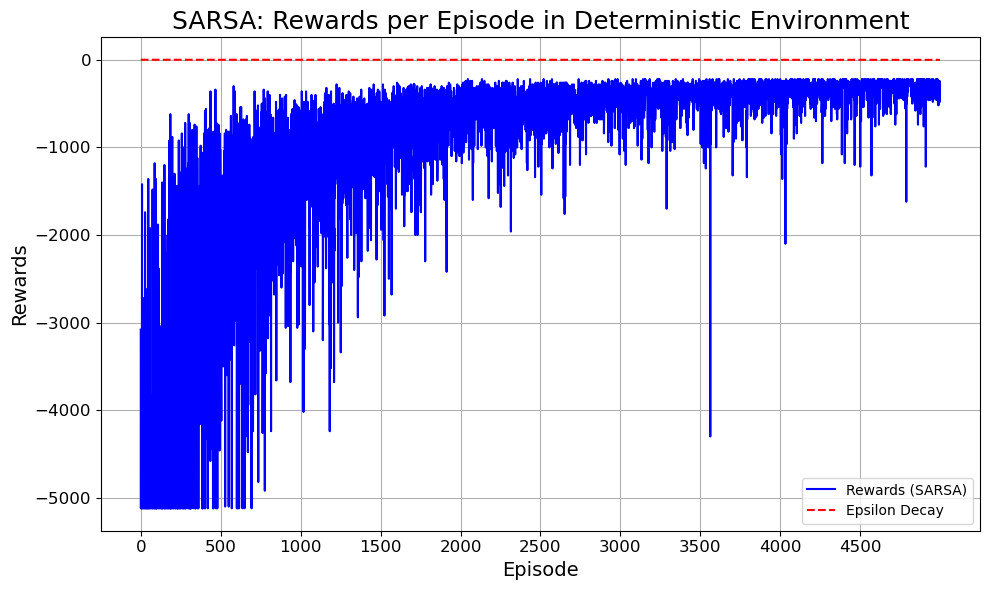

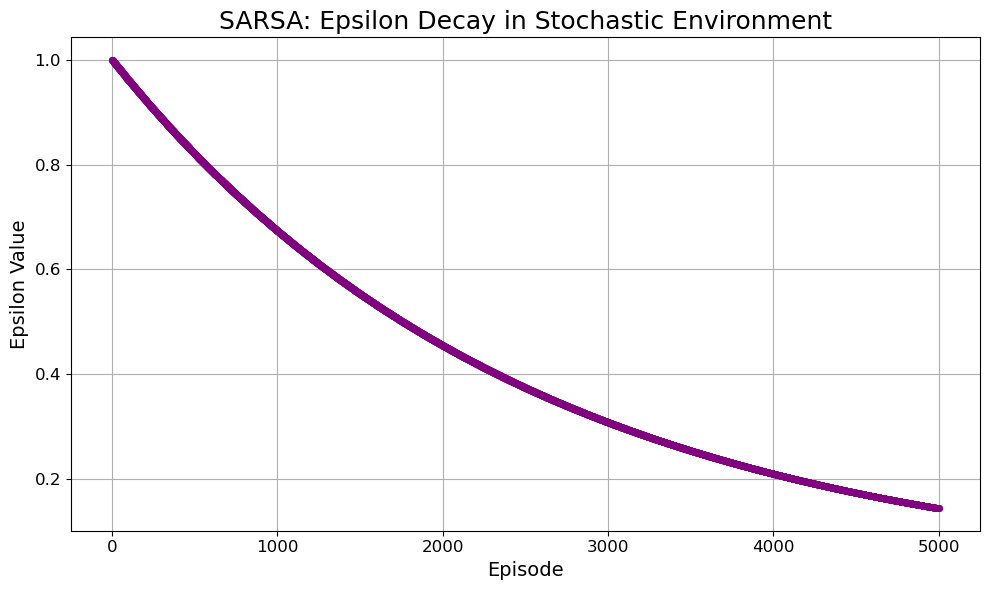

In [152]:
# I plot here the Rewards and epsilon decay curve for per episode Deterministic Environment

rewards_per_episode_plot_sarsa(determ_reward_per_eps, environment_type='Deterministic', epsilons=deter_epsilon_values)
epsilon_decay_plot_sarsa(deter_epsilon_values, environment_type='Deterministic')


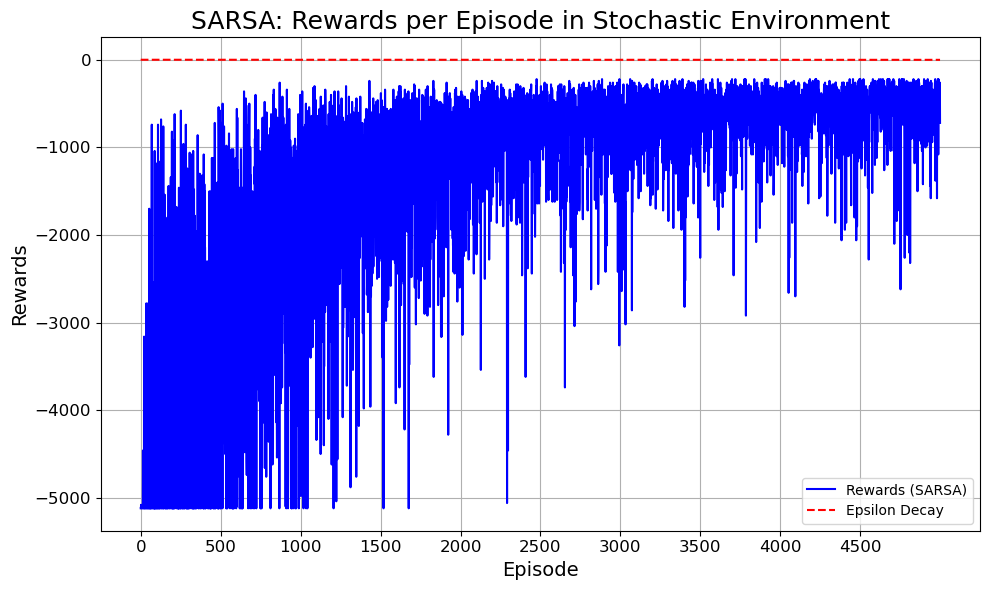

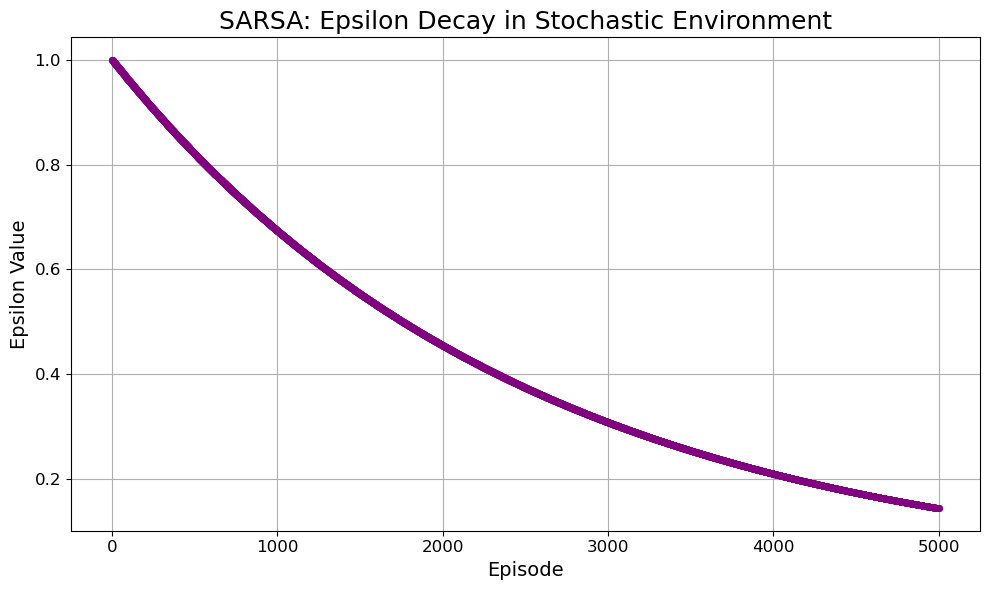

In [151]:
# I plot here the Rewards and epsilon decay curve for per episode Deterministic Environment

rewards_per_episode_plot_sarsa(stoch_reward_per_eps, environment_type='Stochastic', epsilons=stoch_epsilon_values)
epsilon_decay_plot_sarsa(stoch_epsilon_values, environment_type='Stochastic')


# Greedy Action for the Deterministic Env

In [155]:
def greedy_agent_sarsa(agent, env, n_episodes=10):
    epsilon = 0  
    total_episodes = n_episodes  
    steps_per_episode = 15  
    greedy_reward_per_ep = {}
    print("Environment type:", env.env_type)
    
    for episode in tqdm(range(total_episodes), colour='blue', desc='Greedy agent progress (SARSA)', unit='Episode'):
        state, info = env.reset()
        state = agent.encode_state(env.agent_pos, env.has_item)  
        terminated, truncated = False, False

        total_reward = 0
        steps_count = 0
        action = agent.choose_action(state, epsilon)

        for step in range(steps_per_episode):
            obs, reward, terminated, truncated, new_info = env.step(action)
            total_reward += reward

            new_state = agent.encode_state(env.agent_pos, env.has_item)
            next_action = agent.choose_action(new_state, epsilon)
            agent.update(state, action, reward, new_state, next_action, agent.learning_rate, agent.discount_rate)

            state = new_state
            action = next_action
            steps_count += 1
            env.render()

            if terminated or truncated:
                break

        greedy_reward_per_ep[episode] = total_reward

    rewards_per_ep_array = np.array(list(greedy_reward_per_ep.values())).flatten()
    avg_rewards_over_eps = np.mean(rewards_per_ep_array)

    print(f"\nTotal Rewards per Episode (SARSA): {greedy_reward_per_ep}")
    print(f"Average Rewards per Episode (SARSA): {avg_rewards_over_eps}")
    
    return avg_rewards_over_eps, greedy_reward_per_ep


Training progress: 100%|█████████████| 1000/1000 [00:00<00:00, 4416.07Episode/s]


Average Rewards over all Episodes: -299.9
Environment type: Deterministic


Greedy agent progress (SARSA):   0%|                | 0/10 [00:00<?, ?Episode/s]

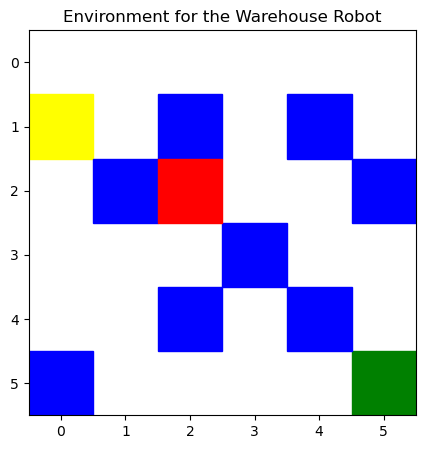

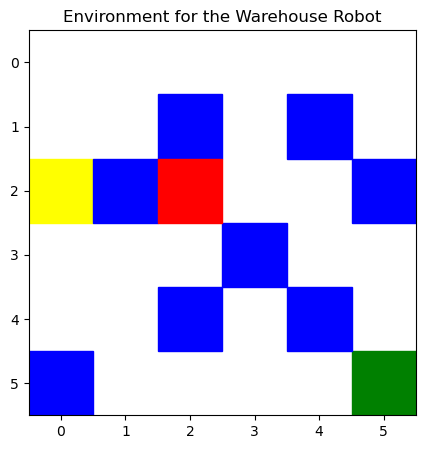

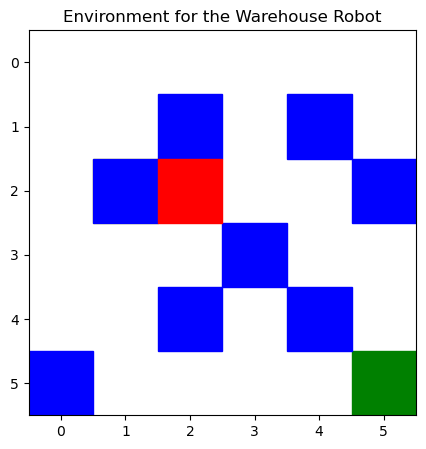

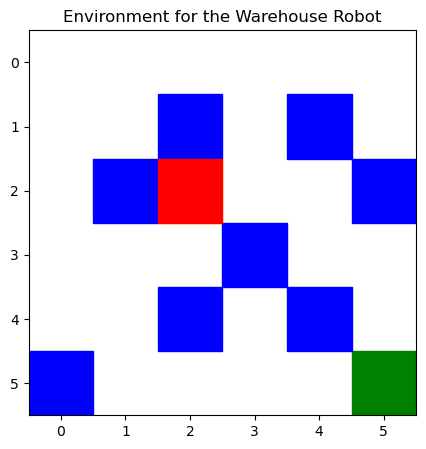

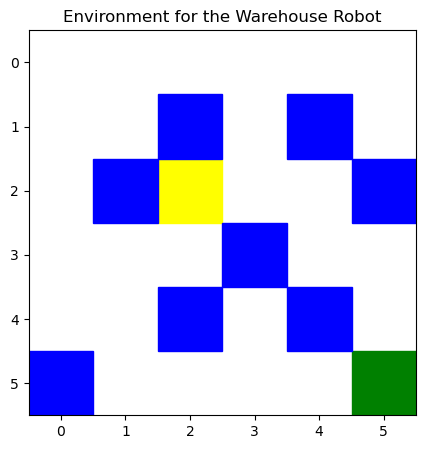

...

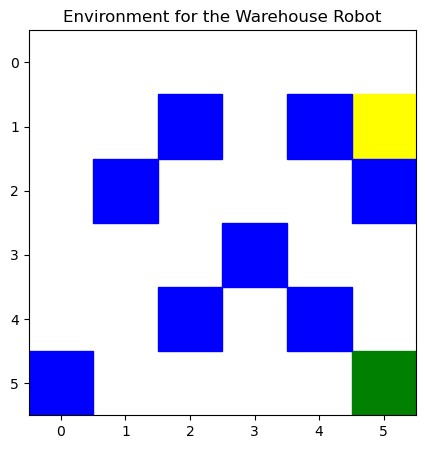

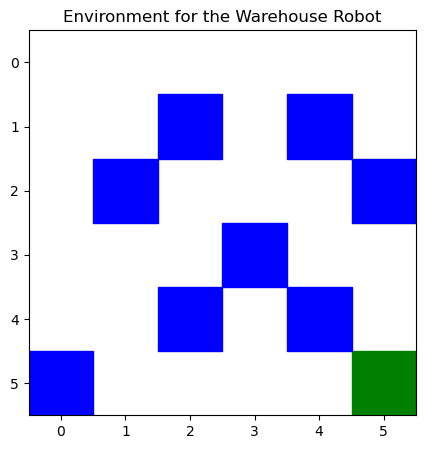

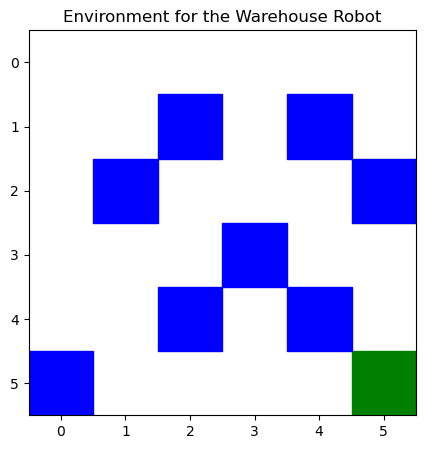

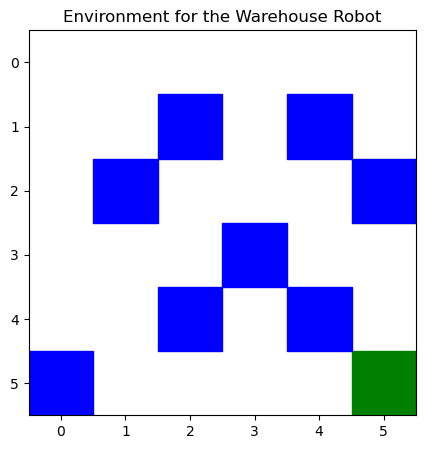

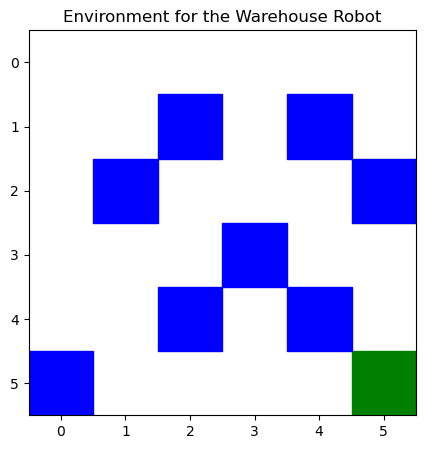

Greedy agent progress (SARSA):  10%|▊       | 1/10 [00:00<00:04,  2.09Episode/s]

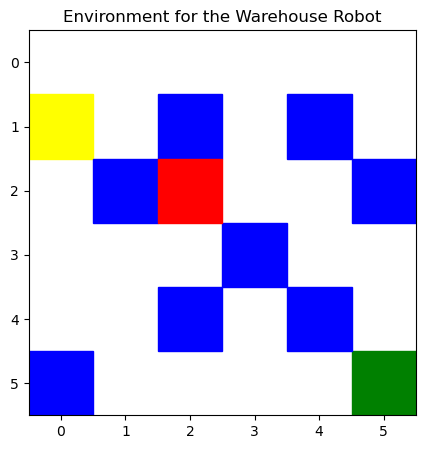

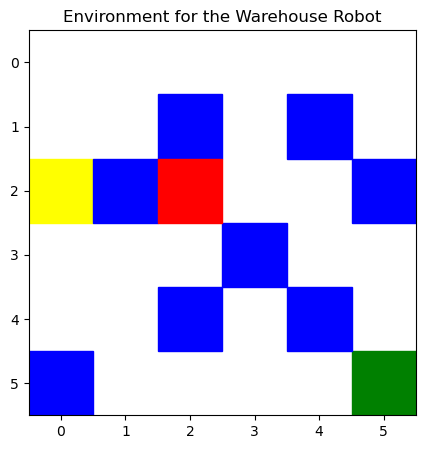

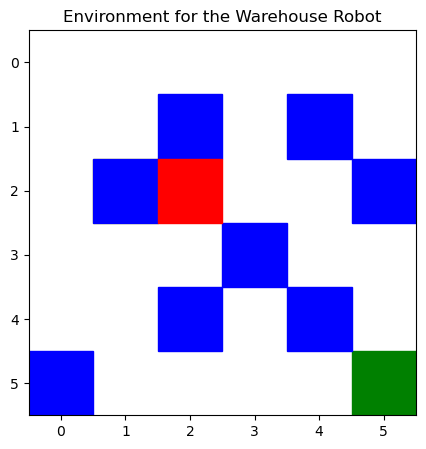

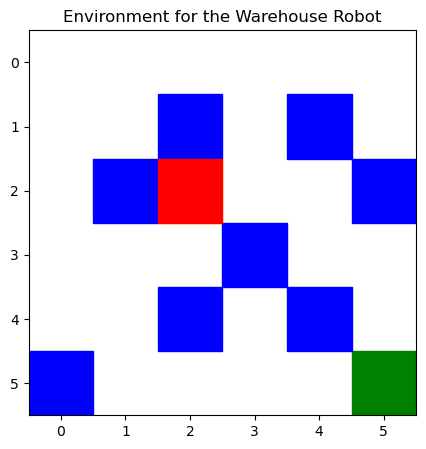

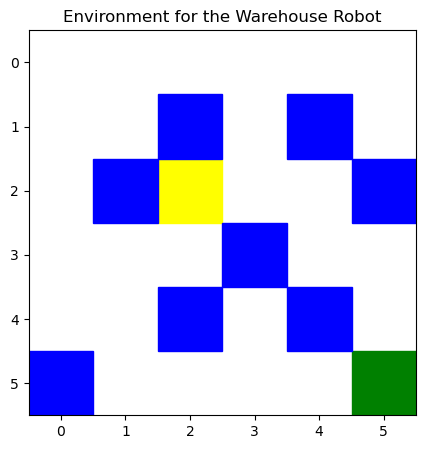

...

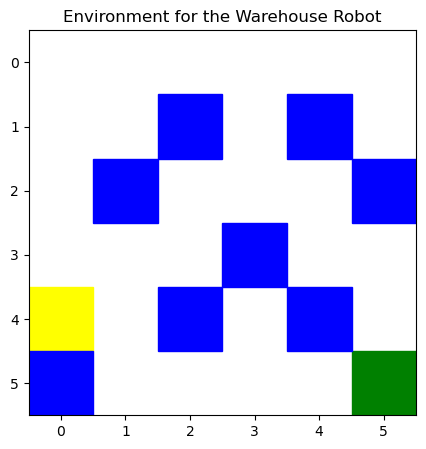

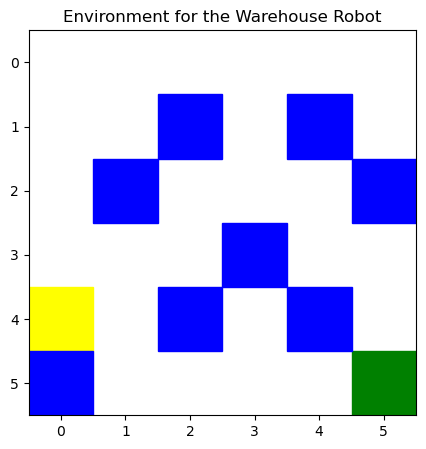

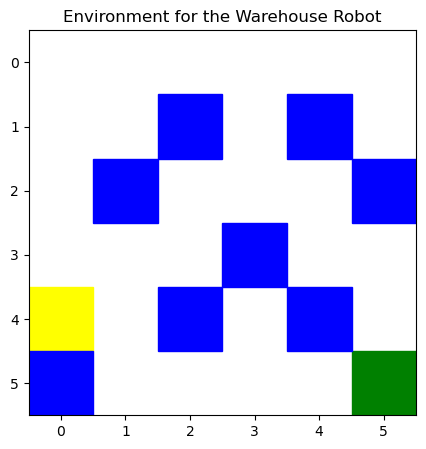

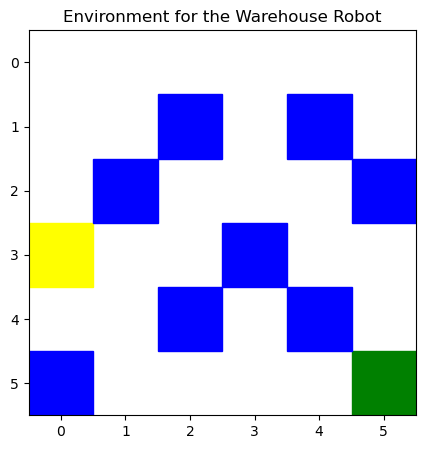

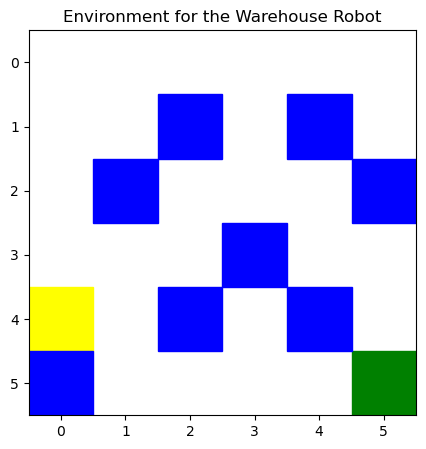

Greedy agent progress (SARSA):  20%|█▌      | 2/10 [00:00<00:03,  2.18Episode/s]

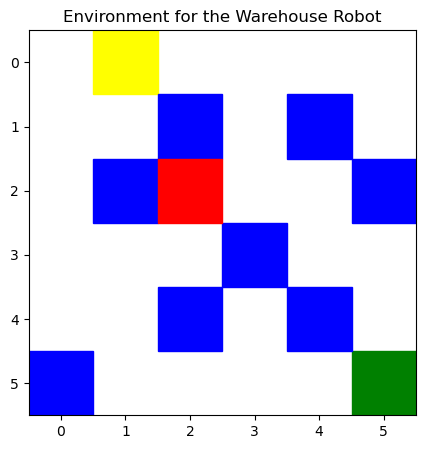

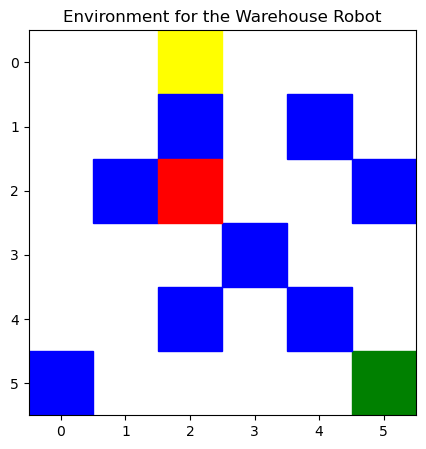

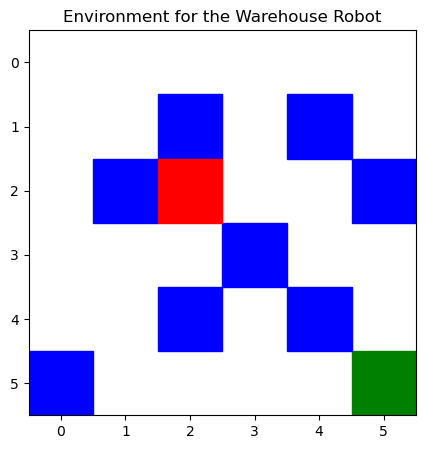

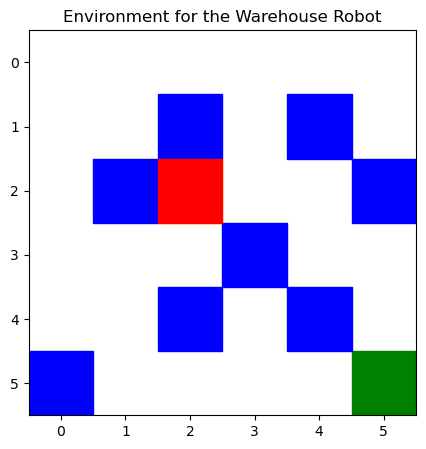

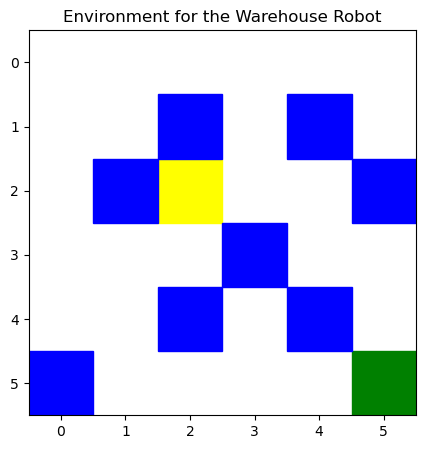

...

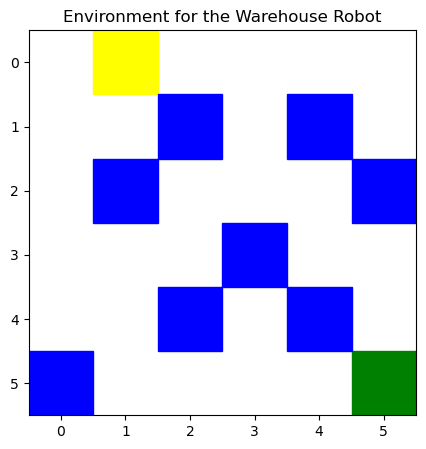

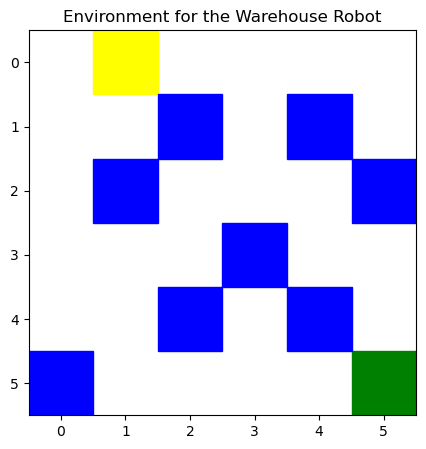

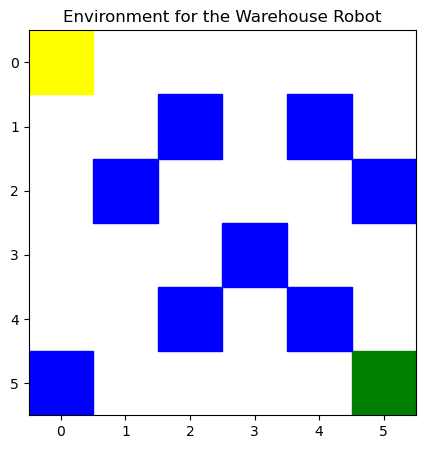

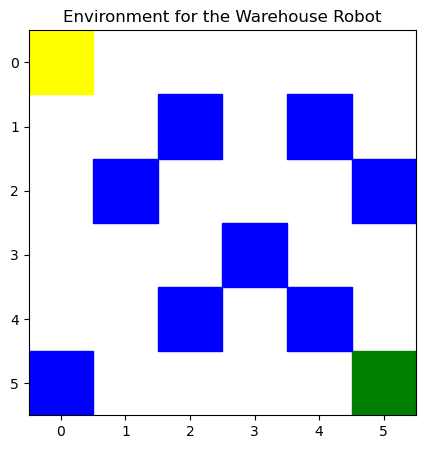

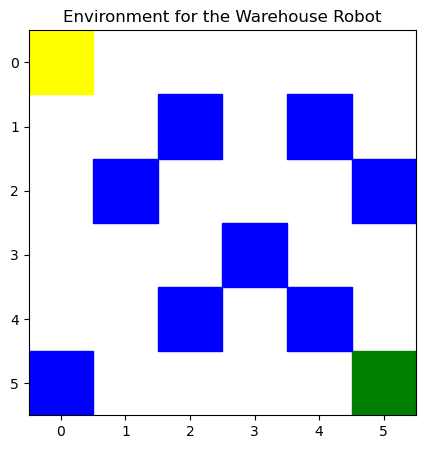

Greedy agent progress (SARSA):  30%|██▍     | 3/10 [00:01<00:03,  2.20Episode/s]

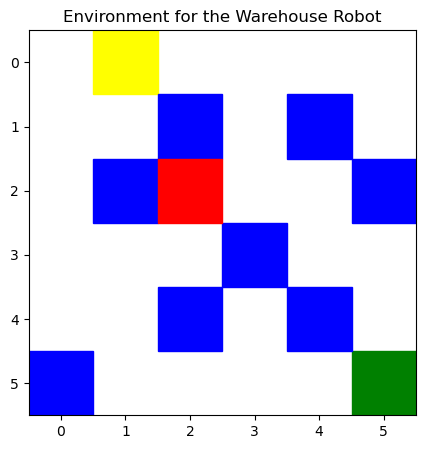

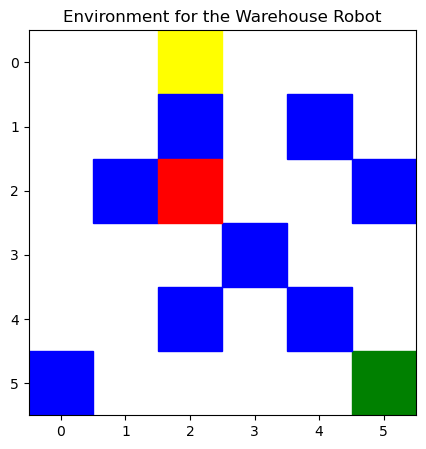

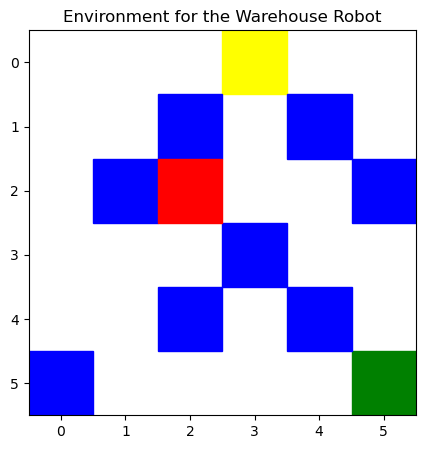

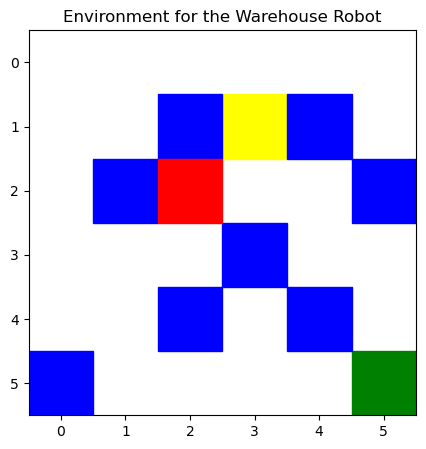

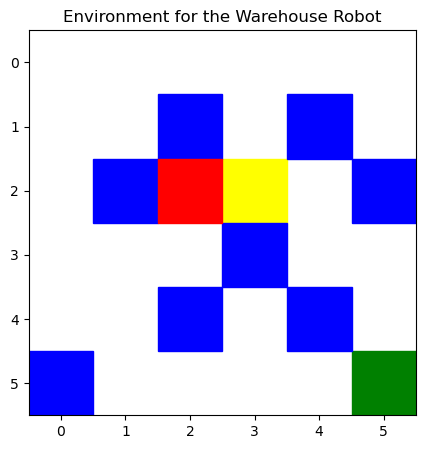

...

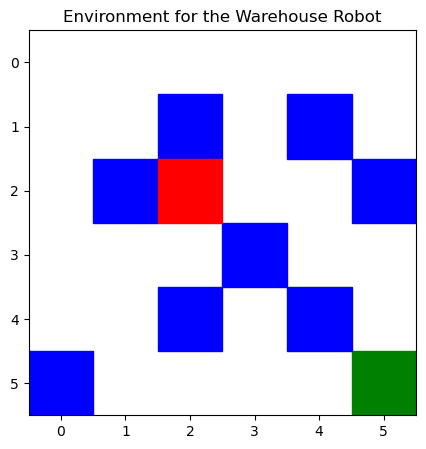

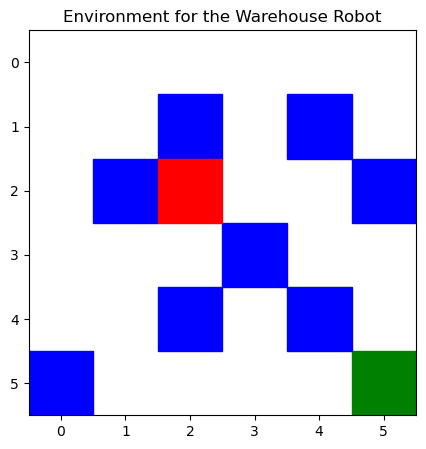

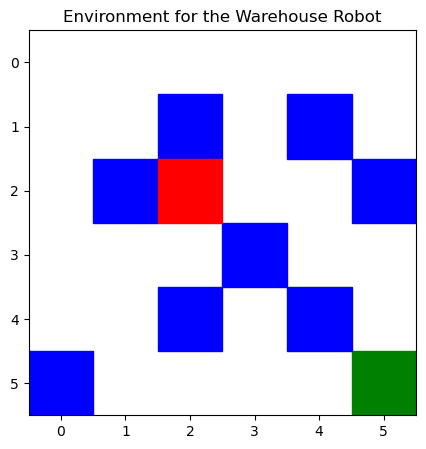

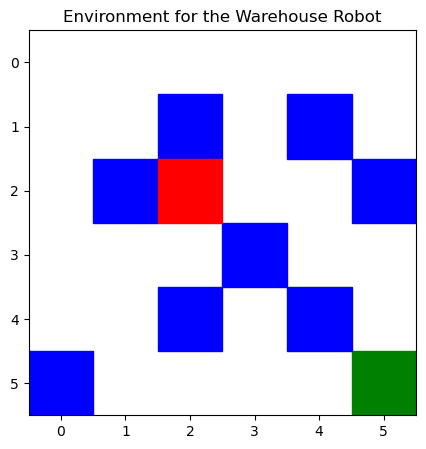

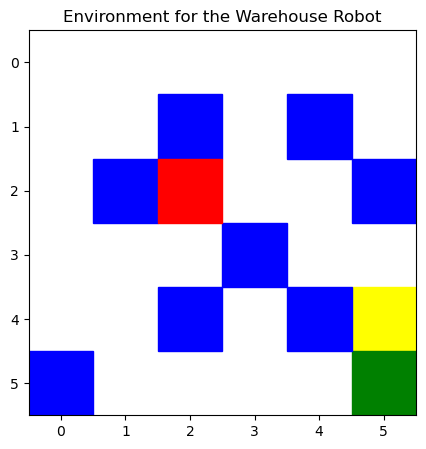

Greedy agent progress (SARSA):  40%|███▏    | 4/10 [00:01<00:02,  2.08Episode/s]

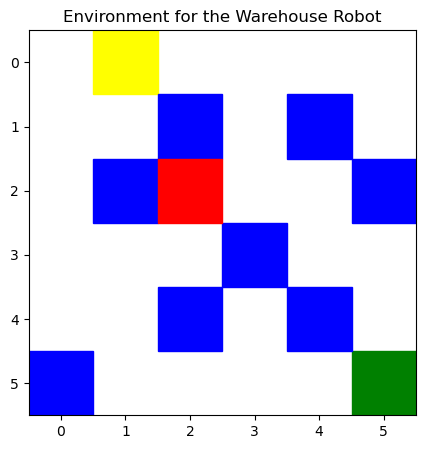

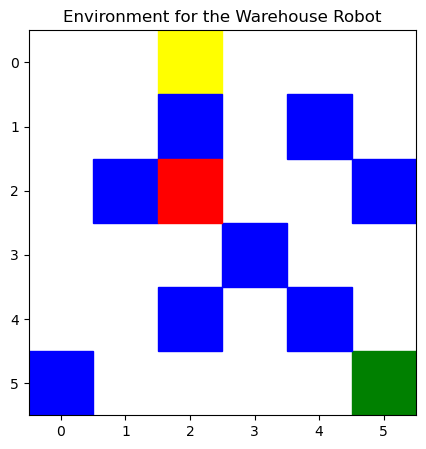

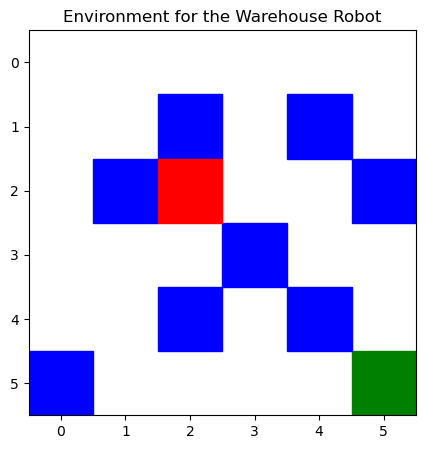

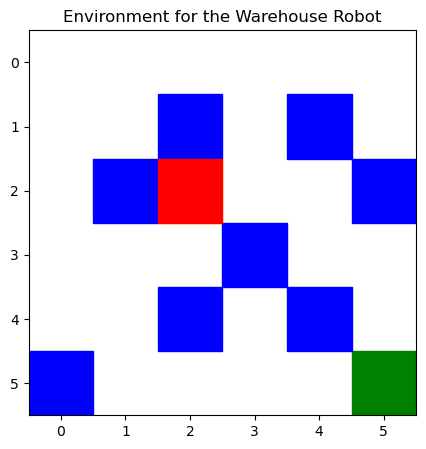

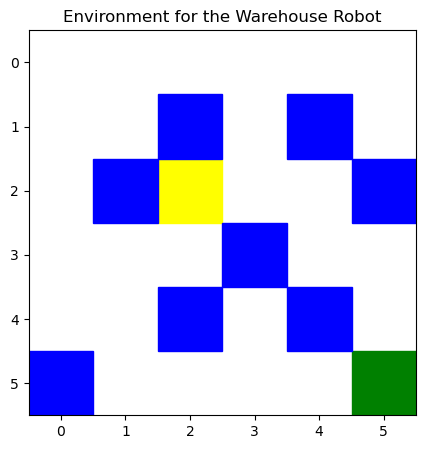

...

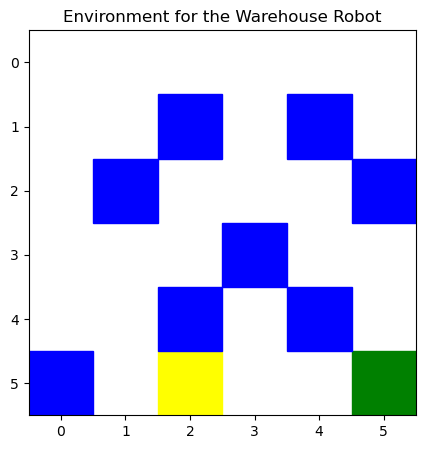

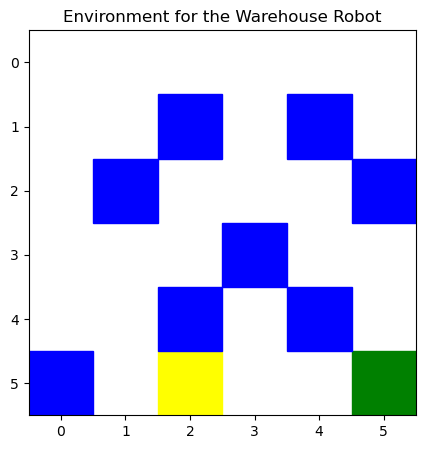

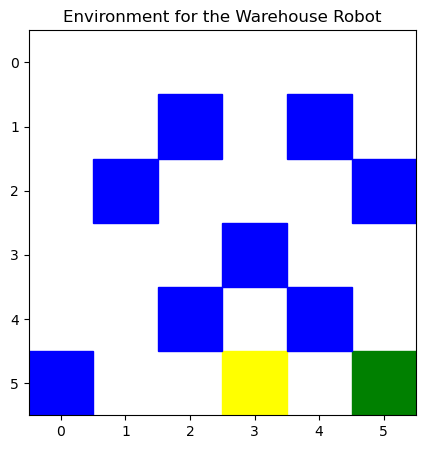

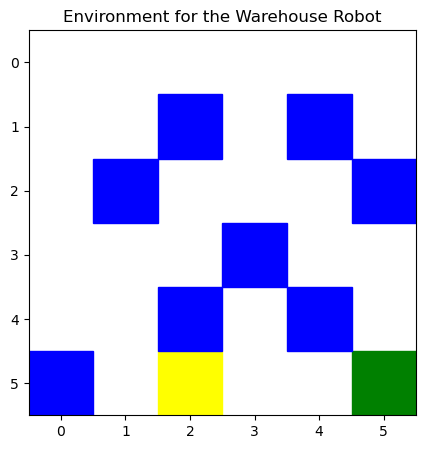

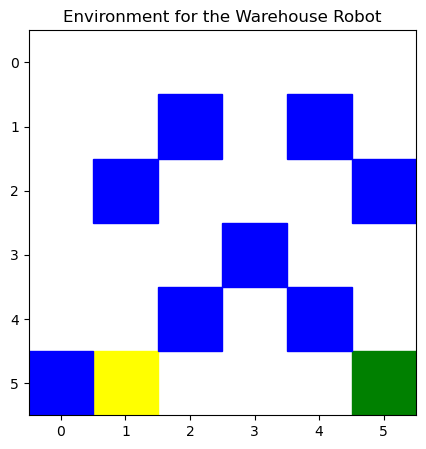

Greedy agent progress (SARSA):  50%|████    | 5/10 [00:02<00:02,  2.12Episode/s]

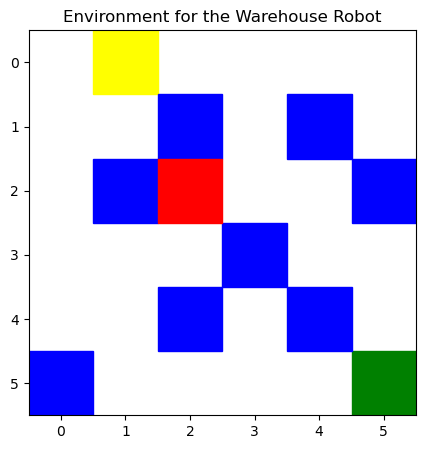

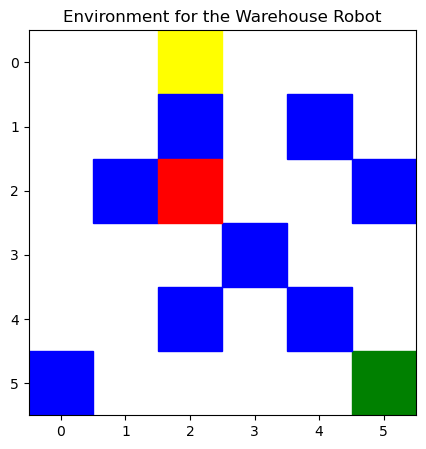

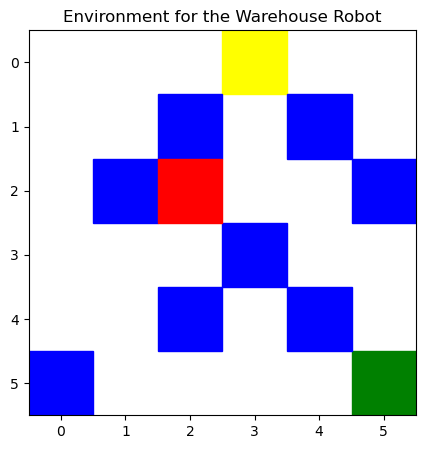

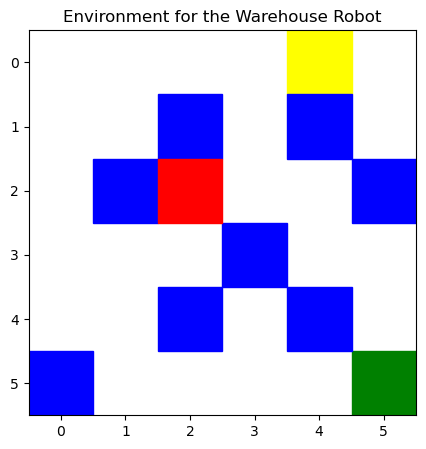

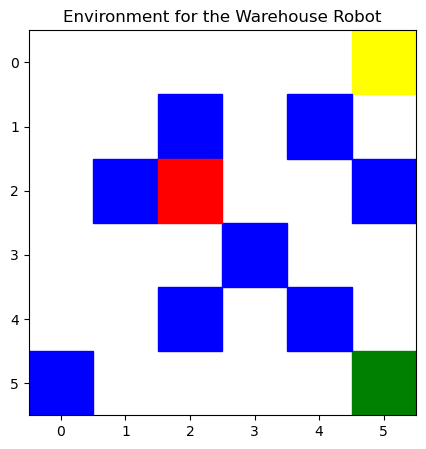

...

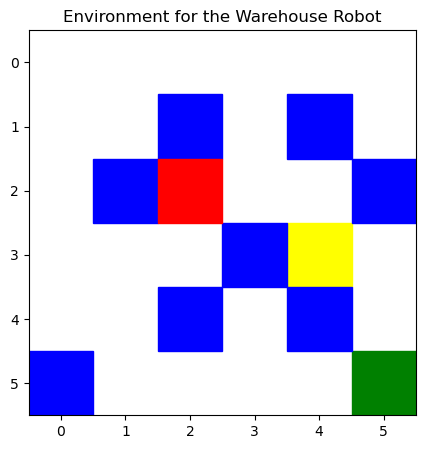

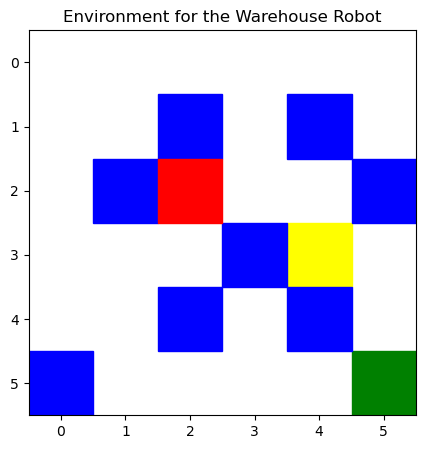

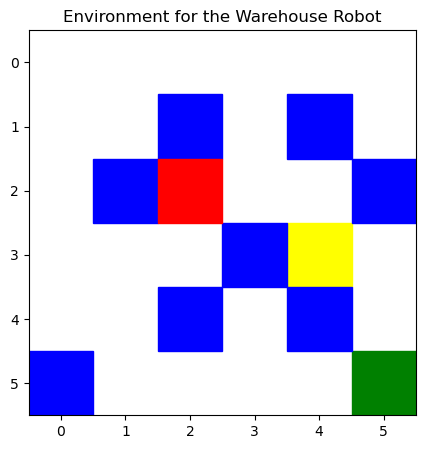

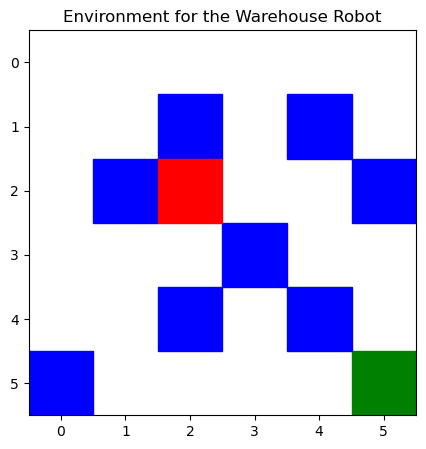

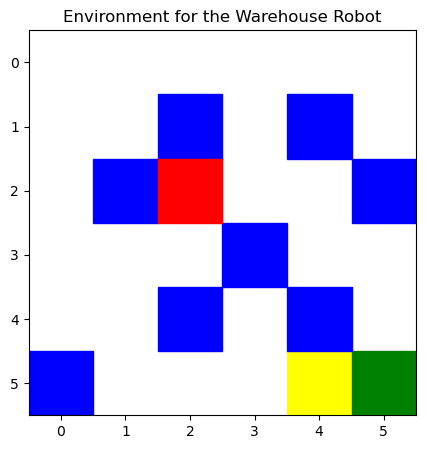

Greedy agent progress (SARSA):  60%|████▊   | 6/10 [00:02<00:01,  2.14Episode/s]

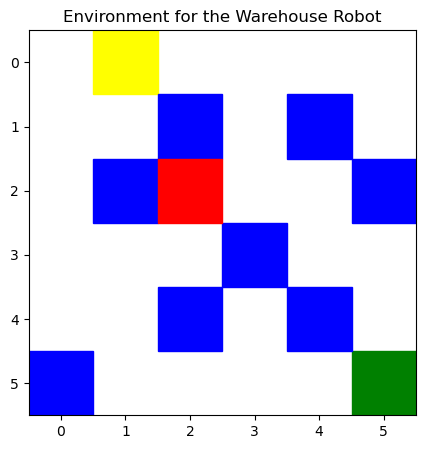

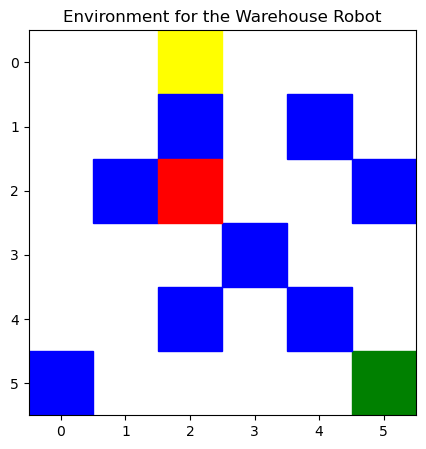

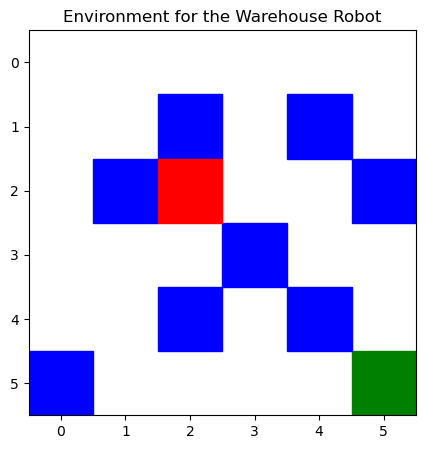

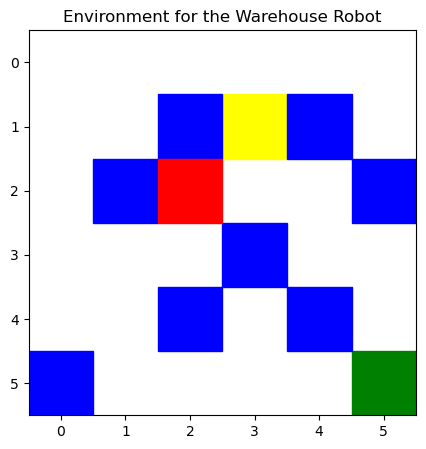

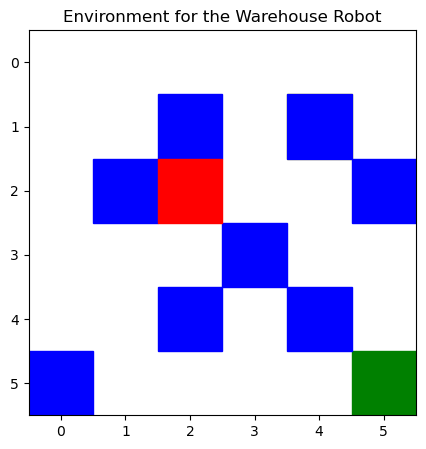

...

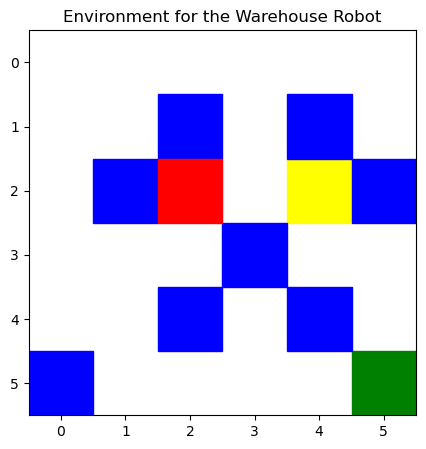

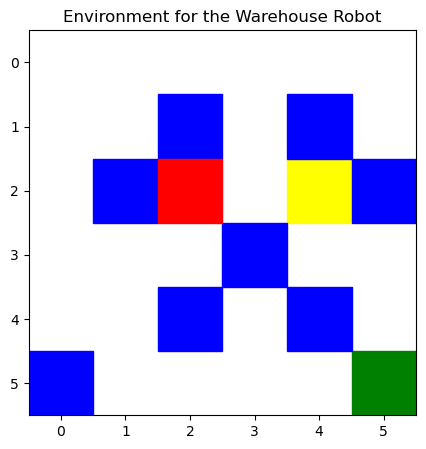

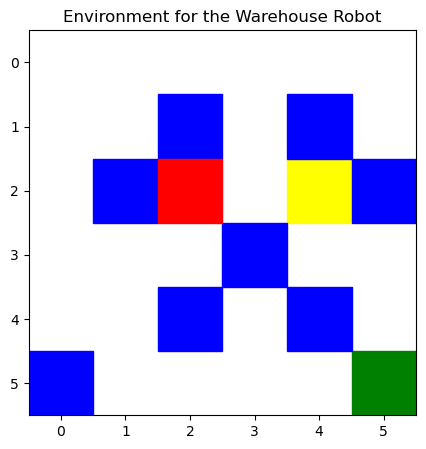

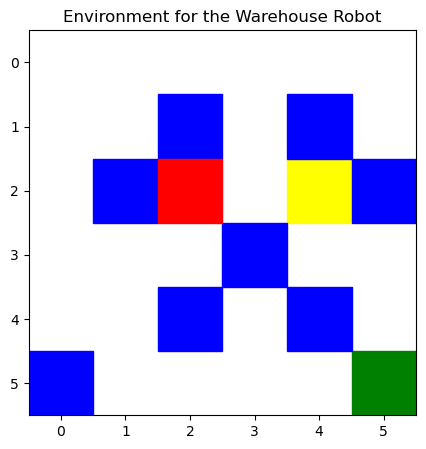

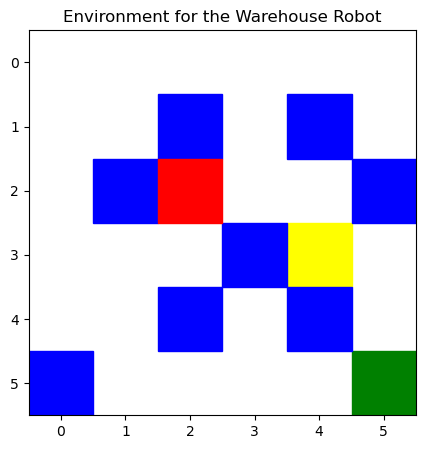

Greedy agent progress (SARSA):  70%|█████▌  | 7/10 [00:03<00:01,  2.15Episode/s]

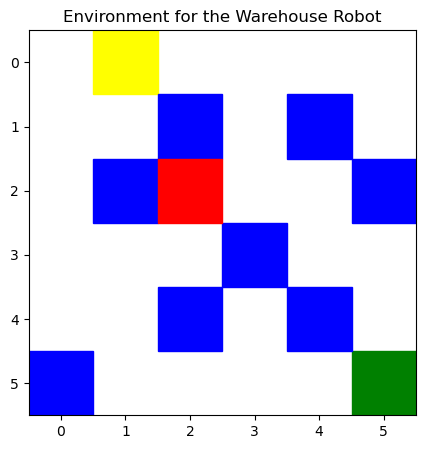

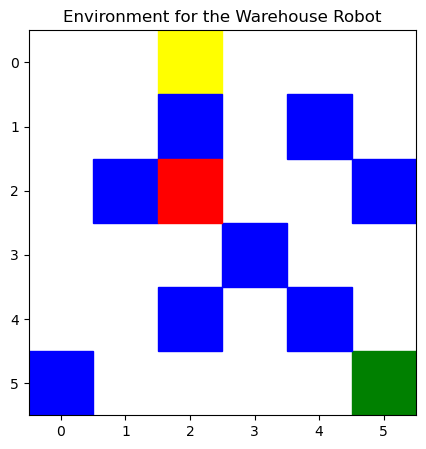

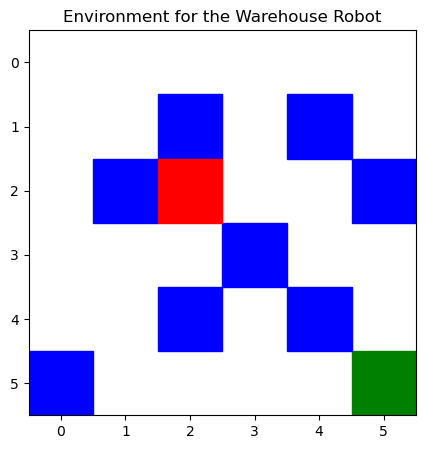

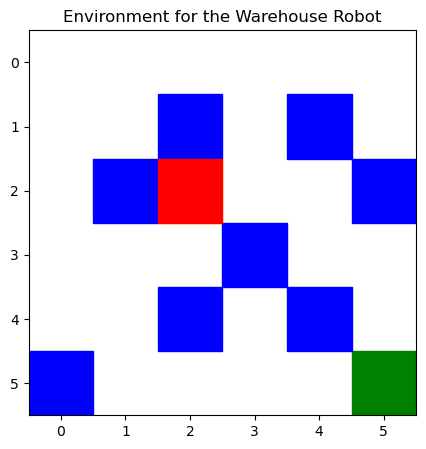

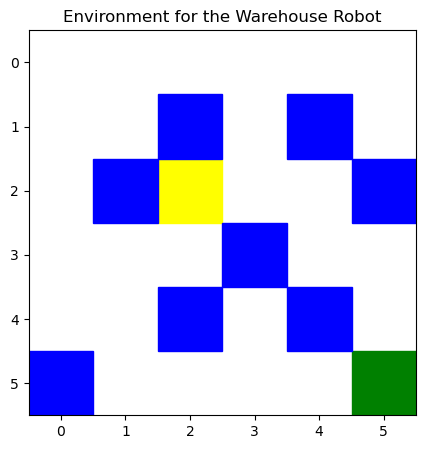

...

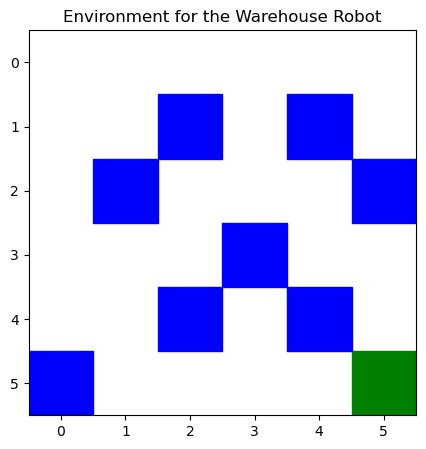

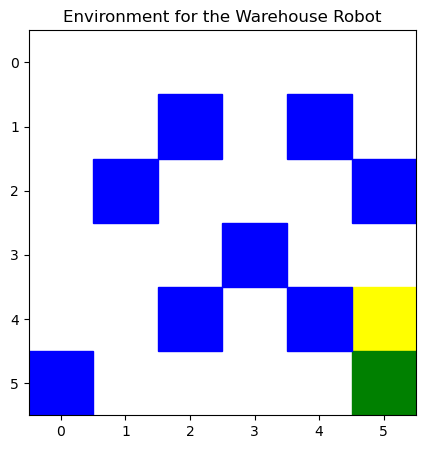

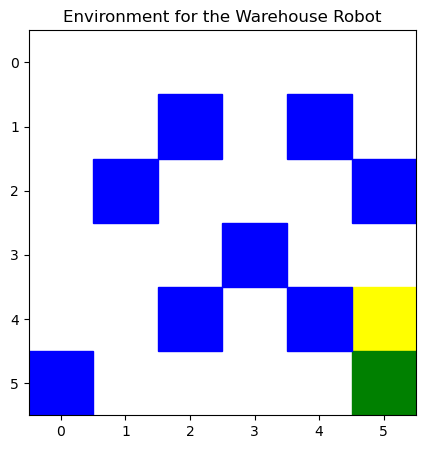

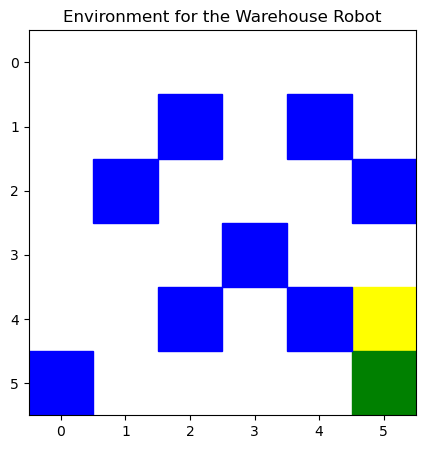

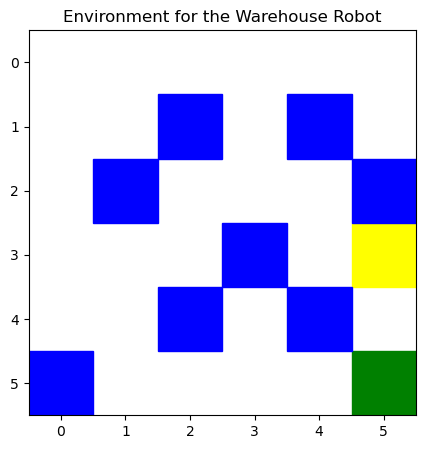

Greedy agent progress (SARSA):  80%|██████▍ | 8/10 [00:03<00:00,  2.08Episode/s]

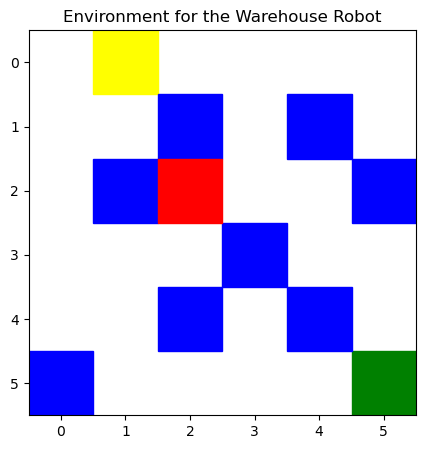

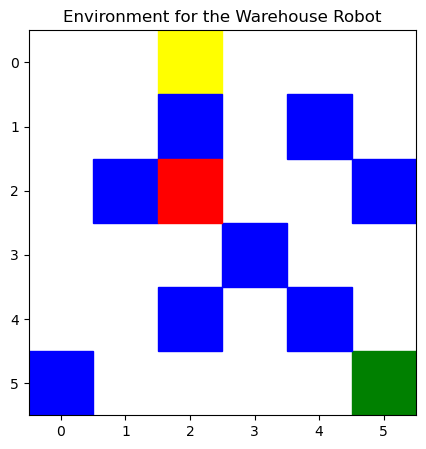

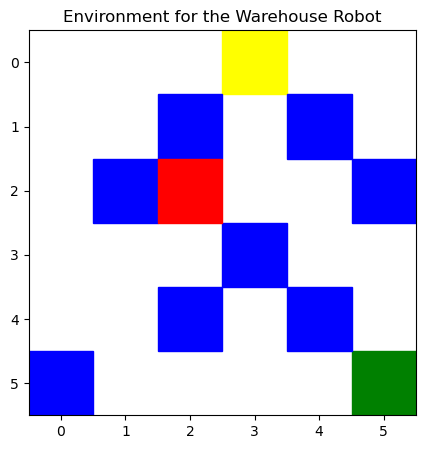

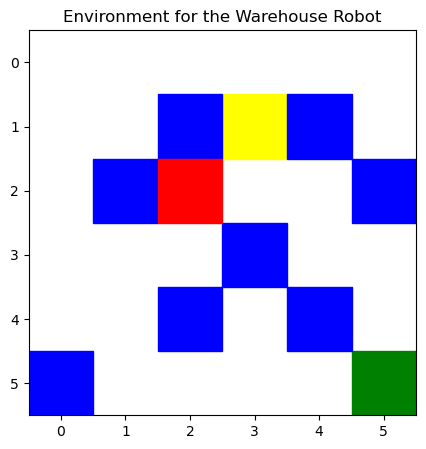

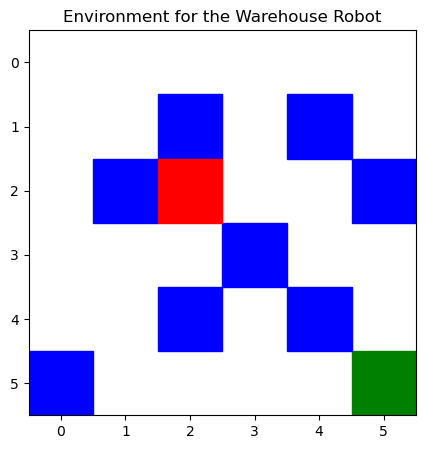

...

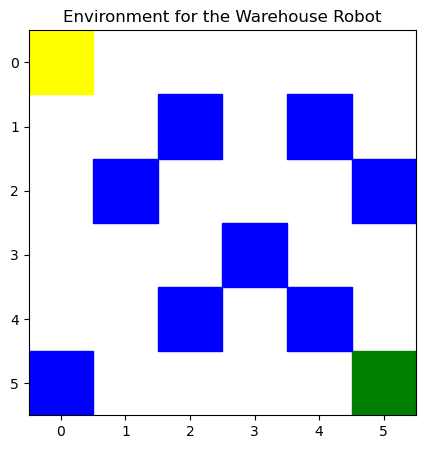

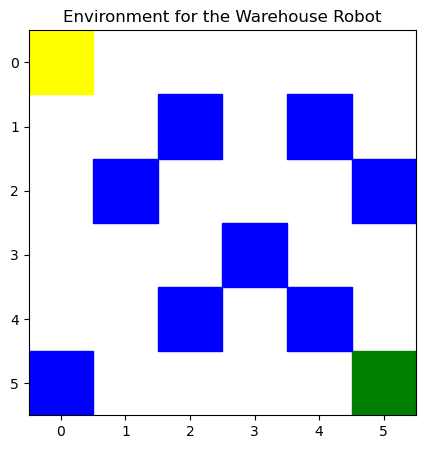

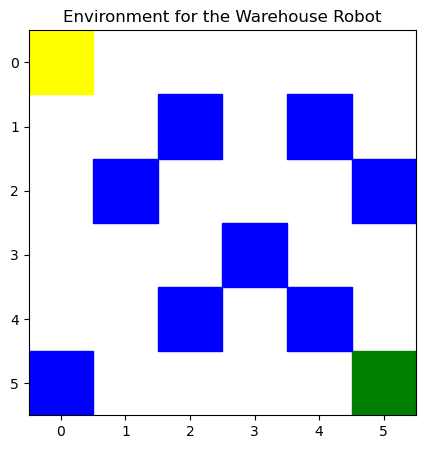

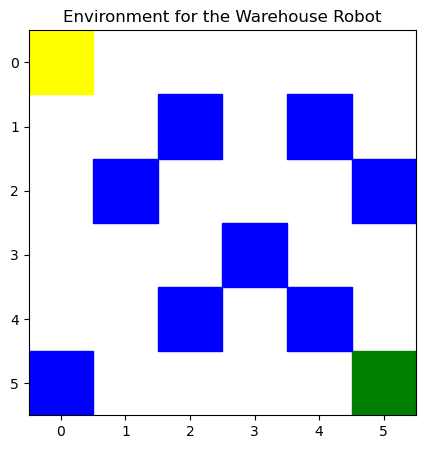

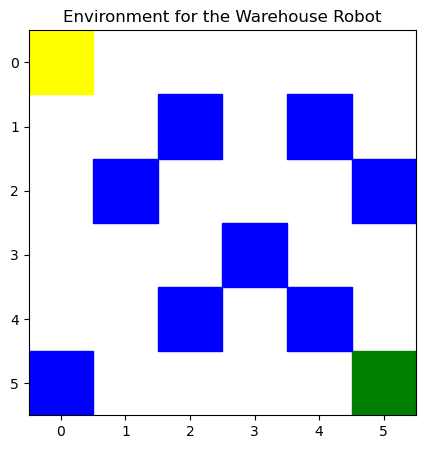

Greedy agent progress (SARSA):  90%|███████▏| 9/10 [00:04<00:00,  2.09Episode/s]

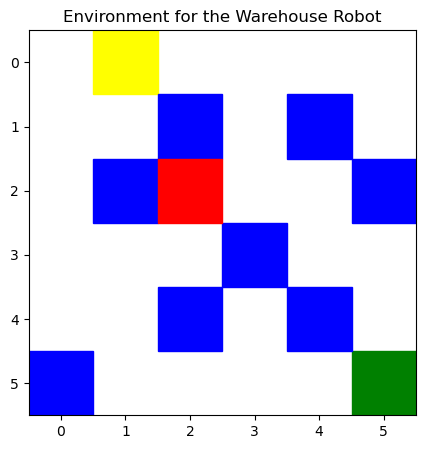

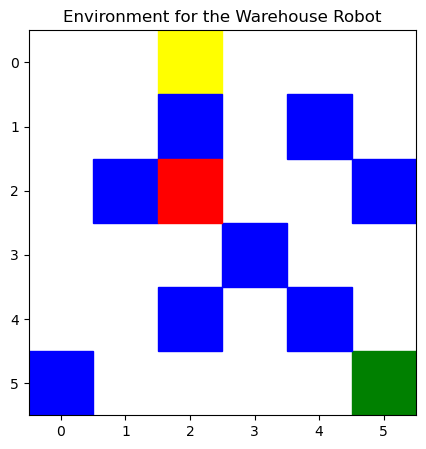

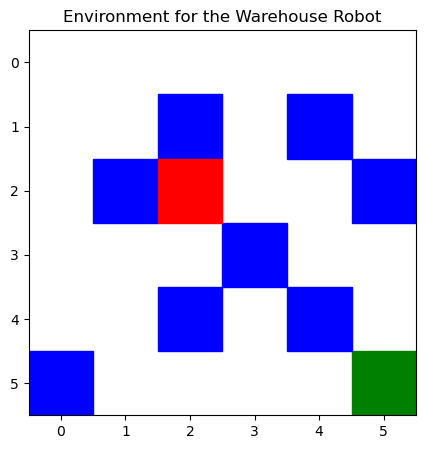

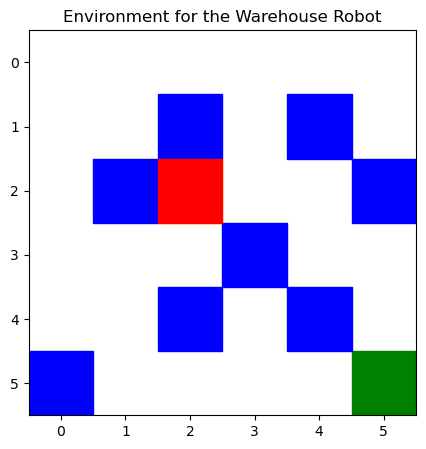

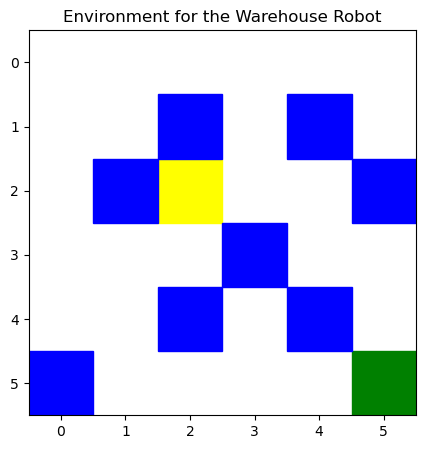

...

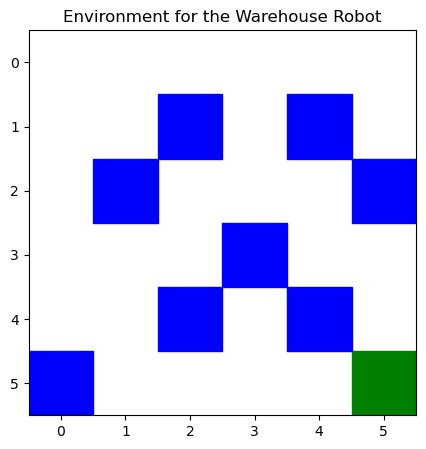

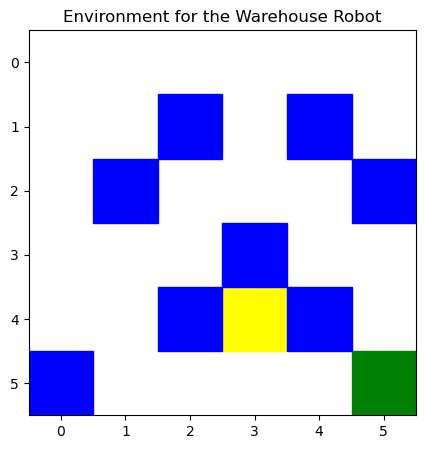

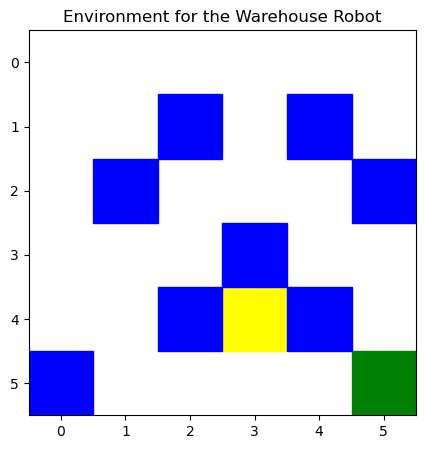

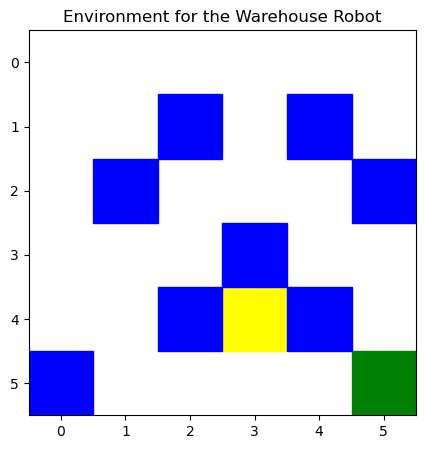

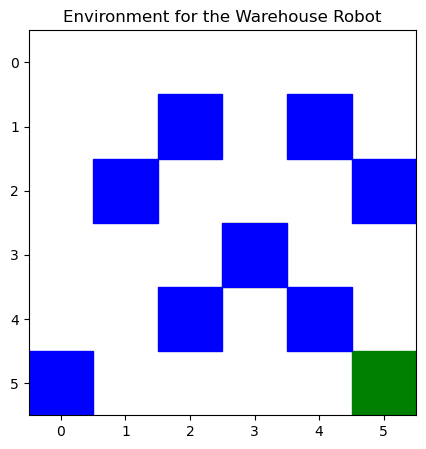

Greedy agent progress (SARSA): 100%|███████| 10/10 [00:04<00:00,  2.12Episode/s]


Total Rewards per Episode (SARSA): {0: -300, 1: -300, 2: -300, 3: -300, 4: -300, 5: -300, 6: -300, 7: -300, 8: -300, 9: -300}
Average Rewards per Episode (SARSA): -300.0


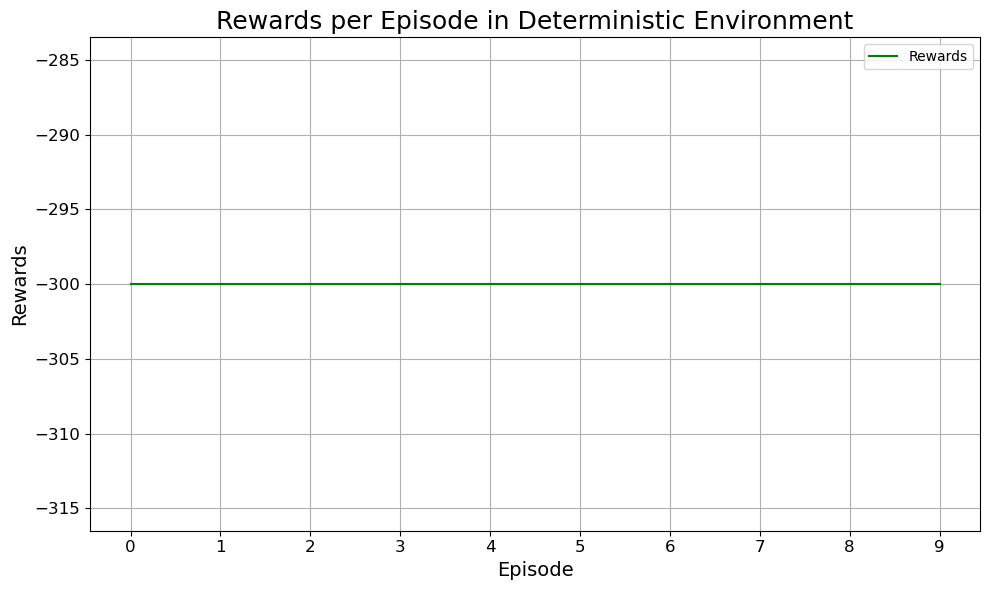

In [156]:
# Training session for the SARSA agent
rewards, avg_rewards, epsilon_values, trained_agent_sarsa = episode_trainer_sarsa(
    environment_type='Deterministic', 
    episodes=1000, 
    steps=15, 
    discount_rate=0.99, 
    learning_rate=0.1
)

avg_ep_rewards, greedy_rwd_per_ep = greedy_agent_SARSA(trained_agent_sarsa, env, 10)
rewards_per_episode_plot(greedy_rwd_per_ep, 'Deterministic')


# Greedy Action for Stochastic Env.

Training progress: 100%|█████████████| 1000/1000 [00:00<00:00, 4207.39Episode/s]


Average Rewards over all Episodes: -299.88
Environment type: Deterministic


Greedy agent progress (SARSA):   0%|                | 0/10 [00:00<?, ?Episode/s]

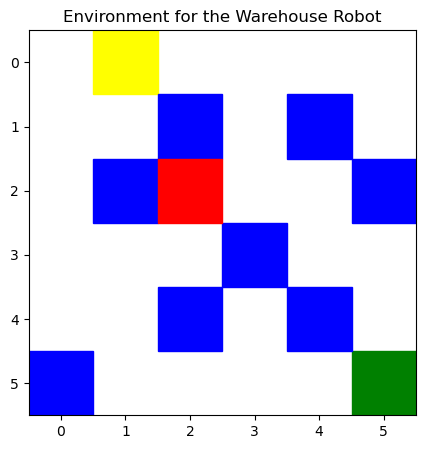

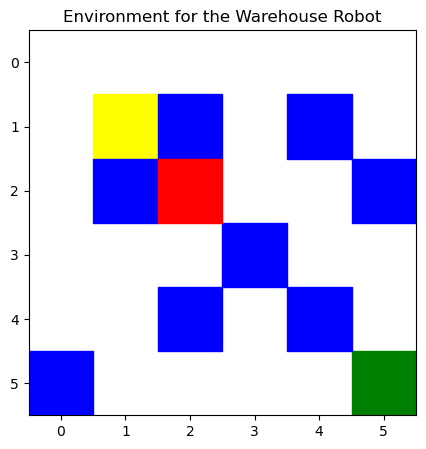

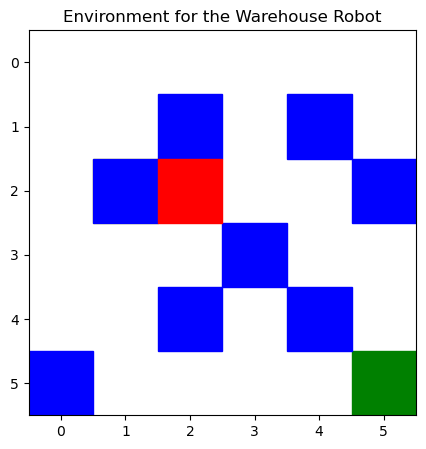

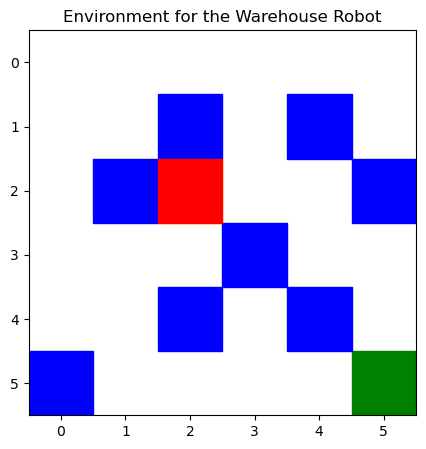

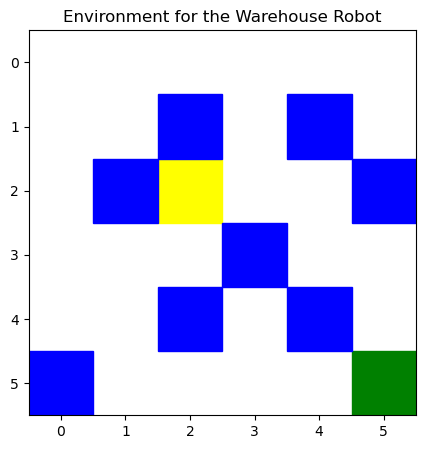

...

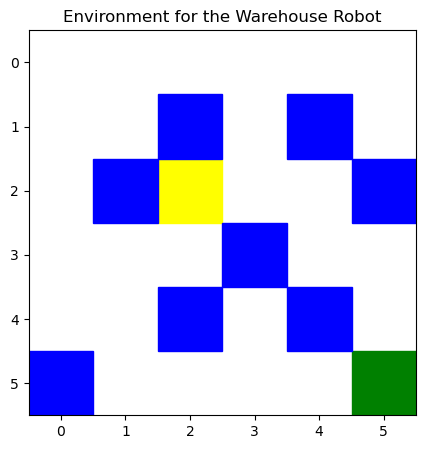

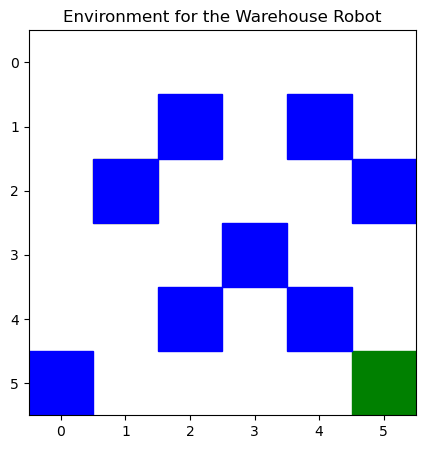

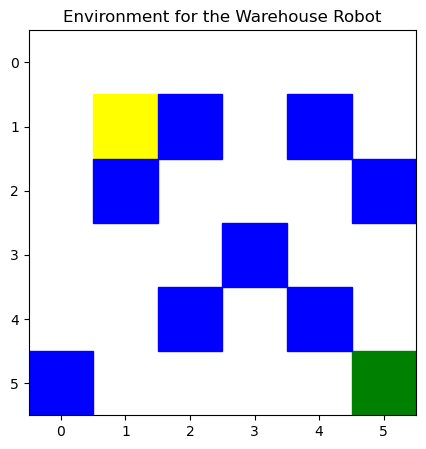

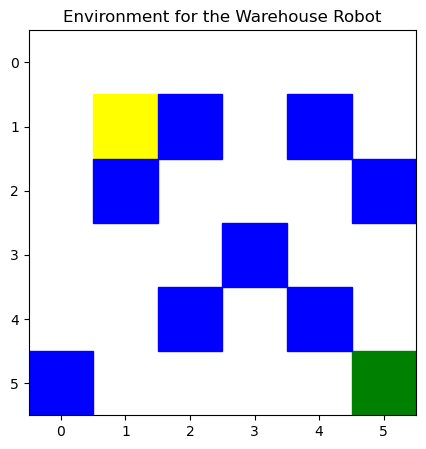

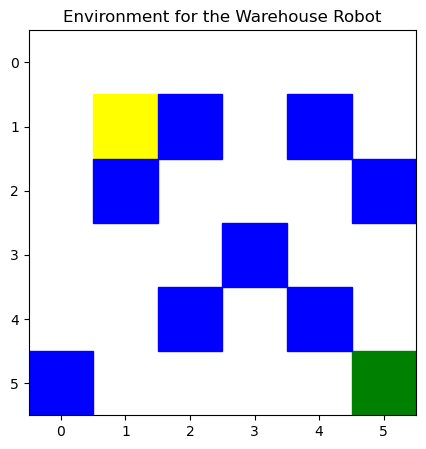

Greedy agent progress (SARSA):  10%|▊       | 1/10 [00:00<00:05,  1.77Episode/s]

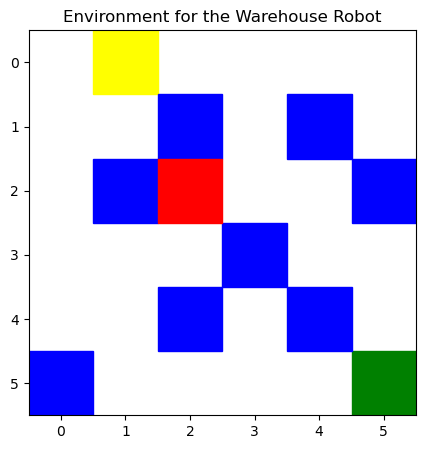

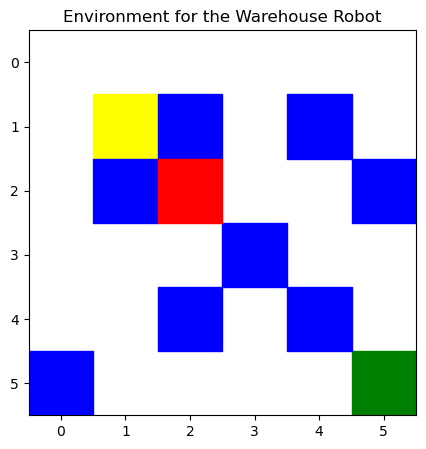

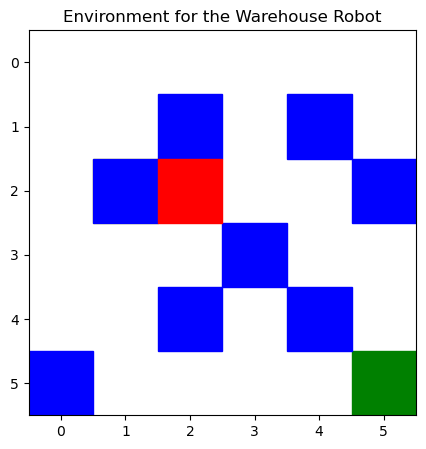

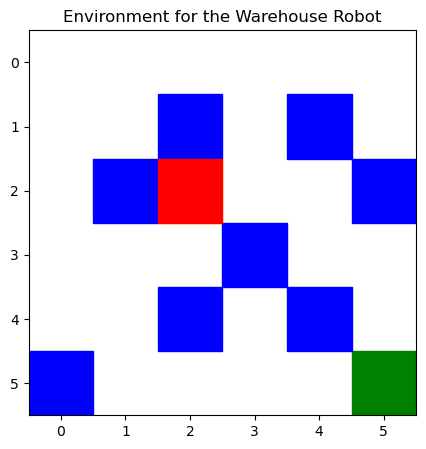

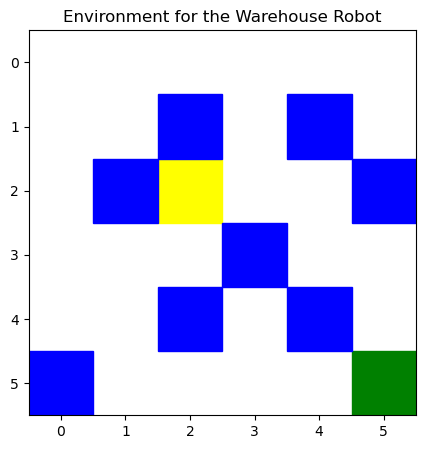

...

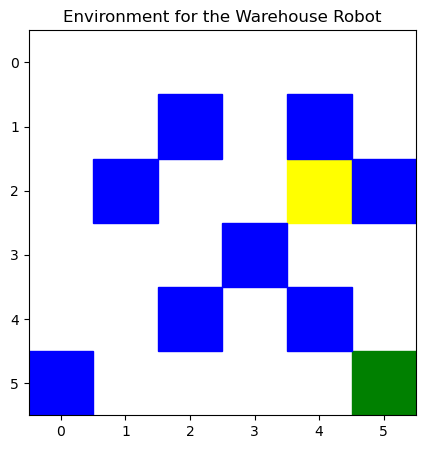

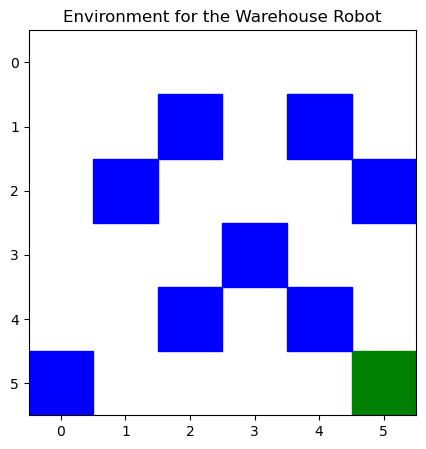

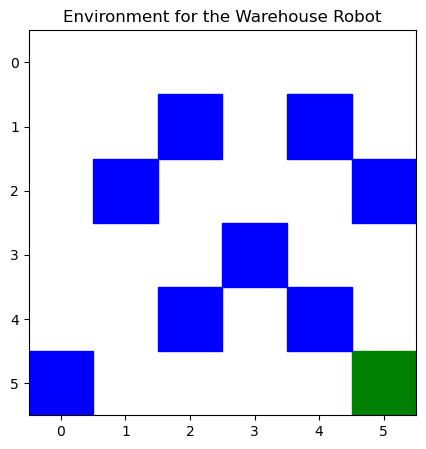

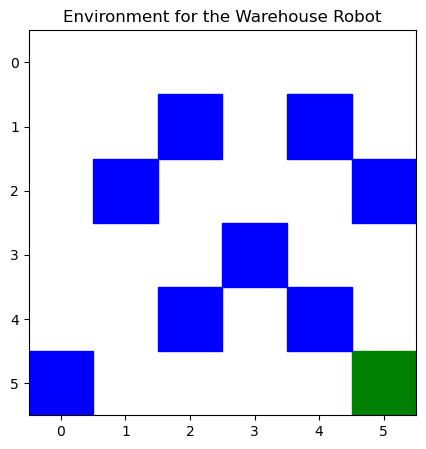

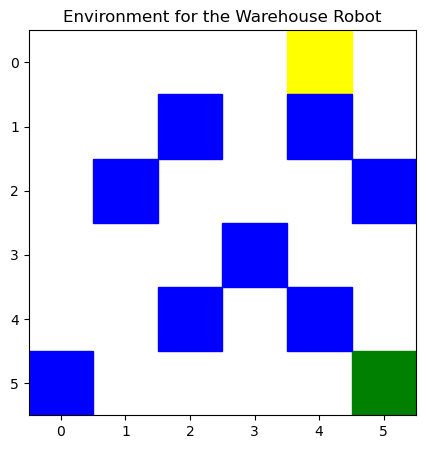

Greedy agent progress (SARSA):  20%|█▌      | 2/10 [00:01<00:04,  1.99Episode/s]

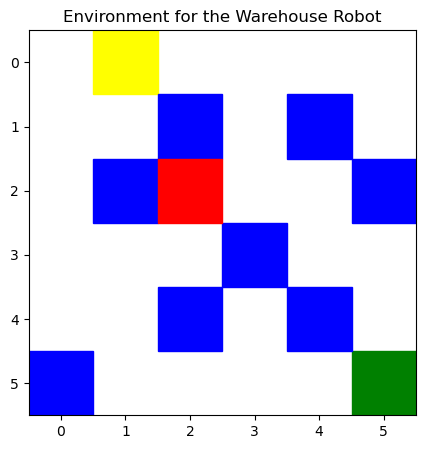

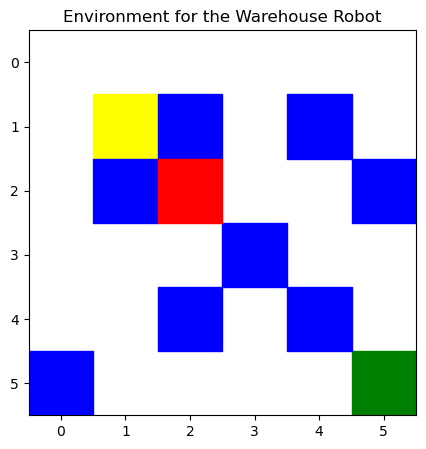

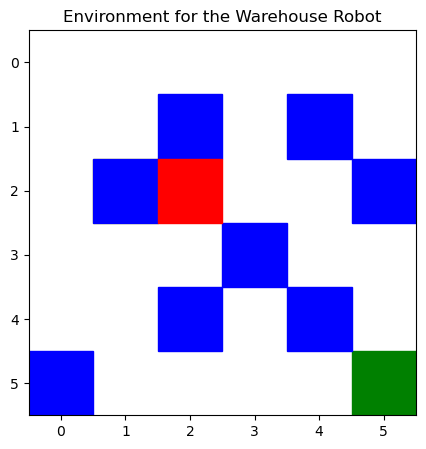

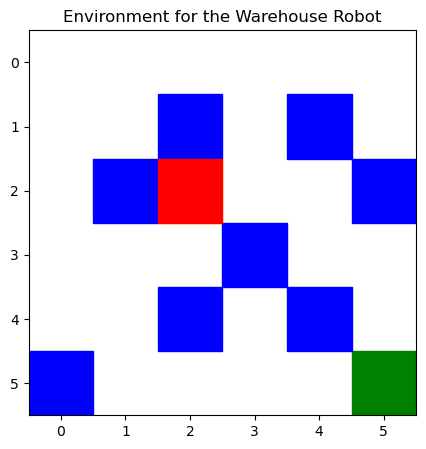

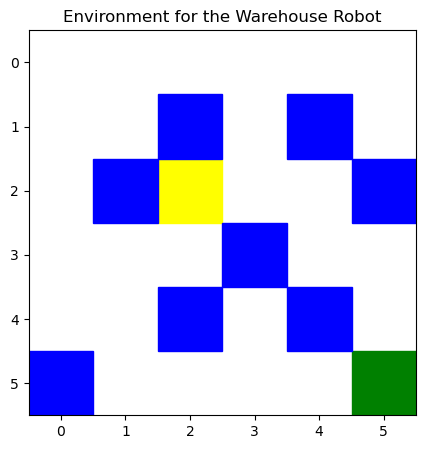

...

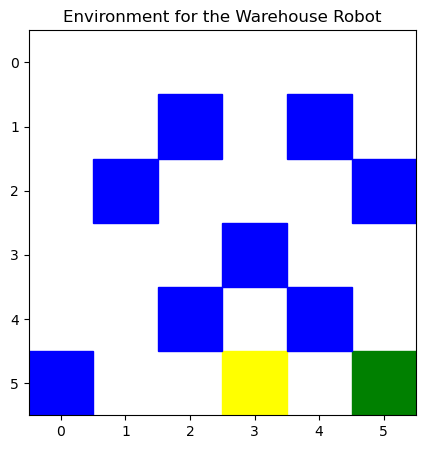

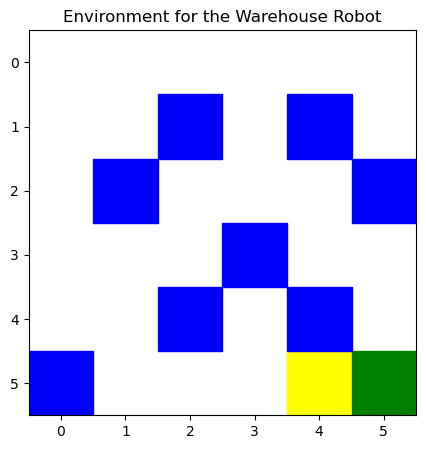

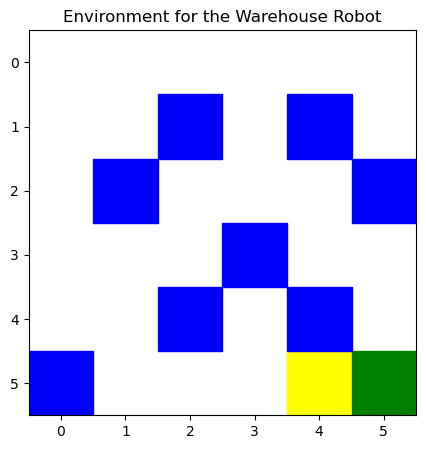

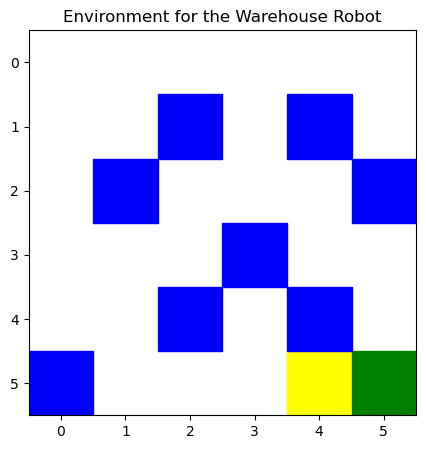

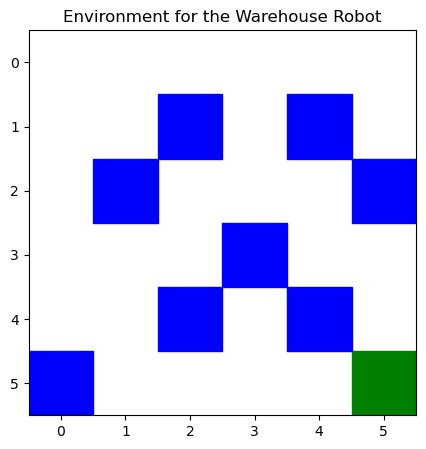

Greedy agent progress (SARSA):  30%|██▍     | 3/10 [00:01<00:03,  2.06Episode/s]

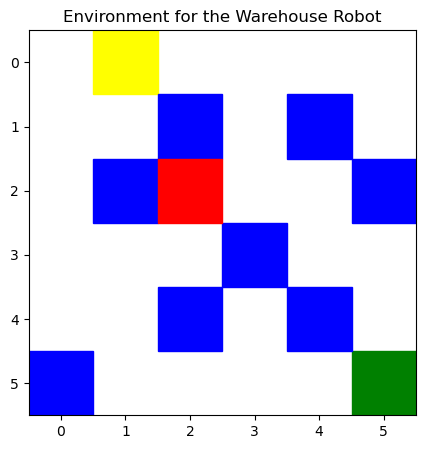

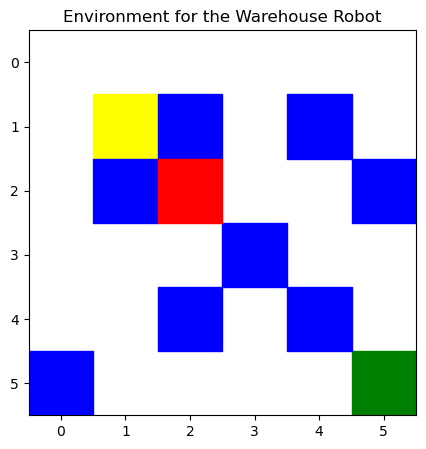

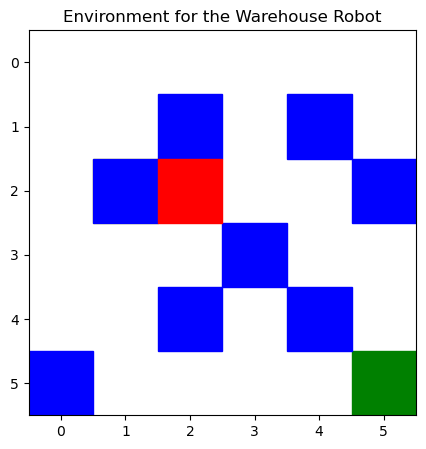

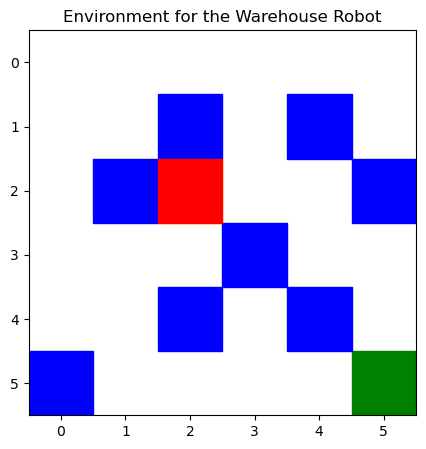

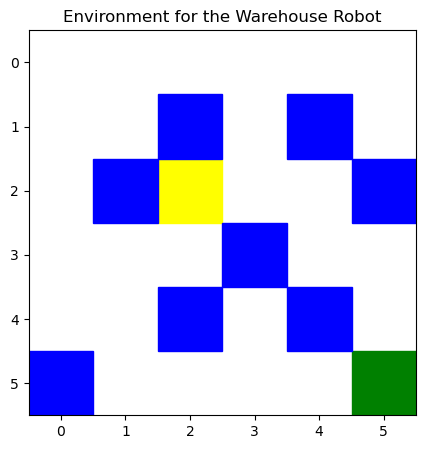

...

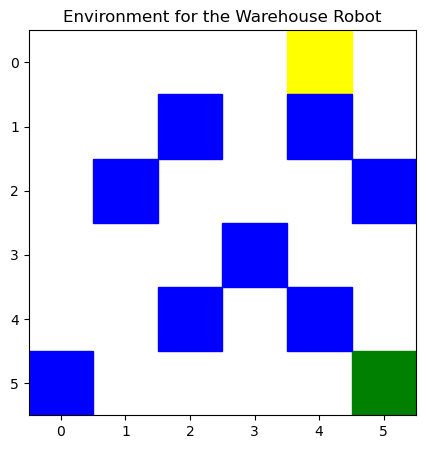

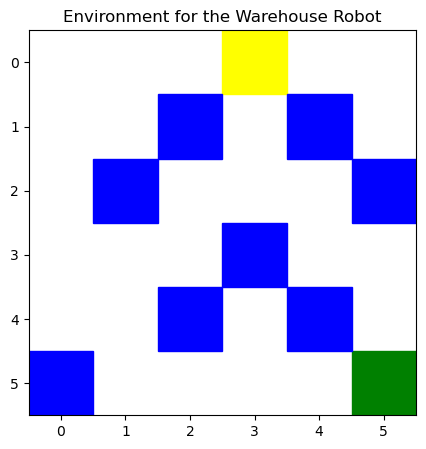

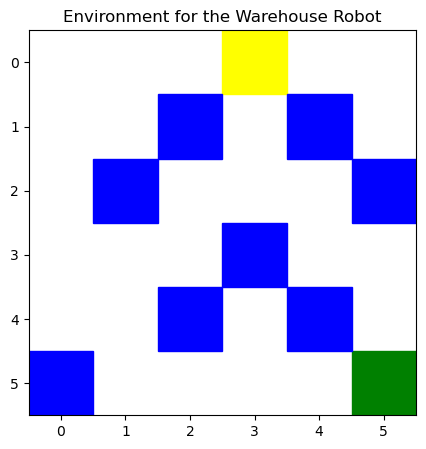

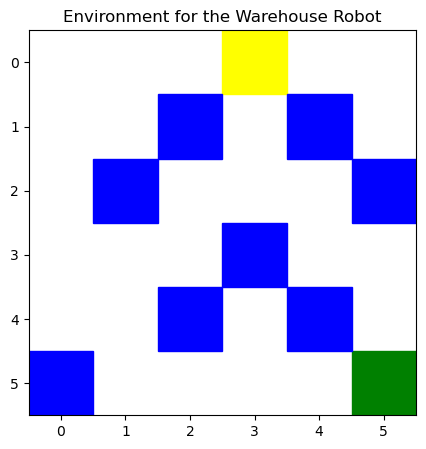

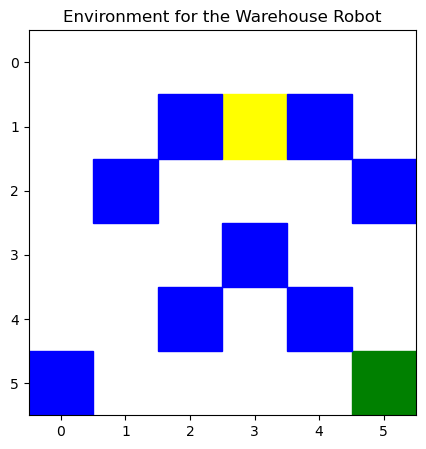

Greedy agent progress (SARSA):  40%|███▏    | 4/10 [00:01<00:02,  2.11Episode/s]

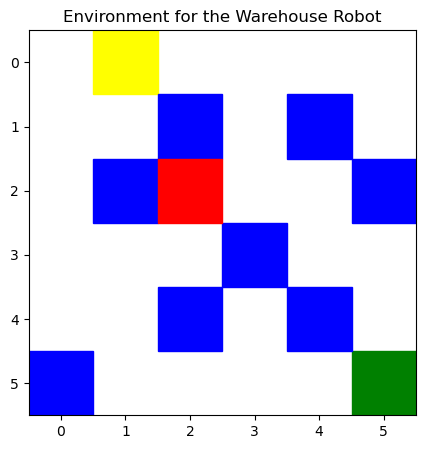

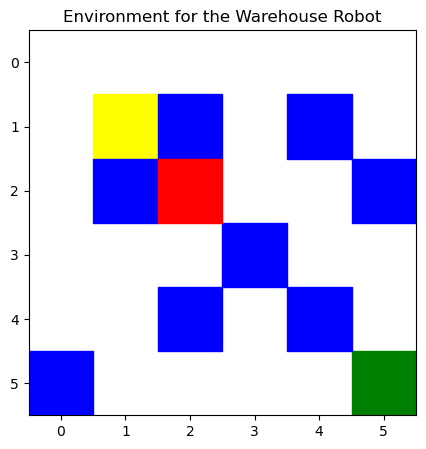

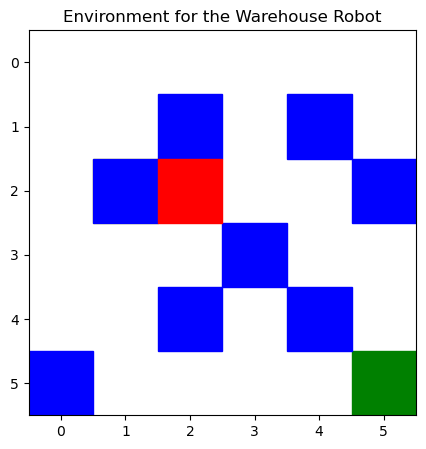

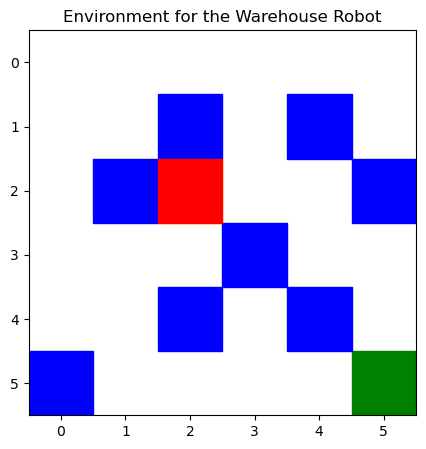

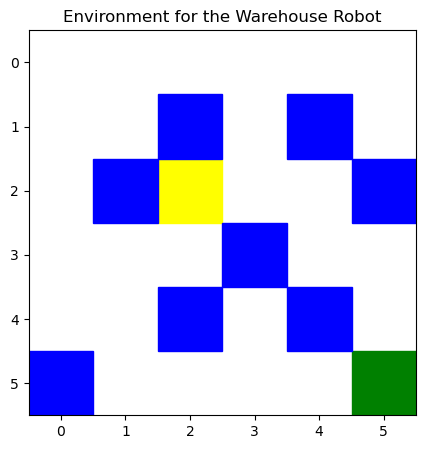

...

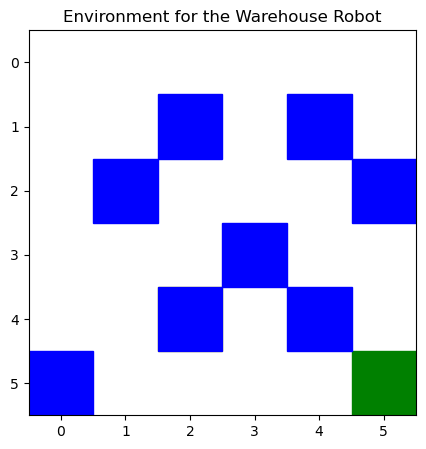

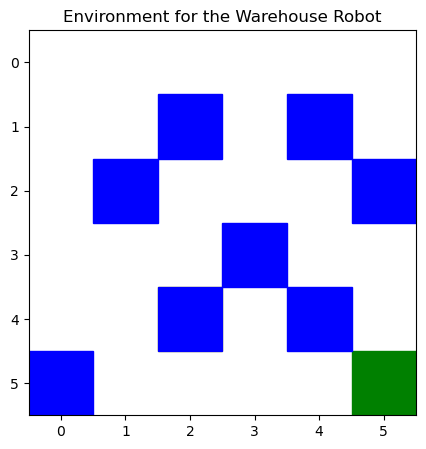

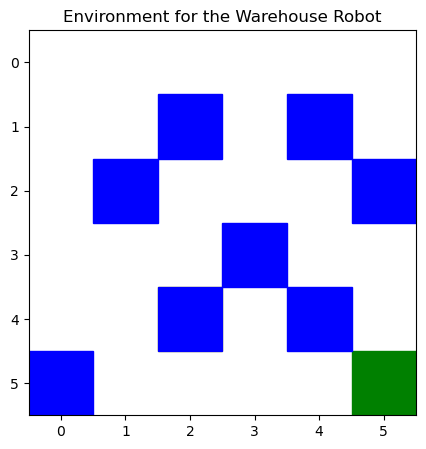

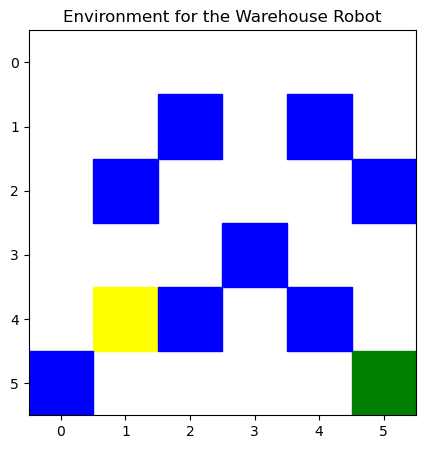

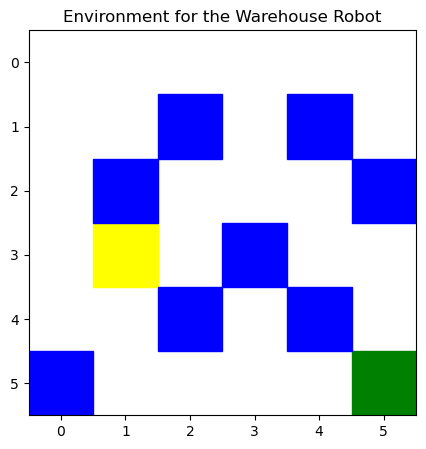

Greedy agent progress (SARSA):  50%|████    | 5/10 [00:02<00:02,  2.04Episode/s]

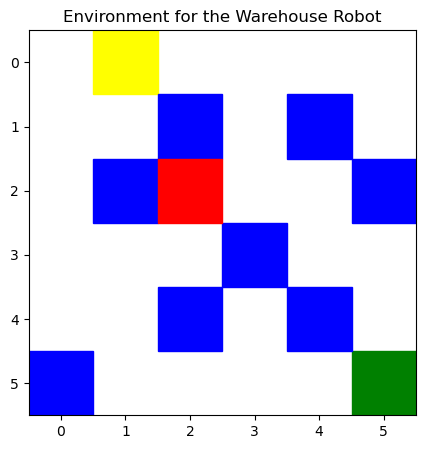

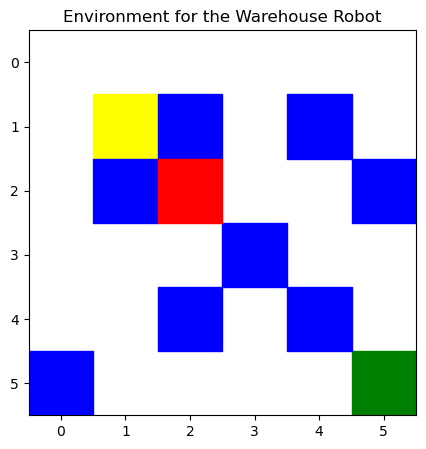

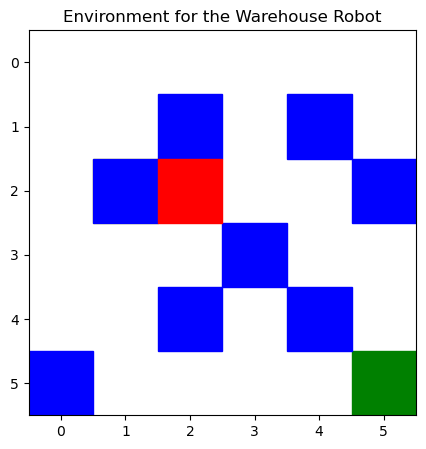

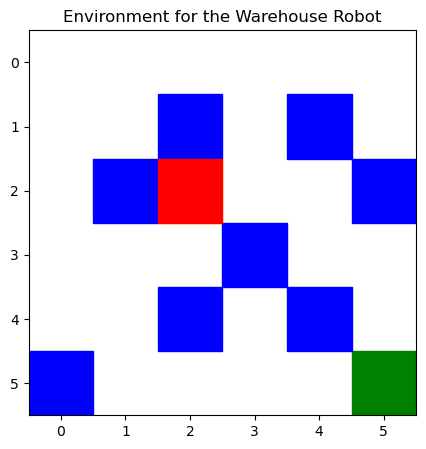

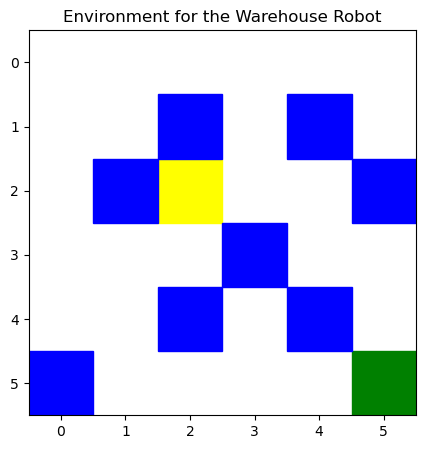

...

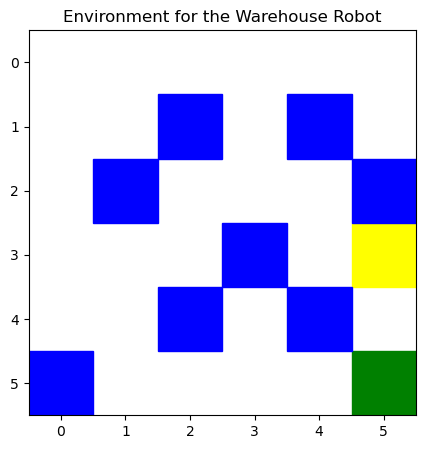

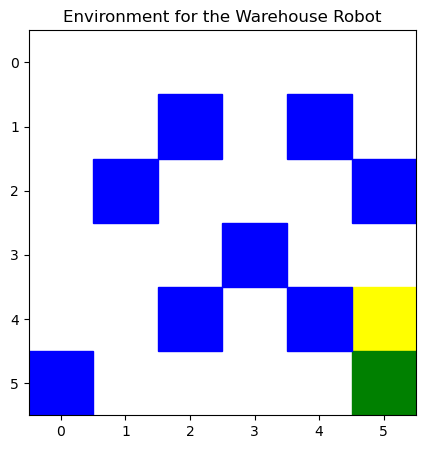

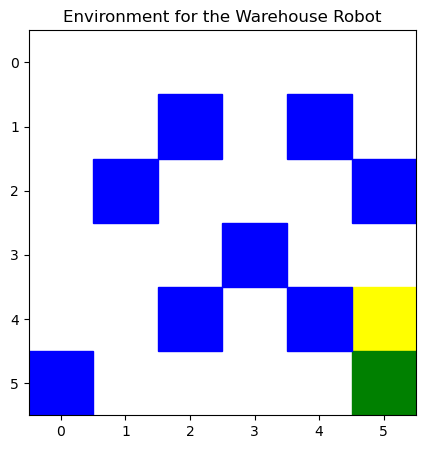

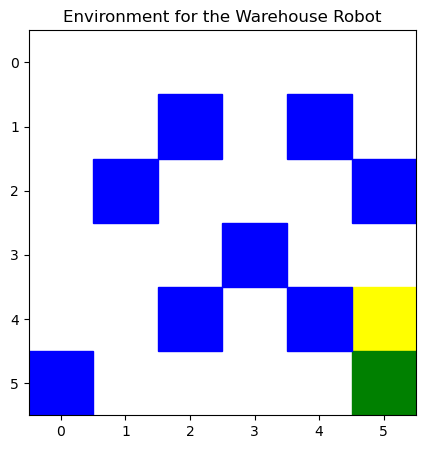

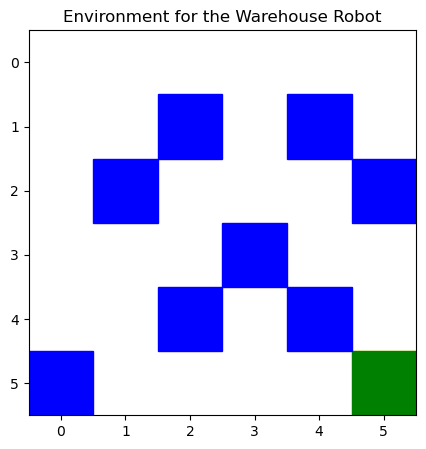

Greedy agent progress (SARSA):  60%|████▊   | 6/10 [00:02<00:01,  2.09Episode/s]

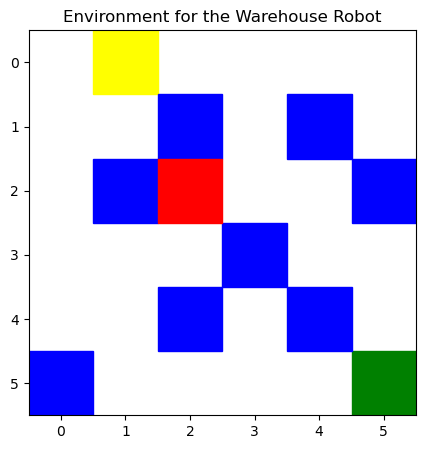

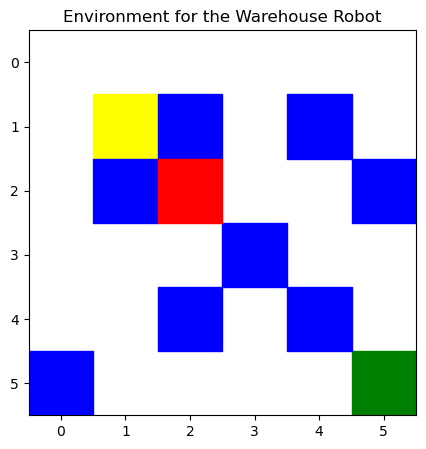

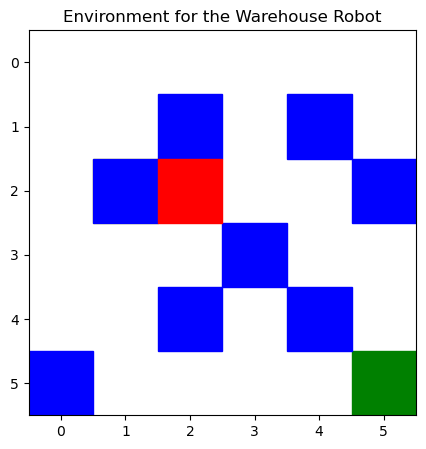

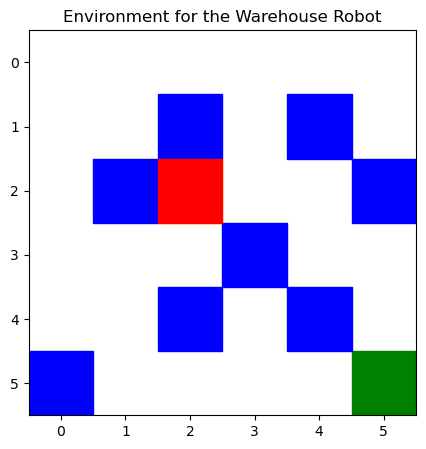

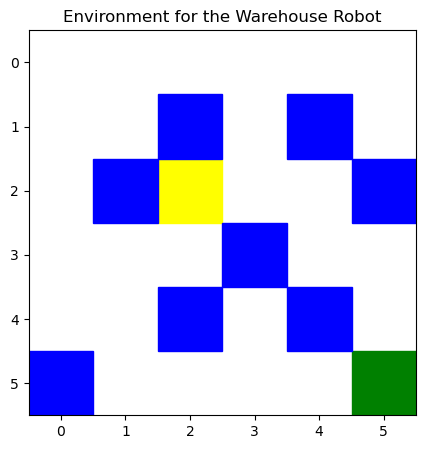

...

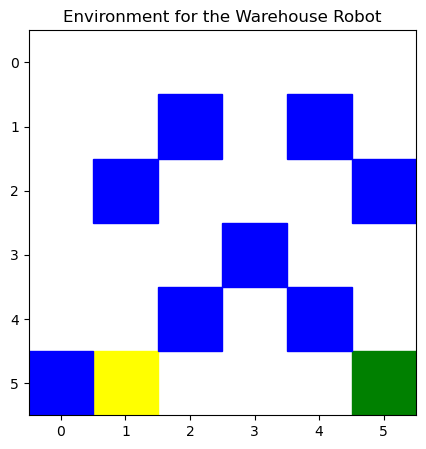

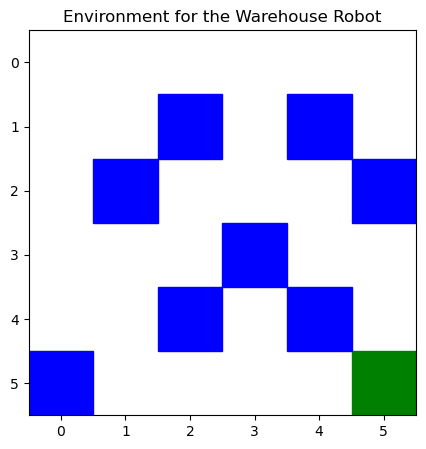

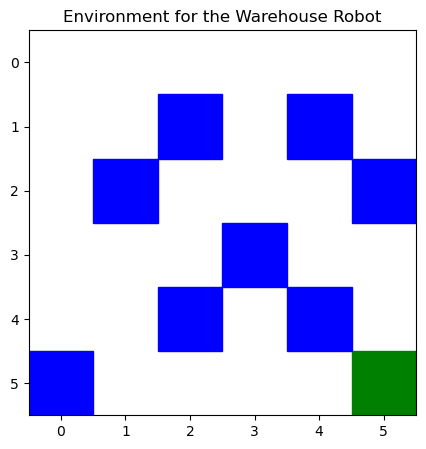

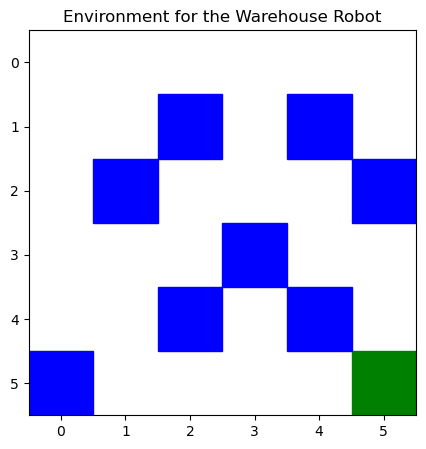

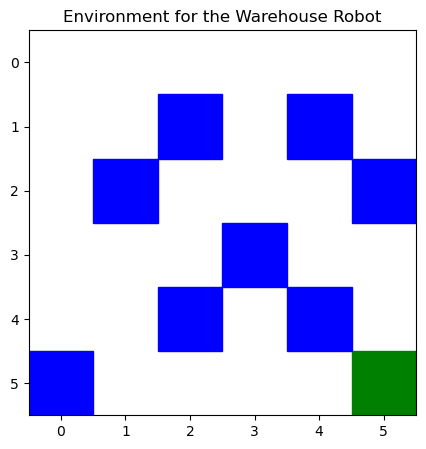

Greedy agent progress (SARSA):  70%|█████▌  | 7/10 [00:03<00:01,  2.13Episode/s]

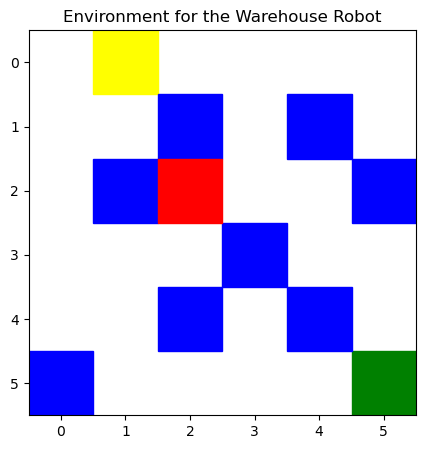

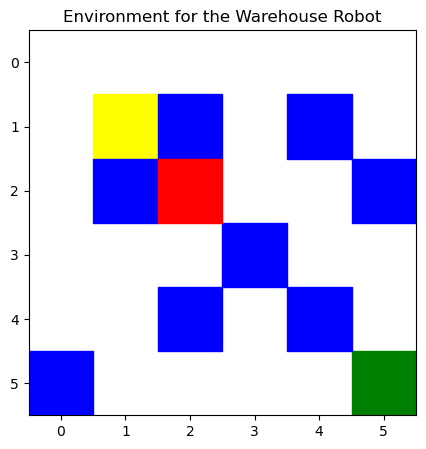

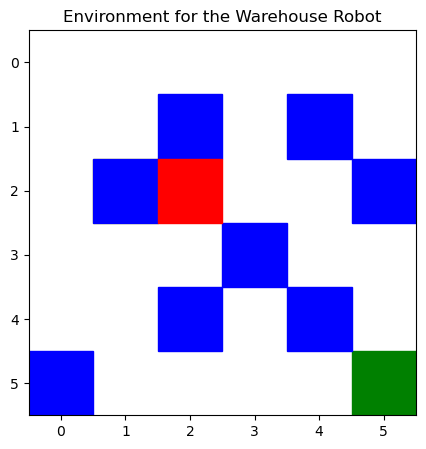

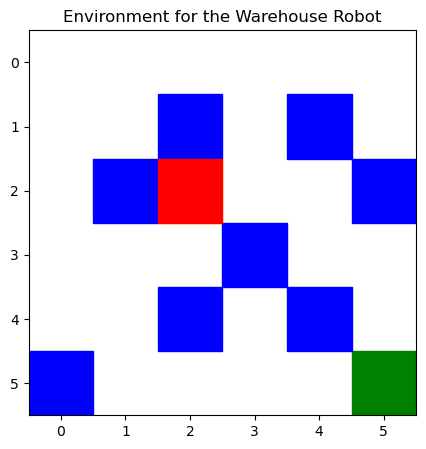

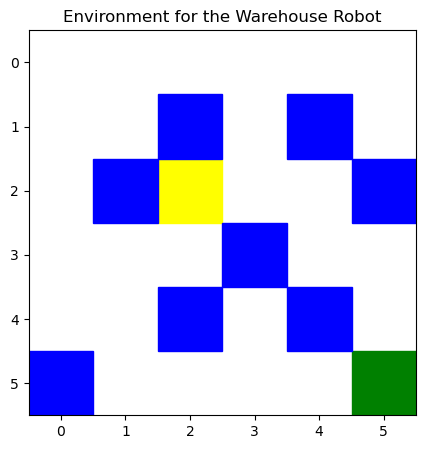

...

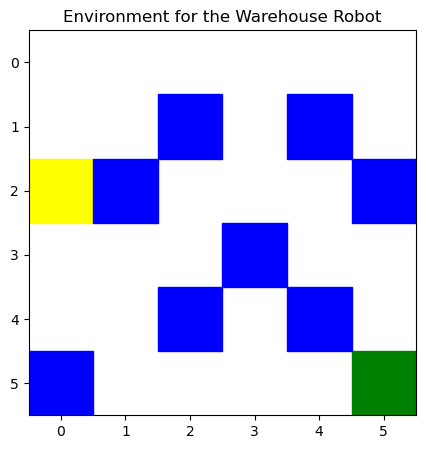

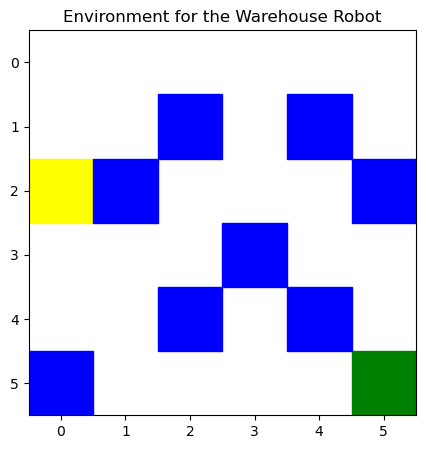

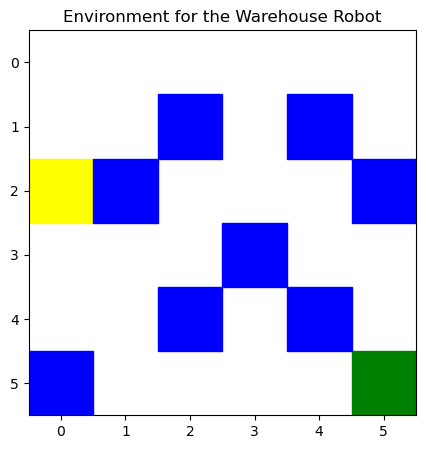

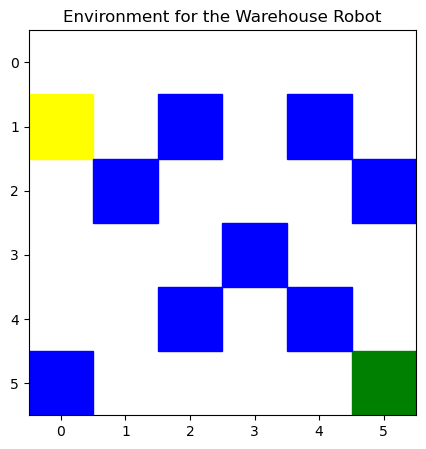

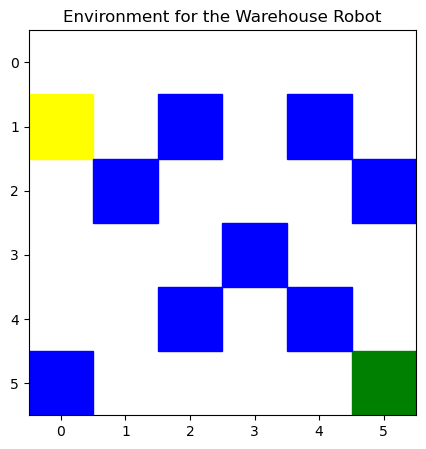

Greedy agent progress (SARSA):  80%|██████▍ | 8/10 [00:03<00:00,  2.16Episode/s]

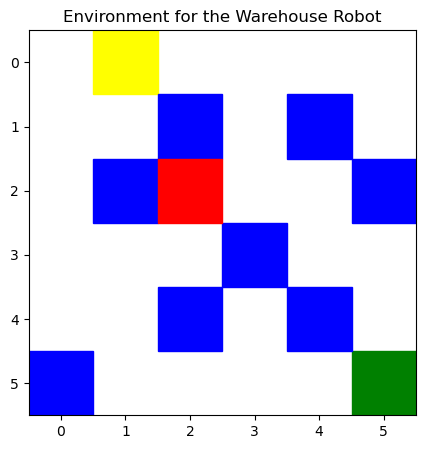

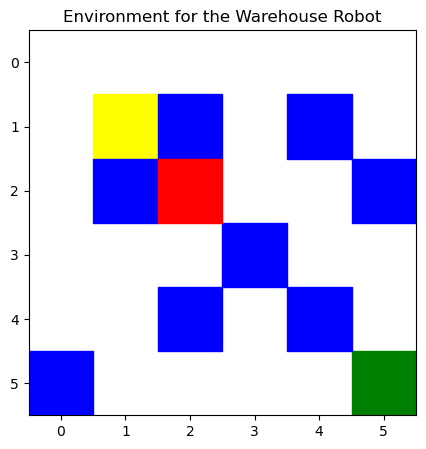

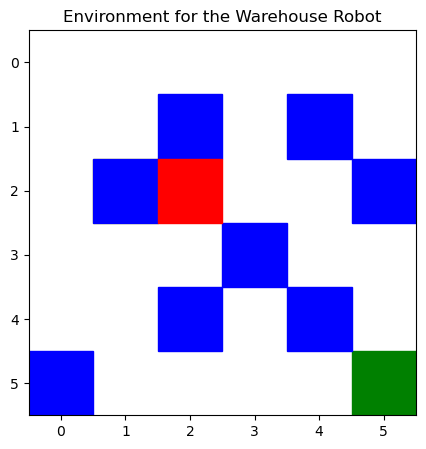

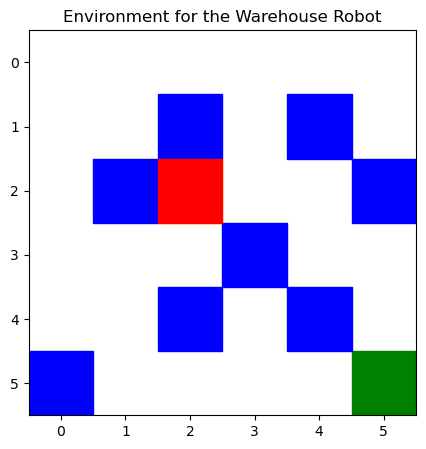

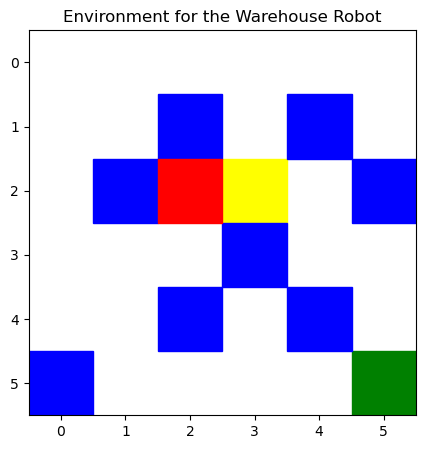

...

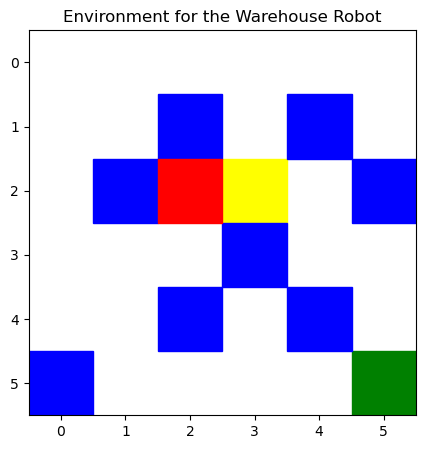

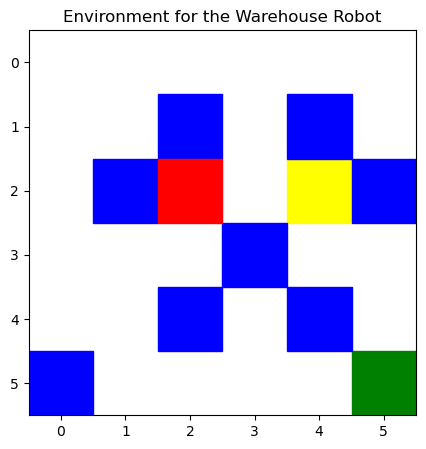

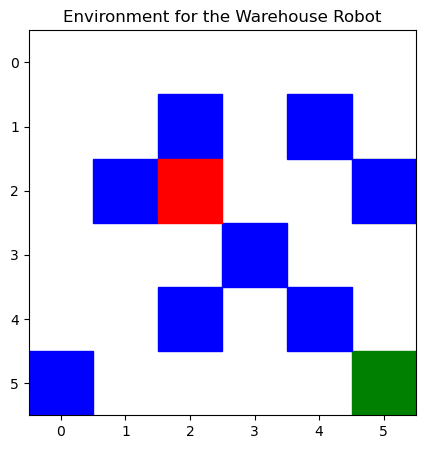

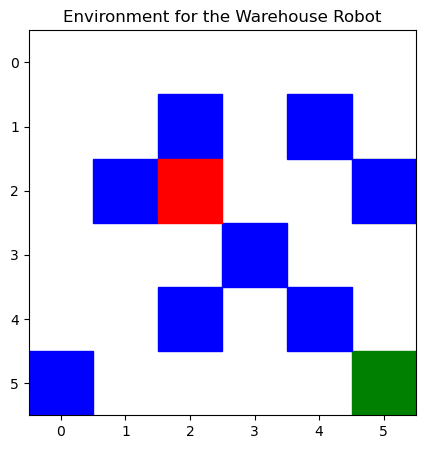

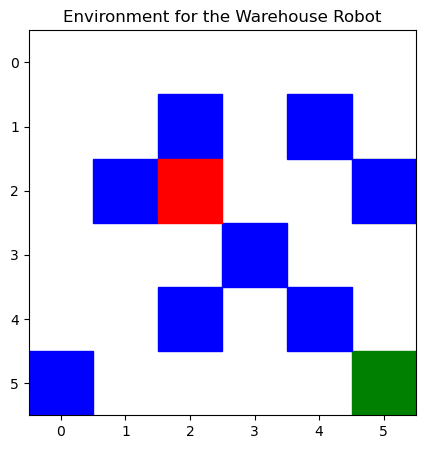

Greedy agent progress (SARSA):  90%|███████▏| 9/10 [00:04<00:00,  2.07Episode/s]

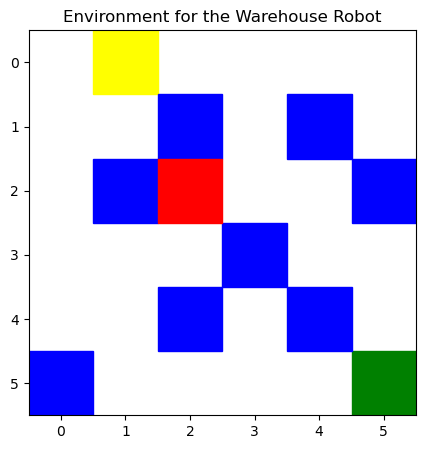

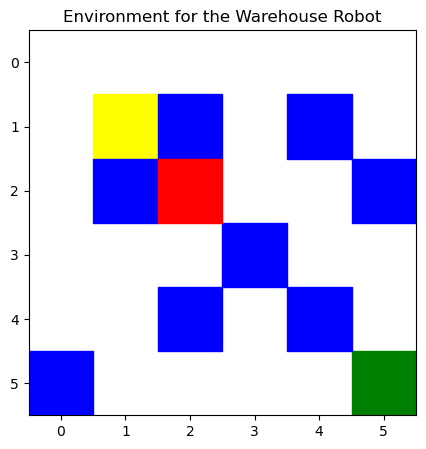

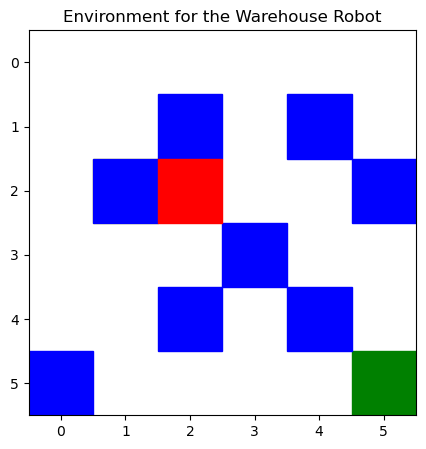

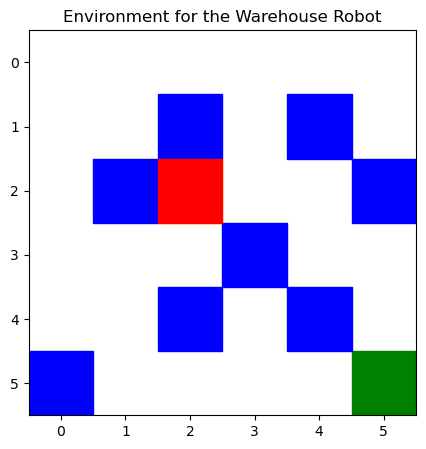

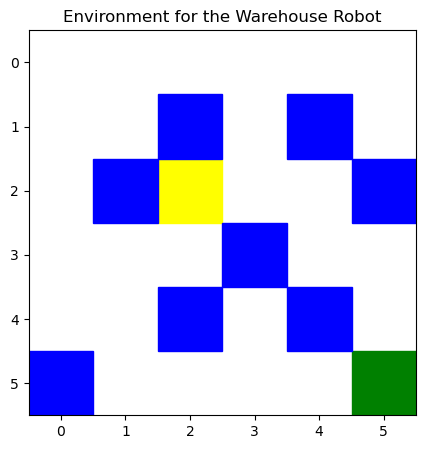

...

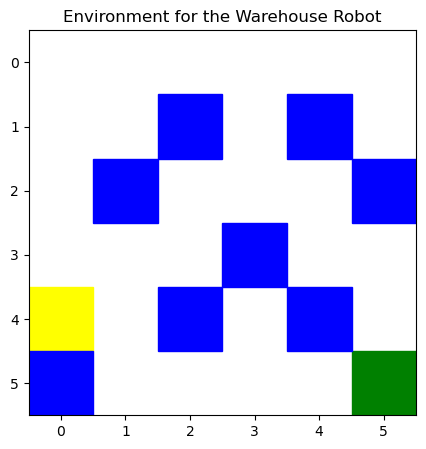

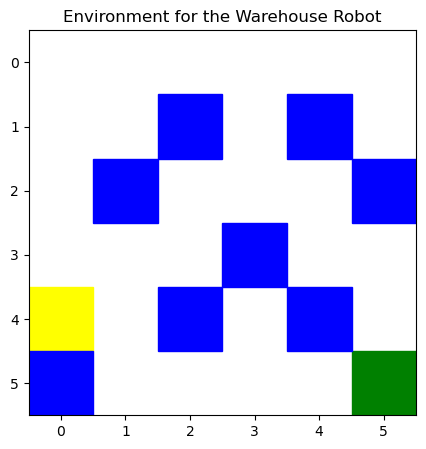

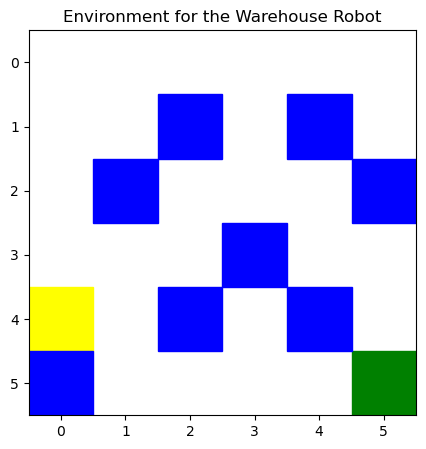

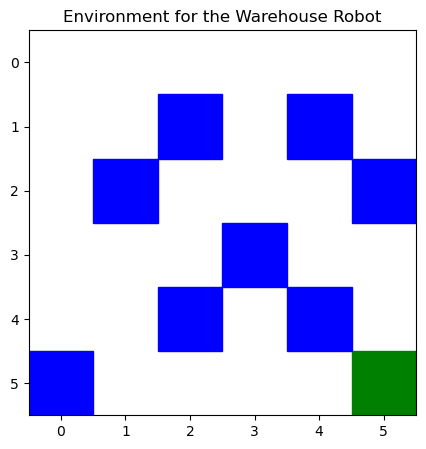

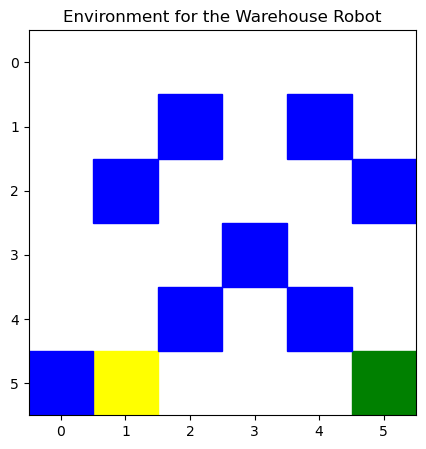

Greedy agent progress (SARSA): 100%|███████| 10/10 [00:04<00:00,  2.08Episode/s]


Total Rewards per Episode (SARSA): {0: -300, 1: -300, 2: -300, 3: -300, 4: -300, 5: -300, 6: -300, 7: -300, 8: -300, 9: -300}
Average Rewards per Episode (SARSA): -300.0


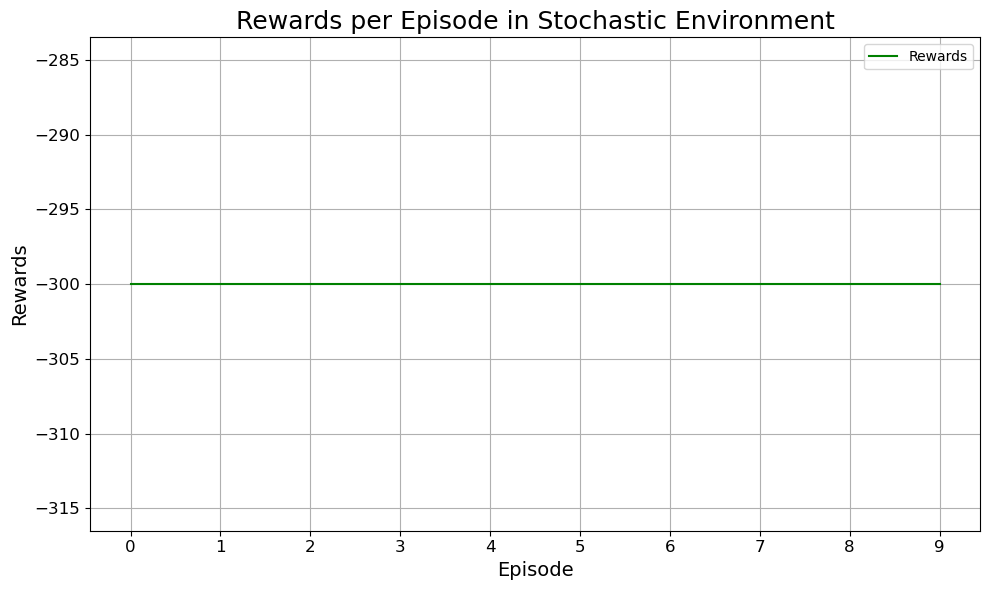

In [157]:
rewards, avg_rewards, epsilon_values, trained_agent_sarsa = episode_trainer_sarsa(
    environment_type='Stochastic', 
    episodes=1000, 
    steps=15, 
    discount_rate=0.99, 
    learning_rate=0.1
)

avg_ep_rewards, greedy_rwd_per_ep = greedy_agent_SARSA(trained_agent_sarsa, env, 10)

rewards_per_episode_plot(greedy_rwd_per_ep, 'Stochastic')


# Tune two Hyperparameters (Epsilon decay rate and Discount rate)

In [159]:
import optuna

def objective(trial):
    steps = 100
    episodes = 1000

    learning_rate = trial.suggest_float('learning_rate', 0.01, 1.0, log=True)
    discount_rate = trial.suggest_float('discount_rate', 0.3, 0.99)
    decay_rate = trial.suggest_float('decay_rate', 0.001, 0.1)
    max_epsilon = trial.suggest_float('max_epsilon', 0.5, 1.0)
    min_epsilon = trial.suggest_float('min_epsilon', 0.01, 0.1)

    env = WarehouseEnv(env_type='Deterministic', use_q_learning=False)  
    agent = whsarsa(env, learning_rate=learning_rate, discount_rate=discount_rate)

    total_reward = 0
    rewards_per_ep = {}
    
    for episode in range(episodes):
        epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay_rate * episode)

        episode_reward, _ , _ = train_sarsa(agent, env, steps=steps, epsilon=epsilon,
                                            discount_rate=discount_rate, learning_rate=learning_rate,
                                            episode_no=episode)
        rewards_per_ep[episode] = episode_reward
        total_reward += episode_reward

    return total_reward / episodes  

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

opt_trial = study.best_trial
print('Best Trial Value (Average Reward per Episode): ', opt_trial.value)
print('Best Trial Parameters: ', opt_trial.params)


[I 2024-09-26 03:31:01,769] A new study created in memory with name: no-name-85b436cd-505d-4aeb-b6d9-3e04b1353e86
[I 2024-09-26 03:31:02,280] Trial 0 finished with value: -996.02 and parameters: {'learning_rate': 0.07677898794170294, 'discount_rate': 0.6605727880595953, 'decay_rate': 0.01194192853315662, 'max_epsilon': 0.5288693860166503, 'min_epsilon': 0.08105519469658913}. Best is trial 0 with value: -996.02.
[I 2024-09-26 03:31:02,572] Trial 1 finished with value: -598.6 and parameters: {'learning_rate': 0.1757715881168092, 'discount_rate': 0.64586127199456, 'decay_rate': 0.00933390500328438, 'max_epsilon': 0.5279037960022448, 'min_epsilon': 0.09550376224201293}. Best is trial 1 with value: -598.6.
[I 2024-09-26 03:31:02,759] Trial 2 finished with value: -357.7 and parameters: {'learning_rate': 0.4924479902921254, 'discount_rate': 0.9174153814002857, 'decay_rate': 0.07230283372889211, 'max_epsilon': 0.6645771932309648, 'min_epsilon': 0.03643420054132975}. Best is trial 2 with value:

Best Trial Value (Average Reward per Episode):  -357.7
Best Trial Parameters:  {'learning_rate': 0.4924479902921254, 'discount_rate': 0.9174153814002857, 'decay_rate': 0.07230283372889211, 'max_epsilon': 0.6645771932309648, 'min_epsilon': 0.03643420054132975}


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 258.10Episode/s]


Average Rewards over all Episodes: -6337.084


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 250.56Episode/s]


Average Rewards over all Episodes: -6421.84


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 251.73Episode/s]


Average Rewards over all Episodes: -6554.348


Training progress: 100%|██████████████| 5000/5000 [00:21<00:00, 227.69Episode/s]


Average Rewards over all Episodes: -7081.936


Training progress: 100%|██████████████| 5000/5000 [00:22<00:00, 226.38Episode/s]


Average Rewards over all Episodes: -7082.528


Training progress: 100%|██████████████| 5000/5000 [00:22<00:00, 223.22Episode/s]


Average Rewards over all Episodes: -7084.56


Training progress: 100%|██████████████| 5000/5000 [00:18<00:00, 270.07Episode/s]


Average Rewards over all Episodes: -5825.576


Training progress: 100%|██████████████| 5000/5000 [00:18<00:00, 265.45Episode/s]


Average Rewards over all Episodes: -5957.708


Training progress: 100%|██████████████| 5000/5000 [00:19<00:00, 258.31Episode/s]


Average Rewards over all Episodes: -6162.596


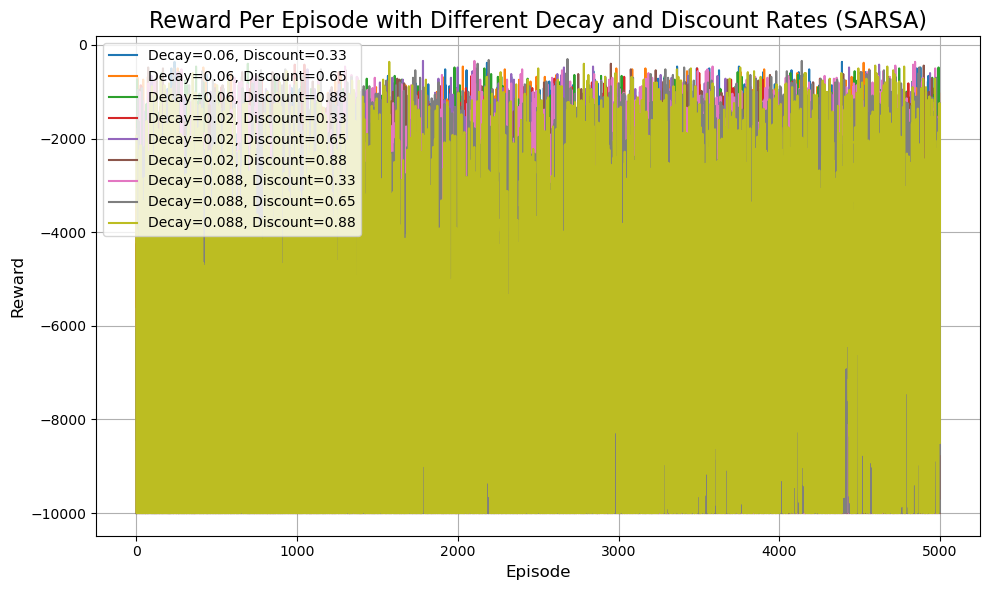

In [160]:
# Run the SARSA method for episode trainer with the provided parameters


def optimized_episode_runner(**kwargs):
    learning_rate = 0.8
    max_epsilon = 1.0
    min_epsilon = 0.01

    decay_rate = kwargs.get('decay_rate', 0.5)
    discount_rate = kwargs.get('discount_rate', 0.97)
    environment_type = kwargs.get('environment_type', 'Deterministic')

    reward_per_eps, avg_rewards_per_eps, epsilon_values, agent = episode_trainer_sarsa(
        environment_type=environment_type,
        episodes=5000,  
        steps=500,     
        discount_rate=discount_rate,
        learning_rate=learning_rate,
        decay_rate=decay_rate
    )

    return reward_per_eps, avg_rewards_per_eps, epsilon_values
# try here three different combination of decay rate and discount rate
decay_rates = [0.06, 0.02, 0.088]
discount_rates = [0.33, 0.65, 0.88]

plt.figure(figsize=(10, 6))
plt.title('Reward Per Episode with Different Decay and Discount Rates (SARSA)', fontsize=16)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Reward', fontsize=12)

for i, decay_rate in enumerate(decay_rates):
    for j, discount_rate in enumerate(discount_rates):
        reward_per_ep, avg_ep_rewards, epsilon_values = optimized_episode_runner(
            decay_rate=decay_rate, discount_rate=discount_rate
        )

        rewards = np.array(list(reward_per_ep.values())).flatten()
        plt.plot(rewards, label=f'Decay={decay_rate}, Discount={discount_rate}')

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# References: 
# a) Demo lecture by Dr. Alina (https://ubuffalo-my.sharepoint.com/personal/avereshc_buffalo_edu/_layouts/15/onedrive.aspx?id=%2Fpersonal%2Favereshc%5Fbuffalo%5Fedu%2FDocuments%2F2024%5FFall%5FRL%2F%5Fpublic%2FCourse%20Materials%2FRL%20Environment%20Demo&ga=1)
# b)Demo lecture by TA (https://ubuffalo-my.sharepoint.com/personal/avereshc_buffalo_edu/_layouts/15/onedrive.aspx?id=%2Fpersonal%2Favereshc%5Fbuffalo%5Fedu%2FDocuments%2F2024%5FFall%5FRL%2F%5Fpublic%2FCourse%20Materials%2FRL%20Environment%20Visualization&ga=1)
# c) Demo lecture by Dr. Alina ( Python demo tutorial for Multi-armed Bandit (MAB), https://piazza.com/class/m071wk03ok62ep/post/44)
# d) https://taraqur.medium.com/reinforcement-learning-2-agent-in-the-warehouse-ea07a605d3ff
# https://medium.com/@alwinraju/in-depth-guide-to-implementing-q-learning-in-python-with-openai-gyms-taxi-environment-cd356cc6a288
# Robotic Warehouse: https://github.com/semitable/robotic-warehouse
# Reinforcement Learning: Part 6: Temporal differencing (SARSA, Q learning, Expected SARSA) https://medium.com/@j13mehul/reinforcement-learning-part-6-temporal-differencing-sarsa-q-learning-expected-sarsa-b7725c755410
# Class lecture
